# Proyecto: Predicción de Precios de vivienda en la ciudad de Medellin y el Área Metropolitana

Elaborado por: Angie Medina

## Importar las librerias

In [1]:
from google.cloud import bigquery
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from pandas import Series
%matplotlib inline
import unicodedata
import plotly.express as px
from _plotly_future_ import v4_subplots
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
import matplotlib.pyplot as plt
from plotly import tools
from plotly.subplots import make_subplots
import scipy as sp
from scipy import stats
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn import preprocessing
from sklearn.feature_selection import RFE
from sklearn.model_selection import cross_val_score,KFold
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error
import math
import xgboost
from xgboost import plot_importance
import pandas_profiling as profilereport

## Cargue inicial de los datos

Se realiza el cargue de los datos a partir de BigQuery

In [2]:
client = bigquery.Client()

In [3]:
viviendas = client.query("""SELECT *
            FROM `properati-dw.public.ads`
            WHERE country = "Colombia"
            AND place.l1 = "Colombia"
            AND place.l2 = 'Antioquia'
            AND property.operation = 'Venta'
            AND property.price > 0
        """
).to_dataframe()

In [4]:
def table(df):
    df['lat'] = df['place'].map(lambda x: x['lat'])
    df['lon'] = df['place'].map(lambda x: x['lon'])
    df['l1'] = df['place'].map(lambda x: x['l1'])
    df['l2'] = df['place'].map(lambda x: x['l2'])
    df['l3'] = df['place'].map(lambda x: x['l3'])
    df['l4'] = df['place'].map(lambda x: x['l4'])
    df['operation'] = df['property'].map(lambda x: x['operation'])
    df['property_type'] = df['property'].map(lambda x: x['type'])
    df['rooms'] = df['property'].map(lambda x: x['rooms'])
    df['bedrooms'] = df['property'].map(lambda x: x['bedrooms'])
    df['bathrooms'] = df['property'].map(lambda x: x['bathrooms'])
    df['surface_total'] = df['property'].map(lambda x: x['surface_total'])
    df['surface_covered'] = df['property'].map(lambda x: x['surface_covered'])
    df['price'] = df['property'].map(lambda x: x['price'])
    df['currency'] = df['property'].map(lambda x: x['currency'])
    df['price_period'] = df['property'].map(lambda x: x['price_period'])
    df['title'] = df['property'].map(lambda x: x['title'])
    df['description'] = df['property'].map(lambda x: x['description'])
    return df

In [5]:
viviendas = table(viviendas)

viviendas= pd.read_csv('data/propiedades.csv', delimiter=',')
viviendas.shape

Se visualiza un ejemplo de los datos

In [6]:
viviendas=viviendas.copy()

In [7]:
viviendas.head(5)

,type,type_i18n,country,id,start_date,end_date,created_on,place,property,development,...,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,currency,price_period,title,description
0,Propiedad,Propiedad,Colombia,b'\x90\xd6\x8cd\xa0)\xfb\xe0\x99\xf6/\xf8\x89\...,2021-08-22,2021-11-03,2021-08-22,"{'lat': 6.485831, 'lon': -75.019623, 'l1': 'Co...","{'operation': 'Venta', 'operation_i18n': 'Vent...",None,...,3.0,3.0,2.0,NaN,NaN,110000000,COP,None,CASA EN PRIMER PISO MUY ACOGEDORA,CASA EN PRIMER PISO MUY ACOGEDORA \n\n\n A tan...
1,Propiedad,Propiedad,Colombia,b'\x06\x13\xb7\x9ar5h\xdd\xe2\x06D\xc1\xf3\x90pC',2021-08-22,2021-11-03,2021-08-22,"{'lat': 6.538376, 'lon': -75.087067, 'l1': 'Co...","{'operation': 'Venta', 'operation_i18n': 'Vent...",None,...,5.0,5.0,4.0,NaN,NaN,330000000,COP,None,CASA MAS APARTAMENTO CON PISCINA EN CISNEROS A...,CASA MAS APARTAMENTO CON PISCINA EN CISNEROS A...
2,Propiedad,Propiedad,Colombia,b'W\xe2k\xd0*\xae\xf4e\xd3\xa9\xbe\xa6\x92\xe3...,2021-08-22,9999-12-31,2021-08-22,"{'lat': 6.485831, 'lon': -75.019623, 'l1': 'Co...","{'operation': 'Venta', 'operation_i18n': 'Vent...",None,...,NaN,NaN,NaN,NaN,NaN,250000000,COP,None,CASA LOTE CON MAS DE 200M2 EN SAN ROQUE ANTIOQ...,CASA LOTE CON MAS DE 200M2 EN SAN ROQUE ANTIOQ...
3,Propiedad,Propiedad,Colombia,b'y\xf4\xec\xacwqG%RK\x84\xea\xfai}{',2021-08-22,2021-10-07,2021-08-22,"{'lat': 6.1502713, 'lon': -75.3953978, 'l1': '...","{'operation': 'Venta', 'operation_i18n': 'Vent...",None,...,4.0,4.0,5.0,NaN,NaN,855000000,COP,None,CESIÓN DERECHOS CASA LOTUS RIONEGRO,El proyecto Lotus casas está ubicado en una zo...
4,Propiedad,Propiedad,Colombia,b'\xfd:\x91\x820a\xd6\xa6\x99\xdf\xcc\x0c\xed\...,2021-08-22,2021-11-03,2021-08-22,"{'lat': 6.485831, 'lon': -75.019623, 'l1': 'Co...","{'operation': 'Venta', 'operation_i18n': 'Vent...",None,...,2.0,2.0,1.0,NaN,NaN,110000000,COP,None,CASA CON BUENA UBICACION EN SAN ROQUE,CASA CON BUENA UBICACION EN SAN ROQUE\n\n\n A ...


Se revisa el tamaño del dataset

In [8]:
viviendas.shape

(578490, 28)

Se revisa la presencia de valores Nulos en los datos y tipo de datos

In [9]:
viviendas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 578490 entries, 0 to 578489
Data columns (total 28 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   type             578490 non-null  object 
 1   type_i18n        578490 non-null  object 
 2   country          578490 non-null  object 
 3   id               578490 non-null  object 
 4   start_date       578490 non-null  object 
 5   end_date         578490 non-null  object 
 6   created_on       578490 non-null  object 
 7   place            578490 non-null  object 
 8   property         578490 non-null  object 
 9   development      0 non-null       object 
 10  lat              412424 non-null  float64
 11  lon              412426 non-null  float64
 12  l1               578490 non-null  object 
 13  l2               578490 non-null  object 
 14  l3               578490 non-null  object 
 15  l4               578490 non-null  object 
 16  operation        578490 non-null  obje

Revisamos los tipos de valores de las columnas

## Selección de datos para la ciudad de Medellin 
El dataset presenta los datos de todo colombia, se desea filtrar los mismos para seleccionar solo los correspondientes a la ciudad de Medellin y el area metropolitana

Se visualiza los datos relacionados con la localización:

In [10]:
viviendas[['l1','l2','l3', 'l4']]

,l1,l2,l3,l4
0,Colombia,Antioquia,,
1,Colombia,Antioquia,,
2,Colombia,Antioquia,,
3,Colombia,Antioquia,,
4,Colombia,Antioquia,,
...,...,...,...,...
578485,Colombia,Antioquia,La Estrella,
578486,Colombia,Antioquia,La Estrella,
578487,Colombia,Antioquia,,
578488,Colombia,Antioquia,Medellín,El Poblado


Se filtran el listtado de ciudades o municipios del departamento de Antioquia a partir de la columna l3

In [11]:
viviendas['l3'].value_counts()

Medellín                  294615
Envigado                   68668
                           50415
Bello                      34466
Sabaneta                   31892
Rionegro                   25247
Itagui                     20133
La Ceja                    11247
La Estrella                 9384
Guarne                      5509
Marinilla                   4150
Copacabana                  3758
Retiro                      3669
Barbosa                     2605
Girardota                   2206
Sopetrán                    2029
El Carmen de Viboral        1719
Caldas                      1552
San Jerónimo                1481
Guatapé                      730
Fredonia                     691
Venecia                      500
Abejorral                    329
San Rafael                   315
Peñol                        312
Santafé de Antioquia         309
Armenia                      120
Ciudad Bolívar               116
Puerto Triunfo                83
Jardín                        68
Hispania  

Para extraer unicamente los datos de la ciudad de medellín  y el area metropolitana se debe debe filtrar de la columnas l3 los datos correspondientes a Medellín y 9 municipios más, estos son: Caldas, Sabaneta, Itagüí, Envigado, Bello, Copacabana, Girardota, La Estrella y Barbosa

In [12]:
viviendas_Medellin=viviendas[(viviendas['l3']=='Medellín')| (viviendas['l3']=='Envigado') |(viviendas['l3']=='Sabaneta')|(viviendas['l3']=='Itagui')|(viviendas['l3']=='Bello')|(viviendas['l3']=='La Estrella')|(viviendas['l3']=='Caldas')|(viviendas['l3']=='Copacabana')|(viviendas['l3']=='Girardota')|(viviendas['l3']=='Barbosa')]
viviendas_Medellin.sample(2)

,type,type_i18n,country,id,start_date,end_date,created_on,place,property,development,...,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,currency,price_period,title,description
101375,Propiedad,Propiedad,Colombia,b'\x01\xaa+Iu\x08\x95\xc4\xf4sS\xd1\xa3\x89e\x00',2019-12-04,2020-02-05,2019-12-04,"{'lat': 6.2047488877, 'lon': -75.5512507669, '...","{'operation': 'Venta', 'operation_i18n': 'Vent...",None,...,1.0,1.0,NaN,NaN,NaN,575000000,COP,None,Venta apartamento Cola del Zorro El Poblado,"Hermoso apartamento Moderno, \n\nApartaestudio..."
216352,Propiedad,Propiedad,Colombia,"b'\xf4M}At\xd2\\H\x87""3\x93w\xd7\xf5\xae'",2019-04-25,2019-05-22,2019-04-25,"{'lat': 6.1604486353, 'lon': -75.5755567705, '...","{'operation': 'Venta', 'operation_i18n': 'Vent...",None,...,2.0,NaN,2.0,NaN,114.0,590000000,COP,None,"Apartamento en venta Las brujas, Envigado.",CODIGO DEL INMUEBLE: 691480Apartamento en vent...


In [13]:
viviendas_Medellin_venta=viviendas_Medellin[(viviendas_Medellin['operation']=='Venta')]
viviendas_Medellin_venta.shape

(469279, 28)

## Exploración básica de los datos

Se explora el tamaño de los datos

In [14]:
viviendas_Medellin_venta.shape

(469279, 28)

Se visualiza un ejemplo de los datos

In [15]:
viviendas_Medellin_venta.head(5)

,type,type_i18n,country,id,start_date,end_date,created_on,place,property,development,...,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,currency,price_period,title,description
7,Propiedad,Propiedad,Colombia,b'U\x81\xe9\xef\x17\x04\xf4\x16\x9b\x02>\x91&\...,2021-08-22,9999-12-31,2021-08-22,"{'lat': 6.166500563, 'lon': -75.5934641262, 'l...","{'operation': 'Venta', 'operation_i18n': 'Vent...",None,...,4.0,4.0,4.0,NaN,NaN,650000000,COP,None,Casa con gran ubicación en Envigado,"Casa en urbanización villas del vallejuelo, mu..."
8,Propiedad,Propiedad,Colombia,b'E\xdc\x86\x8d\xc3\xc5W\x82\x83\xe1#\xd0\x16`...,2021-08-22,9999-12-31,2021-08-22,"{'lat': 3.4316627075, 'lon': -76.5219439069, '...","{'operation': 'Venta', 'operation_i18n': 'Vent...",None,...,10.0,10.0,5.0,NaN,NaN,470000000,COP,None,SE VENDE CASA 3 PISOS EN SANTA ELENA (K.D)(MIC...,Se vende casa de tres Pisos tri-familiar en el...
34,Propiedad,Propiedad,Colombia,"b'\xc5#%\x84!""\xbd\xf9\xb3M(\x8c\xa6~\xf1\xdd'",2021-08-22,2021-11-23,2021-08-22,"{'lat': 6.1525873373, 'lon': -75.5404472351, '...","{'operation': 'Venta', 'operation_i18n': 'Vent...",None,...,NaN,NaN,NaN,NaN,NaN,1300000000,COP,None,Lote conjunto resindecial Alto de las Palmas s...,Lote situado en el Alto de las Palmas en conju...
35,Propiedad,Propiedad,Colombia,b'1\xda\x0f\x82\xb4\x92k7\xe3\xe0o\x9d\xa9\xb1...,2021-08-22,2021-10-02,2021-08-22,"{'lat': 6.3774241, 'lon': -75.4455662, 'l1': '...","{'operation': 'Venta', 'operation_i18n': 'Vent...",None,...,NaN,NaN,NaN,NaN,NaN,8632000000,COP,None,LOTE EN GIRARDOTA SOBRE LA CALZADA BELLO - HAT...,LOTE EN GIRARDOTA SOBRE LA CALZADA BELLO - HAT...
57,Propiedad,Propiedad,Colombia,b'\xaa@\x8aP0\xfaw\xfc\xdc\xbc\xcb9\x9fV\xd9\x85',2021-08-22,2022-02-22,2021-08-22,"{'lat': 6.1667529747, 'lon': -75.5951213837, '...","{'operation': 'Venta', 'operation_i18n': 'Vent...",None,...,NaN,NaN,NaN,NaN,NaN,235000000,COP,None,"Apartamento en Venta. Envigado, Las Cometas.","Cod. 4392646. Spacios tiene en Venta, agradabl..."


Se revisa la presencia de valores Nulos en los datos y tipo de datos

In [16]:
viviendas_Medellin_venta.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 469279 entries, 7 to 578489
Data columns (total 28 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   type             469279 non-null  object 
 1   type_i18n        469279 non-null  object 
 2   country          469279 non-null  object 
 3   id               469279 non-null  object 
 4   start_date       469279 non-null  object 
 5   end_date         469279 non-null  object 
 6   created_on       469279 non-null  object 
 7   place            469279 non-null  object 
 8   property         469279 non-null  object 
 9   development      0 non-null       object 
 10  lat              331251 non-null  float64
 11  lon              331252 non-null  float64
 12  l1               469279 non-null  object 
 13  l2               469279 non-null  object 
 14  l3               469279 non-null  object 
 15  l4               469279 non-null  object 
 16  operation        469279 non-null  obje

Se tiene la siguiente lista de variables en el dataset:


0. **type:** Tipo de aviso (Propiedad, Desarrollo/Proyecto) 
1. **type_i18n:** Tipo de aviso (Propiedad, Desarrollo/Proyecto) 
2. **country:** País en el que está publicado el aviso (Argentina, Uruguay, Colombia, Ecuador, Perú)
3. **id:** Identificador del aviso. No es único: si el aviso es actualizado por la inmobiliaria (nueva versión del aviso) se crea un nuevo registro con la misma id pero distintas fechas: de alta y de baja
4. **start_date:** Fecha de alta del aviso
5. **end_date:** Fecha de baja del aviso
6. **created_on:** Fecha de alta de la primera versión del aviso
7. **place:** Campos referidos a la ubicación de la propiedad o del desarrollo. Diccionario con coordenadas latitud y longitud del inmueble
8. **property:** Campos relativos a la propiedad (vacío si el aviso es de un desarrollo/proyecto)
9. **development :** Campos relativos al desarrollo inmobiliario (vacío si el aviso es de una propiedad)
10. **lat:** Latitud de la localización del inmueble
11. **lon:** Longitud de la localización del inmueble
12. **l1:** Ubicación de la propiedad o del desarrollo Nivel administrativo 1 país: Colombia
13. **l2:** Ubicación de la propiedad o del desarrollo Nivel administrativo 2 provincia o departamento 
14. **l3:** Ubicación de la propiedad o del desarrollo Nivel administrativo 3 ciudad
15. **l4:** Ubicación de la propiedad o del desarrollo Nivel administrativo 4 barrio
16. **operation:** Tipo de operación (Venta, Alquiler)
17. **property_type:** Tipo de propiedad (Casa, Departamento, PH)
18. **rooms:** Cantidad de ambientes (útil en Argentina)
19. **bedrooms:** Cantidad de dormitorios (útil en el resto de los países)
20. **bathrooms:** Cantidad de baños
21. **surface_total:** Area total del inmueble en m²
22. **surface_covered:** Area cubierta del inmueble en m²
23. **price:** Precio del inmueble publicado en el anuncio
24. **currency:** Moneda del precio publicado del inmueble 
25. **price_period:** Periodo del precio (Diario, Semanal, Mensual)
26. **title:** Título del anuncio
27. **description:** Descripción del anuncio

Se presentan las estadísticas de las variables numéricas:

## Limpieza de los datos

### Consistencia de los datos

Se revisa inicialmente los valores en cada columna

In [17]:
viviendas_Medellin_venta.columns

Index(['type', 'type_i18n', 'country', 'id', 'start_date', 'end_date',
       'created_on', 'place', 'property', 'development', 'lat', 'lon', 'l1',
       'l2', 'l3', 'l4', 'operation', 'property_type', 'rooms', 'bedrooms',
       'bathrooms', 'surface_total', 'surface_covered', 'price', 'currency',
       'price_period', 'title', 'description'],
      dtype='object')

In [18]:
viviendas_Medellin_venta['type'].value_counts()

Propiedad    469279
Name: type, dtype: int64

In [19]:
viviendas_Medellin_venta['start_date'].value_counts()

2022-02-22    11473
2019-02-27     5796
2018-08-11     5776
2020-01-25     4094
2017-01-30     4001
              ...  
2016-06-01        1
2017-08-17        1
2018-05-04        1
2018-06-28        1
2018-07-04        1
Name: start_date, Length: 2068, dtype: int64

In [20]:
viviendas_Medellin_venta['end_date'].value_counts()

9999-12-31    27247
2022-08-17     7660
2022-08-09     6383
2019-11-06     5541
2022-02-23     5007
              ...  
2017-03-11        1
2016-09-25        1
2015-08-12        1
2017-08-22        1
2017-02-21        1
Name: end_date, Length: 2051, dtype: int64

In [21]:
viviendas_Medellin_venta['created_on'].value_counts()

2022-02-22    11473
2019-02-27     5796
2018-08-11     5776
2020-01-25     4094
2017-01-30     4001
              ...  
2016-06-01        1
2017-08-17        1
2018-05-04        1
2018-06-28        1
2018-07-04        1
Name: created_on, Length: 2068, dtype: int64

Se identifica un dato inconsistente en el campo end_date 9999-12-31

In [22]:
viviendas_Medellin_venta=viviendas_Medellin_venta.replace('9999-12-31', '2050-12-31')

In [23]:
viviendas_Medellin_venta['end_date'].value_counts()

9999-12-31    27247
2022-08-17     7660
2022-08-09     6383
2019-11-06     5541
2022-02-23     5007
              ...  
2017-03-11        1
2016-09-25        1
2015-08-12        1
2017-08-22        1
2017-02-21        1
Name: end_date, Length: 2051, dtype: int64

### Tipos de datos

Cambiar tipo de dato de la columna start_date, end_date, created_on a tipo fecha

In [24]:
viviendas_Medellin_venta['start_date']=pd.to_datetime(viviendas_Medellin_venta['start_date'])
viviendas_Medellin_venta['created_on']=pd.to_datetime(viviendas_Medellin_venta['created_on'])

Cambiar tipo de dato de columnas tipos categóricas

In [25]:
viviendas_Medellin_venta['type']=viviendas_Medellin_venta['type'].astype('category')
viviendas_Medellin_venta['country']=viviendas_Medellin_venta['country'].astype('category')
viviendas_Medellin_venta['id']=viviendas_Medellin_venta['id'].astype('category')
viviendas_Medellin_venta['l1']=viviendas_Medellin_venta['l1'].astype('category')
viviendas_Medellin_venta['l2']=viviendas_Medellin_venta['l2'].astype('category')
viviendas_Medellin_venta['l3']=viviendas_Medellin_venta['l3'].astype('category')
viviendas_Medellin_venta['l4']=viviendas_Medellin_venta['l4'].astype('category')
viviendas_Medellin_venta['currency']=viviendas_Medellin_venta['currency'].astype('category')
viviendas_Medellin_venta['property_type']=viviendas_Medellin_venta['property_type'].astype('category')
viviendas_Medellin_venta['operation']=viviendas_Medellin_venta['operation'].astype('category')
viviendas_Medellin_venta['title']=viviendas_Medellin_venta['title'].astype('category')
viviendas_Medellin_venta['price_period']=viviendas_Medellin_venta['price_period'].astype('category')
viviendas_Medellin_venta['description']=viviendas_Medellin_venta['description'].astype('category')

In [26]:
viviendas_Medellin_venta.dtypes

type                     category
type_i18n                  object
country                  category
id                       category
start_date         datetime64[ns]
end_date                   object
created_on         datetime64[ns]
place                      object
property                   object
development                object
lat                       float64
lon                       float64
l1                       category
l2                       category
l3                       category
l4                       category
operation                category
property_type            category
rooms                     float64
bedrooms                  float64
bathrooms                 float64
surface_total             float64
surface_covered           float64
price                       int64
currency                 category
price_period             category
title                    category
description              category
dtype: object

### Normalizacion de los datos

Se presenta consitencia en los tipos de valores encontrados para cada variable, si embargo se aplica una serie de pasos para normalizar la información:

1. Se transforma toda la información a minúscula
2. Se eliminan las tildes

In [27]:
viviendas_Medellin_venta['type'] = viviendas_Medellin_venta['type'].str.lower()
viviendas_Medellin_venta['l1'] = viviendas_Medellin_venta['l1'].str.lower()
viviendas_Medellin_venta['l2'] = viviendas_Medellin_venta['l2'].str.lower()
viviendas_Medellin_venta['l3'] = viviendas_Medellin_venta['l3'].str.lower()
viviendas_Medellin_venta['l4'] = viviendas_Medellin_venta['l4'].str.lower()
viviendas_Medellin_venta['title'] = viviendas_Medellin_venta['title'].str.lower()
viviendas_Medellin_venta['description'] = viviendas_Medellin_venta['description'].str.lower()
viviendas_Medellin_venta['property_type'] = viviendas_Medellin_venta['property_type'].str.lower()
viviendas_Medellin_venta['operation'] = viviendas_Medellin_venta['operation'].str.lower()

Eliminar  columnas no relevantes:

In [28]:
viviendas_Medellin_venta=viviendas_Medellin_venta.drop(['type_i18n', 'type','place','development', 'property'], axis=1)

### Identificar datos Duplicados

Eliminar valores  valores duplicados en el dataset:

In [29]:
viviendas_Medellin_venta = viviendas_Medellin_venta.drop_duplicates()

In [30]:
viviendas_Medellin_venta.shape

(469279, 23)

In [31]:
viviendas_Medellin_venta['id'].value_counts()[viviendas_Medellin_venta['id'].value_counts()> 1]

Series([], Name: id, dtype: int64)

### Datos Nulos o perdidos

Algunas propiedades no tienen información de precio de venta. Este dato no se encuentra en la descripción y por tanto se eliminan estos registros

In [32]:
viviendas_Medellin_venta.isnull().any()

country            False
id                 False
start_date         False
end_date           False
created_on         False
lat                 True
lon                 True
l1                 False
l2                 False
l3                 False
l4                 False
operation          False
property_type      False
rooms               True
bedrooms            True
bathrooms           True
surface_total       True
surface_covered     True
price              False
currency           False
price_period        True
title              False
description        False
dtype: bool

Text(0.5, 1.0, 'Valores perdidos')

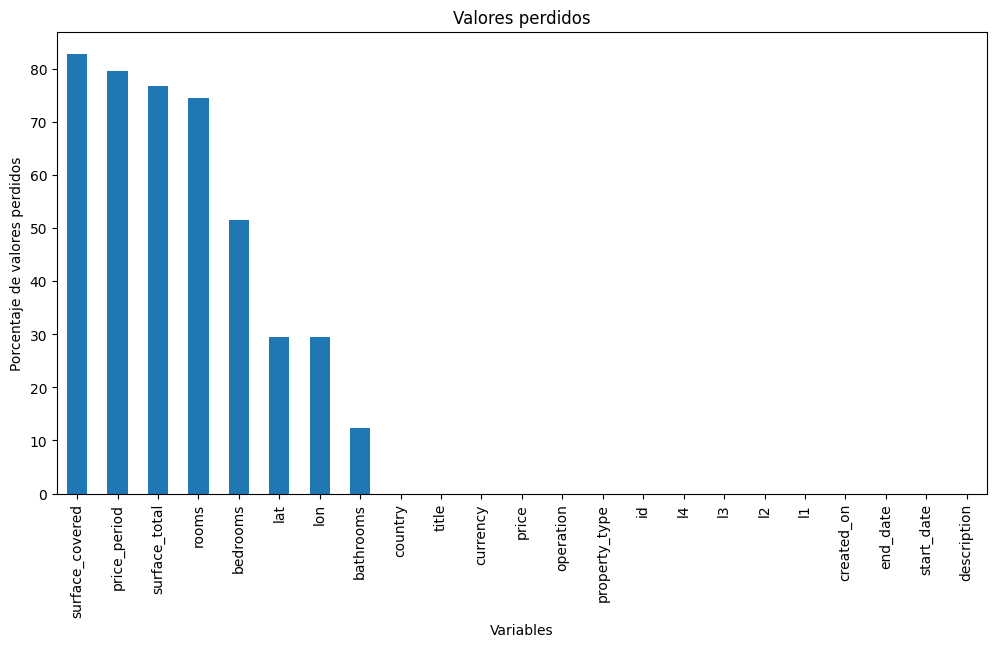

In [33]:
valores_perdidos=viviendas_Medellin_venta.isnull().mean().sort_values(ascending=False)
valores_perdidos=valores_perdidos*100
valores_perdidos.plot.bar(figsize=(12,6))
plt.ylabel('Porcentaje de valores perdidos')
plt.xlabel('Variables')
plt.title('Valores perdidos')

In [34]:
valores_perdidos

surface_covered    82.848156
price_period       79.637060
surface_total      76.682954
rooms              74.442709
bedrooms           51.456596
lat                29.412780
lon                29.412567
bathrooms          12.362156
country             0.000000
title               0.000000
currency            0.000000
price               0.000000
operation           0.000000
property_type       0.000000
id                  0.000000
l4                  0.000000
l3                  0.000000
l2                  0.000000
l1                  0.000000
created_on          0.000000
end_date            0.000000
start_date          0.000000
description         0.000000
dtype: float64

In [35]:
viviendas_Medellin_venta.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 469279 entries, 7 to 578489
Data columns (total 23 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   country          469279 non-null  category      
 1   id               469279 non-null  category      
 2   start_date       469279 non-null  datetime64[ns]
 3   end_date         469279 non-null  object        
 4   created_on       469279 non-null  datetime64[ns]
 5   lat              331251 non-null  float64       
 6   lon              331252 non-null  float64       
 7   l1               469279 non-null  object        
 8   l2               469279 non-null  object        
 9   l3               469279 non-null  object        
 10  l4               469279 non-null  object        
 11  operation        469279 non-null  object        
 12  property_type    469279 non-null  object        
 13  rooms            119935 non-null  float64       
 14  bedrooms         227

In [36]:
viviendas_Medellin_venta[(viviendas_Medellin_venta['price'].isnull())]

,country,id,start_date,end_date,created_on,lat,lon,l1,l2,l3,...,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,currency,price_period,title,description


In [37]:
viviendas_Medellin_venta.shape

(469279, 23)

### Relevancia
Se selecciona en el Dataset las variables que son relevantes 

In [38]:
viviendas_Medellin_venta=viviendas_Medellin_venta[['id', 'created_on', 'lat', 'lon',
       'l1', 'l2', 'l3', 'l4', 'bedrooms', 'bathrooms',
       'surface_total', 'surface_covered', 'price', 'currency',
       'title', 'description', 'property_type']]

### Agregar columnas

In [39]:
viviendas_Medellin_venta['price_m2']=viviendas_Medellin_venta['price']/viviendas_Medellin_venta['surface_total']

### Renombrar las columnas

In [40]:
viviendas_Medellin_venta=viviendas_Medellin_venta.rename(columns={'created_on': 'fecha_publicacion', 'lat': 'latitud' ,'lon':'longitud','l1':'pais', 'l2':'departamento', 'l3':'municipio', 'l4':'barrio', 'bedrooms':'habitaciones', 'bathrooms':'baños','surface_total':'superficie_total', 'surface_covered':'superficie_cubierta', 'price':'precio', 'currency':'moneda','title':'titulo', 'description':'descripcion', 'property_type':'tipo_propiedad','price_m2':'precio_m2'})

In [41]:
viviendas_Medellin_venta.columns

Index(['id', 'fecha_publicacion', 'latitud', 'longitud', 'pais',
       'departamento', 'municipio', 'barrio', 'habitaciones', 'baños',
       'superficie_total', 'superficie_cubierta', 'precio', 'moneda', 'titulo',
       'descripcion', 'tipo_propiedad', 'precio_m2'],
      dtype='object')

## Análisis Exploratorio de los datos

### Tipos de propiedades

In [42]:
tipos = viviendas_Medellin_venta['tipo_propiedad'].unique()
tipos = tipos.tolist()
print(tipos)

['casa', 'lote', 'departamento', 'casa de campo', 'otro', 'oficina', 'depósito', 'local comercial', 'cochera', 'ph']


In [43]:
viviendas_Medellin_venta['tipo_propiedad'].value_counts()

departamento       302647
casa                95011
otro                38175
lote                17206
local comercial      6906
oficina              4341
casa de campo        3722
depósito              819
cochera               361
ph                     91
Name: tipo_propiedad, dtype: int64

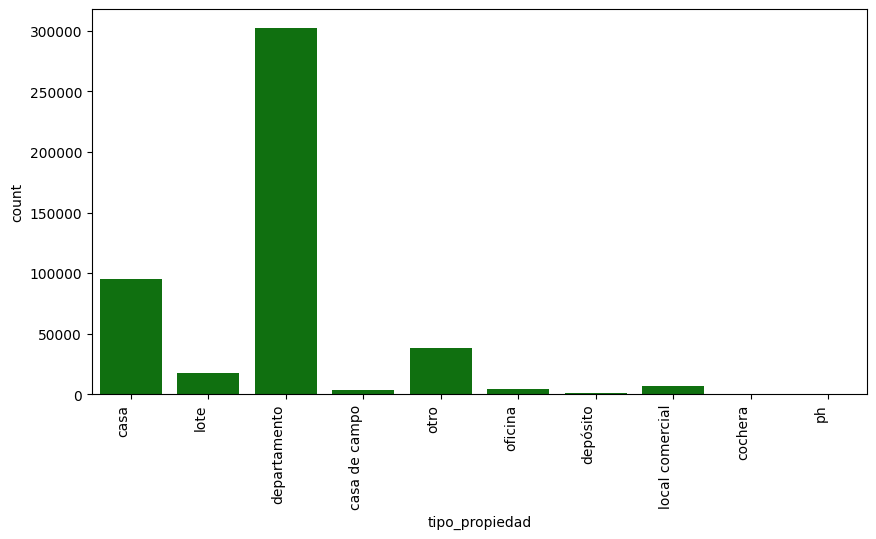

In [44]:
plt.figure(figsize=(10,5))
ax = sns.countplot(data = viviendas_Medellin_venta, x = 'tipo_propiedad',color="g")
ax.set_xticklabels(ax.get_xticklabels(),rotation=90,ha="right")
plt.show()

Propiedades correspondientes a casas y Departamentos

In [45]:
viviendas_Medellin_venta=viviendas_Medellin_venta[(viviendas_Medellin_venta['tipo_propiedad']=='casa')| (viviendas_Medellin_venta['tipo_propiedad']=='departamento')]

### Superficie total

Algunas propiedades no tienen información de área de la vivienda total o del área de vivienda cubierta. Este dato no se encuentra en la descripción y por tanto se eliminan estos registros

In [46]:
viviendas_Medellin_venta[(viviendas_Medellin_venta['superficie_total'].isnull())& (viviendas_Medellin_venta['superficie_total'].isnull())].head(5)

,id,fecha_publicacion,latitud,longitud,pais,departamento,municipio,barrio,habitaciones,baños,superficie_total,superficie_cubierta,precio,moneda,titulo,descripcion,tipo_propiedad,precio_m2
7,b'U\x81\xe9\xef\x17\x04\xf4\x16\x9b\x02>\x91&\...,2021-08-22,6.166501,-75.593464,colombia,antioquia,envigado,,4.0,4.0,NaN,NaN,650000000,COP,casa con gran ubicación en envigado,"casa en urbanización villas del vallejuelo, mu...",casa,NaN
8,b'E\xdc\x86\x8d\xc3\xc5W\x82\x83\xe1#\xd0\x16`...,2021-08-22,3.431663,-76.521944,colombia,antioquia,medellín,santa elena,10.0,5.0,NaN,NaN,470000000,COP,se vende casa 3 pisos en santa elena (k.d)(mic...,se vende casa de tres pisos tri-familiar en el...,casa,NaN
57,b'\xaa@\x8aP0\xfaw\xfc\xdc\xbc\xcb9\x9fV\xd9\x85',2021-08-22,6.166753,-75.595121,colombia,antioquia,envigado,,NaN,NaN,NaN,NaN,235000000,COP,"apartamento en venta. envigado, las cometas.","cod. 4392646. spacios tiene en venta, agradabl...",departamento,NaN
58,b'\xc2F\xab\xfat\xe0\xf6=\xec\x0fg\xde/\x18NQ',2021-08-22,6.143624,-75.604180,colombia,antioquia,sabaneta,,2.0,2.0,NaN,NaN,249000000,COP,apartamento en venta de 51 m2 las lomitas saba...,"excelente vista al valle de aburra, buena ilum...",departamento,NaN
59,b'N\x16;=Rf\xef|\x94\x94\xe7\xcc\x85\xb6\x1bx',2021-08-22,6.247272,-75.597556,colombia,antioquia,medellín,laureles,1.0,2.0,NaN,NaN,250000000,COP,aparta estudio en laureles,"apartaestudio en último piso, edificio con por...",departamento,NaN


In [47]:
viviendas_Medellin_venta=viviendas_Medellin_venta.drop(viviendas_Medellin_venta[(viviendas_Medellin_venta['superficie_total'].isnull())].index)

In [48]:
viviendas_Medellin_venta=viviendas_Medellin_venta[viviendas_Medellin_venta['moneda']=='COP']

In [49]:
viviendas_Medellin_venta.shape

(84875, 18)

### Identificar Valores atípicos

Se filtran las variables numéricas de interés

Se presenta los estadísticos básicos de las variables numéricas de interés

In [50]:
viviendas_Medellin_venta.describe()

,latitud,longitud,habitaciones,baños,superficie_total,superficie_cubierta,precio,precio_m2
count,70432.000000,70432.000000,57835.000000,81910.000000,84875.000000,4.470700e+04,8.487500e+04,8.487500e+04
mean,6.221903,-75.582763,3.187430,2.545501,310.205172,2.214021e+02,5.298578e+08,3.468947e+06
std,0.231771,0.094729,11.934799,1.222142,3051.357473,4.975760e+03,1.646174e+09,1.829313e+07
min,-16.347000,-91.832000,0.000000,1.000000,10.000000,0.000000e+00,1.600000e+07,1.781250e+03
25%,6.170000,-75.601000,3.000000,2.000000,68.000000,7.000000e+01,2.000000e+08,2.400000e+06
50%,6.215000,-75.581843,3.000000,2.000000,94.000000,9.900000e+01,3.100000e+08,3.181818e+06
75%,6.253000,-75.565002,3.000000,3.000000,156.000000,1.700000e+02,5.300000e+08,3.983051e+06
max,40.267000,-68.128000,2018.000000,20.000000,198350.000000,1.001900e+06,1.650000e+11,4.125000e+09


In [51]:
viviendas_Medellin_venta.quantile([0.9,0.95,0.99])

,latitud,longitud,habitaciones,baños,superficie_total,superficie_cubierta,precio,precio_m2
0.90,6.321516,-75.556498,4.0,4.0,288.0,300.00,9.400000e+08,4.800000e+06
0.95,6.340000,-75.548000,5.0,5.0,466.0,414.00,1.400000e+09,5.444444e+06
0.99,6.354000,-75.505000,7.0,6.0,3330.0,1126.28,3.500000e+09,7.692308e+06


Se observa que existen valores con **precios** exesivamente altos, y por tanto se debe explorar los outliers

In [52]:
 viviendas_Medellin= viviendas_Medellin_venta[(viviendas_Medellin_venta['precio']< viviendas_Medellin_venta['precio'].quantile(.95)) & (viviendas_Medellin_venta['precio'] > viviendas_Medellin_venta['precio'].quantile(.02))]

In [53]:
viviendas_Medellin_venta.describe()

,latitud,longitud,habitaciones,baños,superficie_total,superficie_cubierta,precio,precio_m2
count,70432.000000,70432.000000,57835.000000,81910.000000,84875.000000,4.470700e+04,8.487500e+04,8.487500e+04
mean,6.221903,-75.582763,3.187430,2.545501,310.205172,2.214021e+02,5.298578e+08,3.468947e+06
std,0.231771,0.094729,11.934799,1.222142,3051.357473,4.975760e+03,1.646174e+09,1.829313e+07
min,-16.347000,-91.832000,0.000000,1.000000,10.000000,0.000000e+00,1.600000e+07,1.781250e+03
25%,6.170000,-75.601000,3.000000,2.000000,68.000000,7.000000e+01,2.000000e+08,2.400000e+06
50%,6.215000,-75.581843,3.000000,2.000000,94.000000,9.900000e+01,3.100000e+08,3.181818e+06
75%,6.253000,-75.565002,3.000000,3.000000,156.000000,1.700000e+02,5.300000e+08,3.983051e+06
max,40.267000,-68.128000,2018.000000,20.000000,198350.000000,1.001900e+06,1.650000e+11,4.125000e+09


Se observa que existen valores atipicos con **superficie total** excesivamente altos, y por tanto se decide no considerarlos en el análisis

In [54]:
viviendas_Medellin=  viviendas_Medellin[(viviendas_Medellin.superficie_total< viviendas_Medellin.superficie_total.quantile(.98)) & (viviendas_Medellin.superficie_total>  viviendas_Medellin.superficie_total.quantile(.01))]

In [55]:
viviendas_Medellin=  viviendas_Medellin[(viviendas_Medellin.superficie_cubierta< viviendas_Medellin.superficie_cubierta.quantile(.99))]

In [56]:
viviendas_Medellin['superficie_cubierta'] = np.where((viviendas_Medellin['superficie_cubierta'] <= viviendas_Medellin['superficie_total']), viviendas_Medellin['superficie_total'], viviendas_Medellin['superficie_cubierta'])

In [57]:
viviendas_Medellin.describe()

,latitud,longitud,habitaciones,baños,superficie_total,superficie_cubierta,precio,precio_m2
count,34722.000000,34722.000000,17159.000000,38387.000000,39229.000000,39229.000000,3.922900e+04,3.922900e+04
mean,6.213939,-75.584675,2.974416,2.530753,117.306151,119.364169,4.015364e+08,3.506574e+06
std,0.236667,0.107611,1.108986,1.012536,67.393672,69.660823,2.487036e+08,1.262025e+06
min,3.521000,-91.832000,0.000000,1.000000,39.000000,39.000000,9.100000e+07,4.545455e+05
25%,6.167000,-75.602000,3.000000,2.000000,69.000000,70.000000,2.290000e+08,2.722222e+06
50%,6.202687,-75.583000,3.000000,2.000000,93.000000,94.000000,3.250000e+08,3.394495e+06
75%,6.246614,-75.566710,3.000000,3.000000,143.000000,146.000000,5.000000e+08,4.109589e+06
max,37.964000,-74.085000,44.000000,13.000000,418.000000,418.000000,1.399843e+09,2.400000e+07


In [58]:
viviendas_Medellin['habitaciones'].value_counts()

3.0     10282
2.0      2802
4.0      2386
5.0       562
0.0       463
1.0       416
6.0       130
7.0        59
8.0        31
9.0         9
12.0        5
11.0        4
10.0        4
32.0        2
16.0        1
13.0        1
15.0        1
44.0        1
Name: habitaciones, dtype: int64

In [59]:
viviendas_Medellin['baños'].value_counts()

2.0     21887
3.0      7394
4.0      4359
1.0      2605
5.0      1802
6.0       280
7.0        38
8.0        14
9.0         4
12.0        2
13.0        1
10.0        1
Name: baños, dtype: int64

In [60]:
viviendas_Medellin=  viviendas_Medellin[(viviendas_Medellin.habitaciones<12)]

In [61]:
viviendas_Medellin=  viviendas_Medellin[(viviendas_Medellin.baños<10)]

In [62]:
viviendas_Medellin=  viviendas_Medellin[(viviendas_Medellin.precio_m2<15000000)]

In [63]:
viviendas_Medellin.describe()

,latitud,longitud,habitaciones,baños,superficie_total,superficie_cubierta,precio,precio_m2
count,15529.000000,15529.000000,16759.000000,16759.000000,16759.000000,16759.000000,1.675900e+04,1.675900e+04
mean,6.218195,-75.581474,3.007101,2.576049,118.521093,120.999582,4.072193e+08,3.521997e+06
std,0.343840,0.158026,0.928143,1.028500,66.922163,69.633335,2.461555e+08,1.188952e+06
min,3.521000,-91.832000,0.000000,1.000000,39.000000,39.000000,9.100000e+07,6.737589e+05
25%,6.169000,-75.598000,3.000000,2.000000,70.000000,70.000000,2.300000e+08,2.727273e+06
50%,6.205000,-75.579000,3.000000,2.000000,96.000000,97.000000,3.300000e+08,3.413655e+06
75%,6.247000,-75.565000,3.000000,3.000000,147.000000,150.000000,5.200000e+08,4.139535e+06
max,37.964000,-74.085000,11.000000,9.000000,418.000000,418.000000,1.399000e+09,1.465116e+07


2018 habitaciones corresponde a un dato atipico

### Distribucion de las Variables

#### Precio

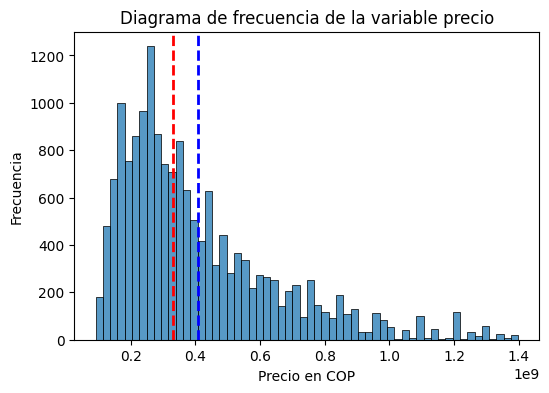

In [64]:
plt.figure(figsize=(6,4))
sns.histplot(viviendas_Medellin['precio'])
plt.title('Diagrama de frecuencia de la variable precio')
plt.xlabel('Precio en COP', fontsize=10)
plt.ylabel('Frecuencia', fontsize=10)
plt.axvline(x=viviendas_Medellin['precio'].mean(),color='blue',ls='--', lw=2)
plt.axvline(x=viviendas_Medellin['precio'].median(),color='red',ls='--', lw=2)


plt.show()


Text(0.5, 1.0, 'Diagrama de caja para la variable precio')

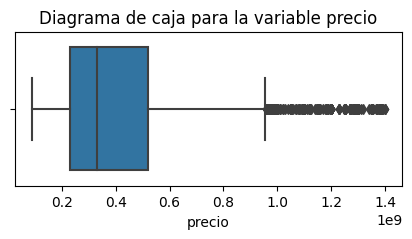

In [65]:
plt.figure(figsize=(5,2))
sns.boxplot(data=viviendas_Medellin, x='precio')
plt.title('Diagrama de caja para la variable precio')

In [66]:
viviendas_Medellin['precio'].describe()

count    1.675900e+04
mean     4.072193e+08
std      2.461555e+08
min      9.100000e+07
25%      2.300000e+08
50%      3.300000e+08
75%      5.200000e+08
max      1.399000e+09
Name: precio, dtype: float64

In [67]:
viviendas_Medellin['precio'].median()

330000000.0

In [68]:
viviendas_Medellin['precio'].mode()

0    350000000
dtype: int64

In [69]:
viviendas_Medellin['precio'].quantile([0.9,0.95,0.99])

0.90    7.500000e+08
0.95    9.000000e+08
0.99    1.212600e+09
Name: precio, dtype: float64

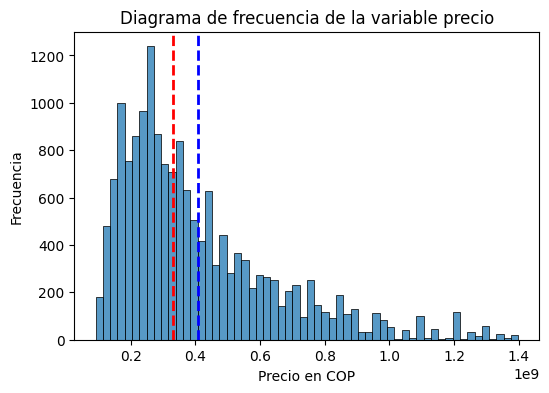

In [70]:
plt.figure(figsize=(6,4))
sns.histplot(viviendas_Medellin['precio'])
plt.title('Diagrama de frecuencia de la variable precio')
plt.xlabel('Precio en COP', fontsize=10)
plt.ylabel('Frecuencia', fontsize=10)
plt.axvline(x=viviendas_Medellin['precio'].mean(),color='blue',ls='--', lw=2)
plt.axvline(x=viviendas_Medellin['precio'].median(),color='red',ls='--', lw=2)


plt.show()


#### Precio por m2

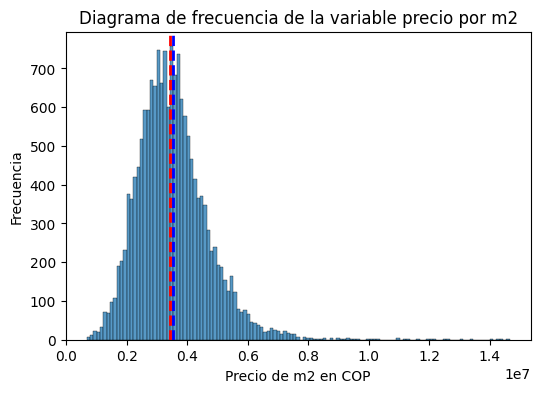

In [71]:
plt.figure(figsize=(6,4))
sns.histplot(viviendas_Medellin['precio_m2'])
plt.title('Diagrama de frecuencia de la variable precio por m2')
plt.xlabel('Precio de m2 en COP', fontsize=10)
plt.ylabel('Frecuencia', fontsize=10)
plt.axvline(x=viviendas_Medellin['precio_m2'].mean(),color='blue',ls='--', lw=2)
plt.axvline(x=viviendas_Medellin['precio_m2'].median(),color='red',ls='--', lw=2)

plt.show()


Text(0.5, 1.0, 'Diagrama de caja para la variable precio por m2')

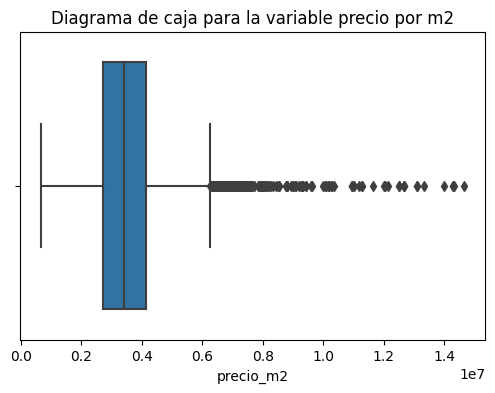

In [72]:
plt.figure(figsize=(6,4))
sns.boxplot(data=viviendas_Medellin, x='precio_m2')
plt.title('Diagrama de caja para la variable precio por m2')

In [73]:
viviendas_Medellin['precio_m2'].describe()

count    1.675900e+04
mean     3.521997e+06
std      1.188952e+06
min      6.737589e+05
25%      2.727273e+06
50%      3.413655e+06
75%      4.139535e+06
max      1.465116e+07
Name: precio_m2, dtype: float64

In [74]:
viviendas_Medellin['precio_m2'].mode()

0    3000000.0
dtype: float64

In [75]:
viviendas_Medellin['precio_m2'].mean()

3521997.043442679

In [76]:
viviendas_Medellin['precio_m2'].median()

3413654.6184738954

In [77]:
viviendas_Medellin['precio_m2'].quantile([0.9,0.95,0.99])

0.90    4.980016e+06
0.95    5.530464e+06
0.99    7.090122e+06
Name: precio_m2, dtype: float64

#### Inspección de la variable Precio en el tiempo

In [78]:
price_time = viviendas_Medellin.loc[:,['fecha_publicacion','precio']]
price_time['yearAndMonth'] = viviendas_Medellin.fecha_publicacion.map(lambda date: pd.to_datetime(str(date.year)+"-"+str(date.month)+"-01"))
price_time=price_time.groupby('yearAndMonth').mean()['precio']
price_time= price_time[(price_time>200000000)]
price_time=price_time.sort_values(ascending=False)
price_time

yearAndMonth
2017-08-01    5.198903e+08
2020-04-01    5.178095e+08
2017-11-01    5.123317e+08
2020-11-01    5.046764e+08
2018-11-01    5.000301e+08
                  ...     
2018-06-01    3.062500e+08
2020-05-01    3.041348e+08
2015-11-01    3.022366e+08
2016-10-01    2.710034e+08
2017-07-01    2.670000e+08
Name: precio, Length: 69, dtype: float64

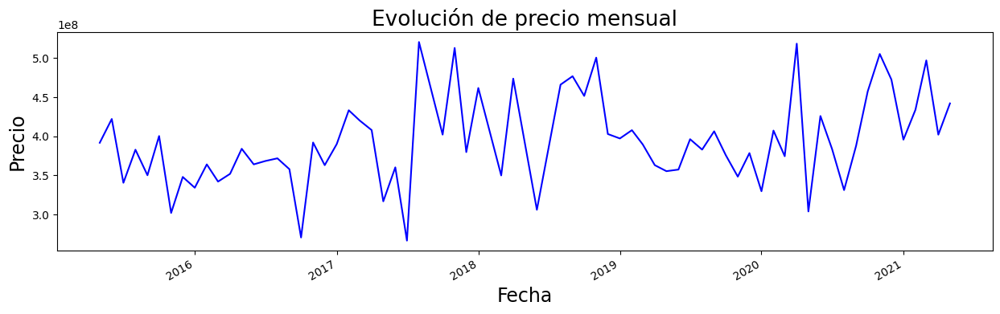

In [79]:
price_time.plot(figsize=(15,4),c='b');
plt.title('Evolución de precio mensual',fontsize= 19)
plt.xlabel('Fecha', fontsize=17)
plt.ylabel('Precio', fontsize=17)
plt.show()

In [80]:
price_time = viviendas_Medellin.loc[:,['fecha_publicacion','precio']]
price_time['year'] = viviendas_Medellin.fecha_publicacion.map(lambda date: pd.to_datetime(str(date.year)))
price_year=price_time.groupby('year').mean()
price_year

,precio
year,
2015-01-01,3.697786e+08
2016-01-01,3.578908e+08
2017-01-01,4.086930e+08
2018-01-01,4.707321e+08
2019-01-01,3.800076e+08
2020-01-01,4.191483e+08
2021-01-01,4.347838e+08


#### Evolucion de precio m2

In [81]:
pricem2_time = viviendas_Medellin.loc[:,['fecha_publicacion','precio_m2']]
pricem2_time['yearAndMonth'] = viviendas_Medellin.fecha_publicacion.map(lambda date: pd.to_datetime(str(date.year)+"-"+str(date.month)+"-01"))
pricem2_time=pricem2_time.groupby('yearAndMonth').mean()['precio_m2']
pricem2_time= pricem2_time[(pricem2_time>2000000)]
pricem2_time=pricem2_time.sort_values(ascending=False)
pricem2_time

yearAndMonth
2020-04-01    4.270999e+06
2021-04-01    4.270858e+06
2021-05-01    4.239747e+06
2021-02-01    4.208305e+06
2020-11-01    4.202416e+06
                  ...     
2016-03-01    2.886112e+06
2015-05-01    2.871755e+06
2018-03-01    2.800000e+06
2016-02-01    2.794858e+06
2015-11-01    2.733709e+06
Name: precio_m2, Length: 70, dtype: float64

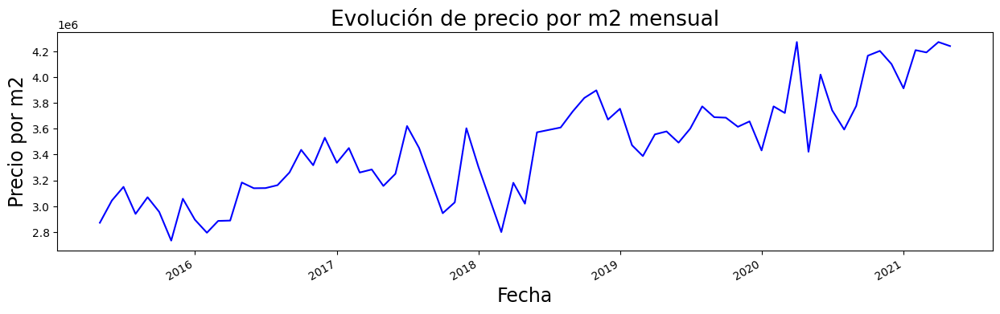

In [82]:
pricem2_time.plot(figsize=(15,4),c='b');
plt.title('Evolución de precio por m2 mensual',fontsize= 19)
plt.xlabel('Fecha', fontsize=17)
plt.ylabel('Precio por m2', fontsize=17)
plt.show()

In [83]:
viviendas_Medellin['fecha_publicacion'].min()

Timestamp('2015-05-07 00:00:00')

In [84]:
viviendas_Medellin['fecha_publicacion'].max()

Timestamp('2021-05-28 00:00:00')

#### Superficie total en m2

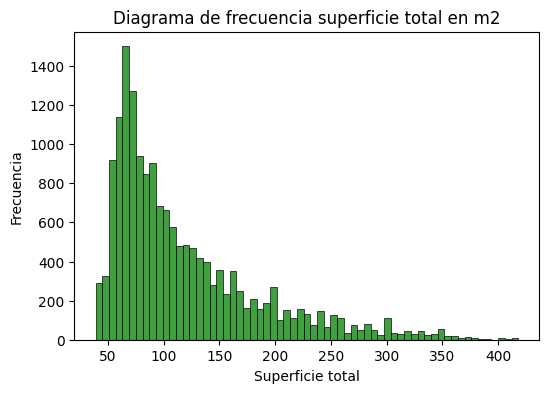

In [85]:
plt.figure(figsize=(6,4))
sns.histplot(viviendas_Medellin['superficie_total'],color="green")
plt.title('Diagrama de frecuencia superficie total en m2')
plt.xlabel('Superficie total', fontsize=10)
plt.ylabel('Frecuencia', fontsize=10)
plt.show()

Text(0.5, 1.0, 'Diagrama de caja para la variable superficie total')

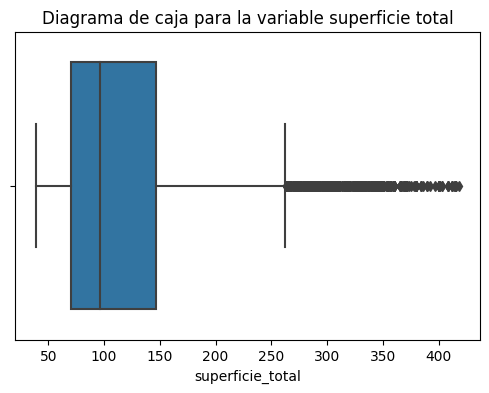

In [86]:
plt.figure(figsize=(6,4))
sns.boxplot(data=viviendas_Medellin, x="superficie_total")
plt.title('Diagrama de caja para la variable superficie total')

#### Numero de habitaciones

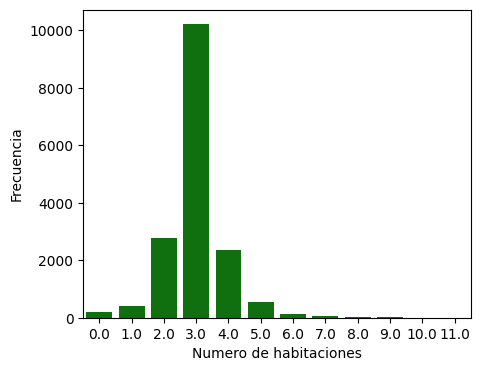

In [87]:
plt.figure(figsize=(5,4))
ax = sns.countplot(data = viviendas_Medellin, x = "habitaciones",color="g")
ax.set_xlabel('Numero de habitaciones')
ax.set_ylabel('Frecuencia')
plt.show()

#### Numero de banos

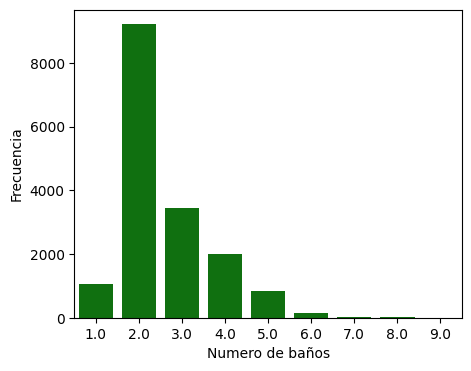

In [88]:
plt.figure(figsize=(5,4))
ax = sns.countplot(data = viviendas_Medellin, x = "baños",color="g")
ax.set_xlabel('Numero de baños')
ax.set_ylabel('Frecuencia')
plt.show()

#### Tipo de propiedad

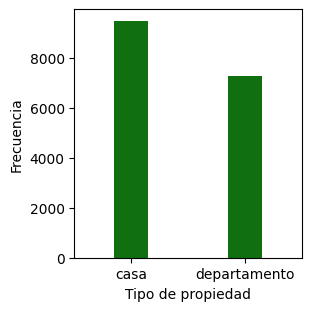

In [89]:
plt.figure(figsize=(3,3),constrained_layout=True)
ax = sns.countplot(data = viviendas_Medellin, x = "tipo_propiedad",color="g", width=0.3)
ax.set_xlabel('Tipo de propiedad')
ax.set_ylabel('Frecuencia')
plt.show()

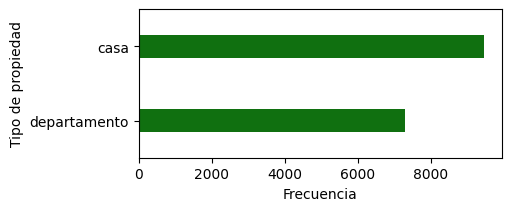

In [90]:
fig= plt.subplots(figsize=(5,2),constrained_layout=True)
ax = sns.countplot(data=viviendas_Medellin,y="tipo_propiedad",color="g", width=0.3)
ax.set_yticklabels(ax.get_yticklabels(),fontsize="medium")
ax.set_ylabel('Tipo de propiedad')
ax.set_xlabel('Frecuencia')
plt.show()

#### Distribucion de localizacion

Text(0.5, 0, 'Frecuencia')

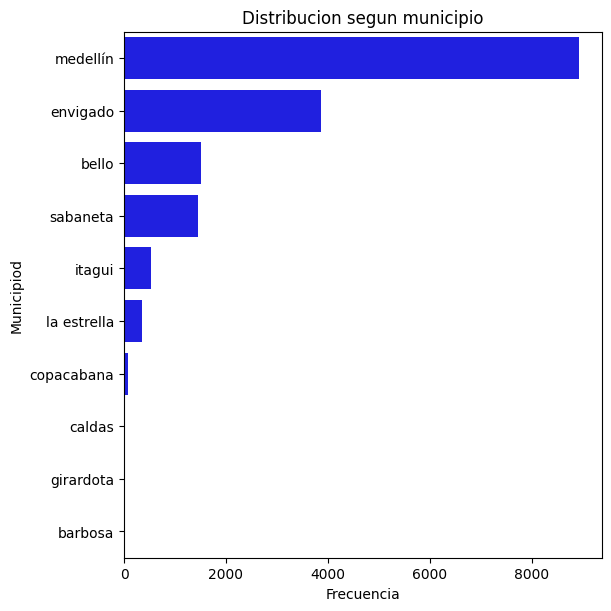

In [91]:
fig= plt.subplots(figsize=(6,6),constrained_layout=True)
ax = sns.countplot(data=viviendas_Medellin,y="municipio",order=viviendas_Medellin["municipio"].value_counts().index,color="b")
ax.set_yticklabels(ax.get_yticklabels(),fontsize="medium")
ax.set_title("Distribucion segun municipio", fontsize= 'large')
ax.set_ylabel('Municipiod')
ax.set_xlabel('Frecuencia')

Text(0.5, 0, 'Frecuencia')

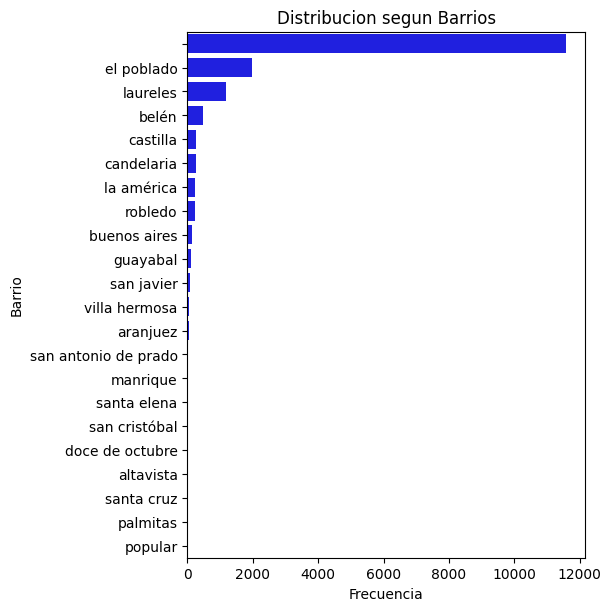

In [92]:
fig= plt.subplots(figsize=(6,6),constrained_layout=True)
ax = sns.countplot(data=viviendas_Medellin,y="barrio",order=viviendas_Medellin["barrio"].value_counts().index,color="b")
ax.set_yticklabels(ax.get_yticklabels(),fontsize="medium")
ax.set_title("Distribucion segun Barrios", fontsize= 'large')
ax.set_ylabel('Barrio')
ax.set_xlabel('Frecuencia')

#### Relacion entre las variables

<Figure size 640x480 with 0 Axes>

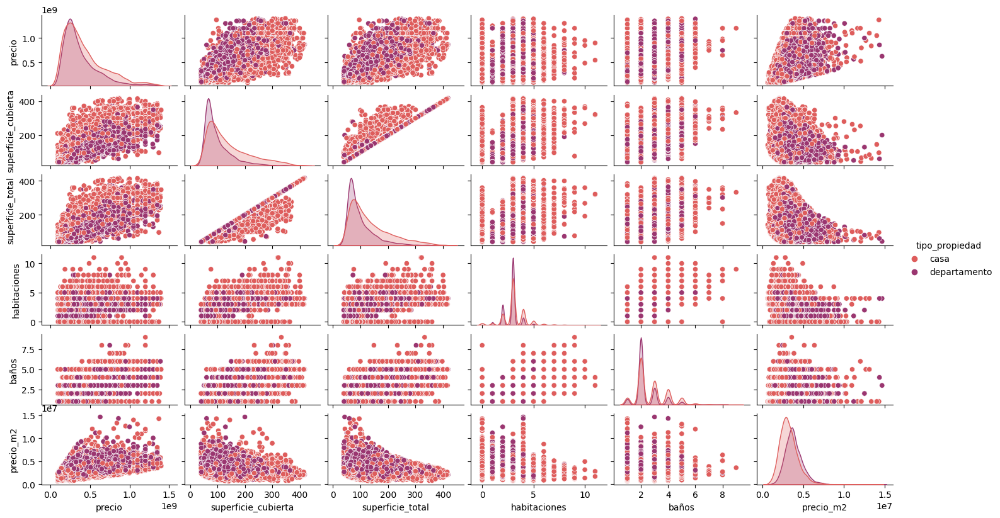

In [93]:
figz= plt.figure()
columnas= ["tipo_propiedad","precio","superficie_cubierta","superficie_total","habitaciones","baños", "precio_m2"]
graph=sns.pairplot(viviendas_Medellin[columnas],hue="tipo_propiedad", palette="flare")
graph.fig.set_size_inches(16,8)
plt.grid()
plt.show()

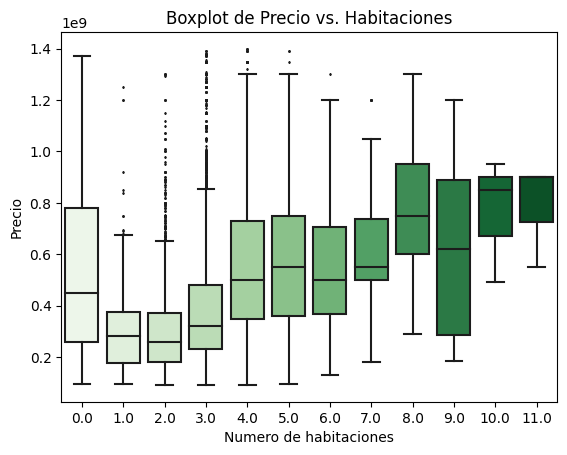

In [94]:
ax =sns.boxplot(x = "habitaciones", y='precio', data = viviendas_Medellin,palette="Greens",fliersize=1)
plt.title("Boxplot de Precio vs. Habitaciones")
ax.set_ylabel('Precio')
ax.set_xlabel('Numero de habitaciones')
plt.show()

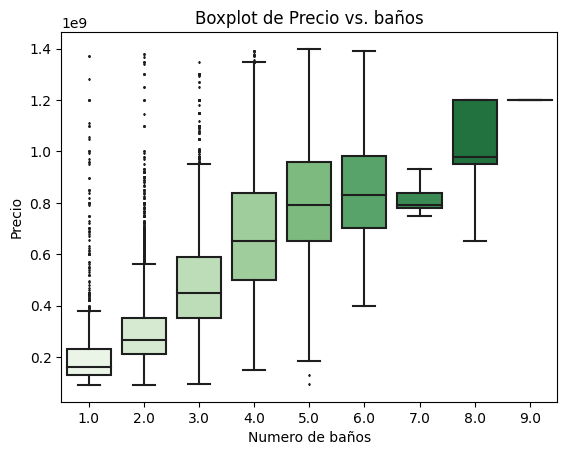

In [95]:
ax =sns.boxplot(x = "baños", y='precio', data = viviendas_Medellin,palette="Greens",fliersize=1)
plt.title("Boxplot de Precio vs. baños")
ax.set_ylabel('Precio')
ax.set_xlabel('Numero de baños')
plt.show()

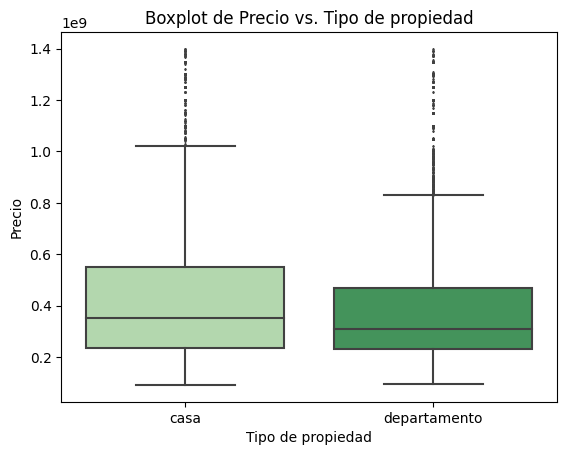

In [96]:
ax= sns.boxplot(x = "tipo_propiedad", y='precio', data = viviendas_Medellin,palette="Greens",fliersize=1)
plt.title("Boxplot de Precio vs. Tipo de propiedad")
ax.set_ylabel('Precio')
ax.set_xlabel('Tipo de propiedad')
plt.show()

Text(0.5, 1.0, 'Boxplot de Precio por m2 vs. Tipo de propiedad')

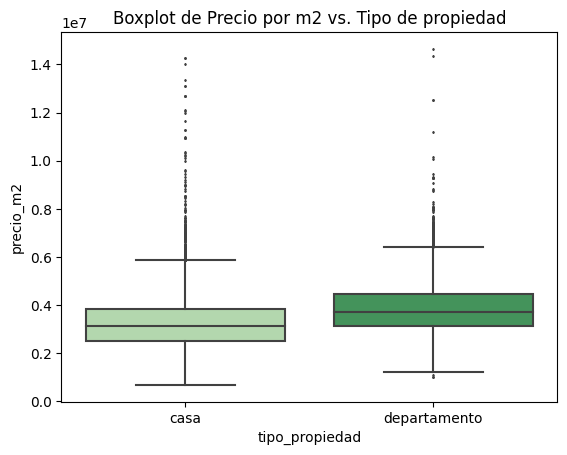

In [97]:
sns.boxplot(x = "tipo_propiedad", y='precio_m2', data = viviendas_Medellin,palette="Greens",fliersize=1)
plt.title("Boxplot de Precio por m2 vs. Tipo de propiedad")

#### Inspección de la variable Precio segun propiedad

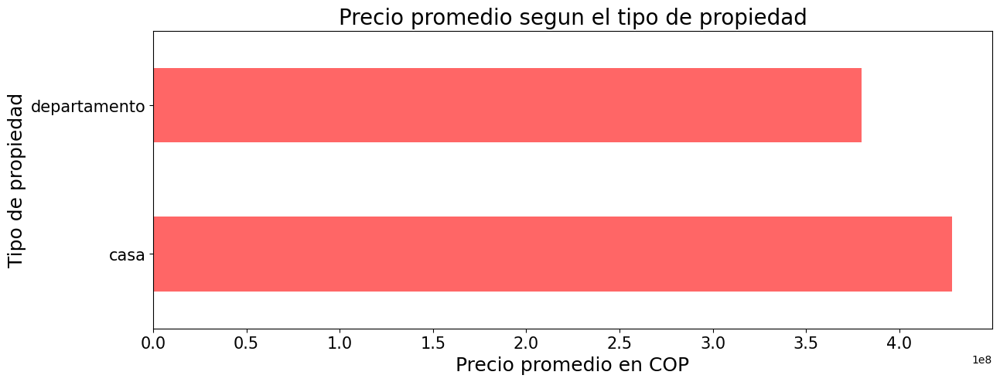

In [98]:
properati_type = viviendas_Medellin.groupby('tipo_propiedad').mean()['precio'].sort_values(ascending=False)
graph = properati_type.plot.barh(figsize=(14,5),fontsize=15, color='r', alpha=0.6)
graph.set_title("Precio promedio segun el tipo de propiedad", fontsize=20)
graph.set_ylabel("Tipo de propiedad", fontsize=18)
graph.set_xlabel("Precio promedio en COP", fontsize=18)
plt.show()

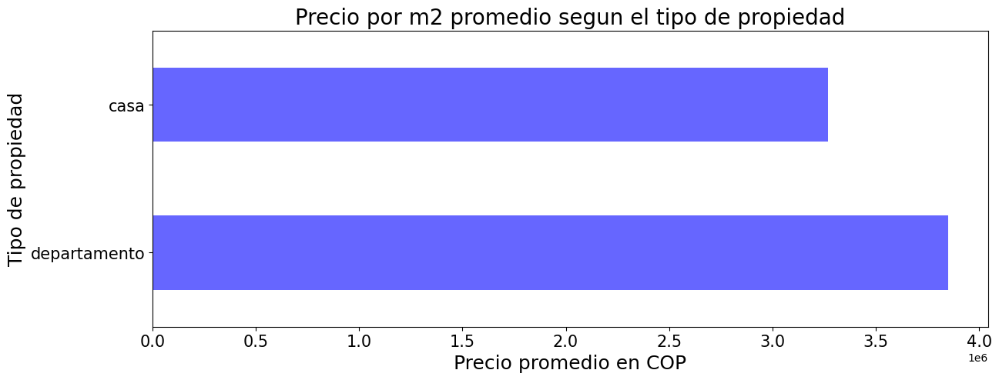

In [99]:
properati_type = viviendas_Medellin.groupby('tipo_propiedad').mean()['precio_m2'].sort_values(ascending=False)
graph = properati_type.plot.barh(figsize=(14,5),fontsize=15, color='b', alpha=0.6)
graph.set_title("Precio por m2 promedio segun el tipo de propiedad", fontsize=20)
graph.set_ylabel("Tipo de propiedad", fontsize=18)
graph.set_xlabel("Precio promedio en COP", fontsize=18)
plt.show()

#### Inspección de la variable Precio segun Municipio

In [100]:
viviendas_Medellin.groupby(['municipio'])['precio'].mean().sort_values(ascending=False ).head(15)

municipio
medellín       4.579338e+08
envigado       4.390103e+08
sabaneta       3.112444e+08
la estrella    3.105450e+08
girardota      2.987500e+08
itagui         2.461952e+08
copacabana     2.189177e+08
bello          2.128009e+08
barbosa        1.612500e+08
caldas         1.478636e+08
Name: precio, dtype: float64

In [101]:
viviendas_Medellin.groupby(['municipio'])['precio_m2'].mean().sort_values(ascending=False ).head(15)

municipio
envigado       3.737579e+06
medellín       3.550415e+06
sabaneta       3.530505e+06
la estrella    3.370421e+06
itagui         3.092228e+06
bello          3.034612e+06
copacabana     2.997235e+06
caldas         2.603620e+06
girardota      2.329467e+06
barbosa        2.080726e+06
Name: precio_m2, dtype: float64

In [102]:
viviendas_Medellin.describe()

,latitud,longitud,habitaciones,baños,superficie_total,superficie_cubierta,precio,precio_m2
count,15529.000000,15529.000000,16759.000000,16759.000000,16759.000000,16759.000000,1.675900e+04,1.675900e+04
mean,6.218195,-75.581474,3.007101,2.576049,118.521093,120.999582,4.072193e+08,3.521997e+06
std,0.343840,0.158026,0.928143,1.028500,66.922163,69.633335,2.461555e+08,1.188952e+06
min,3.521000,-91.832000,0.000000,1.000000,39.000000,39.000000,9.100000e+07,6.737589e+05
25%,6.169000,-75.598000,3.000000,2.000000,70.000000,70.000000,2.300000e+08,2.727273e+06
50%,6.205000,-75.579000,3.000000,2.000000,96.000000,97.000000,3.300000e+08,3.413655e+06
75%,6.247000,-75.565000,3.000000,3.000000,147.000000,150.000000,5.200000e+08,4.139535e+06
max,37.964000,-74.085000,11.000000,9.000000,418.000000,418.000000,1.399000e+09,1.465116e+07


In [103]:
viviendas_Medellin.sort_values(by='superficie_cubierta', ascending=True).head(10)

,id,fecha_publicacion,latitud,longitud,pais,departamento,municipio,barrio,habitaciones,baños,superficie_total,superficie_cubierta,precio,moneda,titulo,descripcion,tipo_propiedad,precio_m2
286654,b'\xccZ\xb1VJ\x9f4g\x04B\xbf\xb5\xc5\xd9\xc0\xf7',2021-05-26,6.347,-75.568,colombia,antioquia,bello,,2.0,2.0,39.0,39.0,105000000,COP,apartaestudio en venta en bello bellavista cod...,"te ofrecemos hermosos apartaestudio en bello, ...",departamento,2.692308e+06
277927,b'Ju\x95\x96\xee\xb1\xab\x13O\x9a\x18\x90MlK\x05',2016-05-13,NaN,NaN,colombia,antioquia,medellín,castilla,2.0,1.0,39.0,39.0,113000000,COP,apartamento en venta en bogota castilla,disfruta de una encantadora vista - desde tu a...,casa,2.897436e+06
34631,b'\x89f(\x1d8\xc5\xb39\x1e\xc2X\xf9#\x9a\x19\xc0',2020-03-04,6.261,-75.572,colombia,antioquia,medellín,candelaria,2.0,1.0,39.0,39.0,155000000,COP,apartamento en venta en medellin el chagualo,mattis inmobiliaria te presenta apartamento co...,departamento,3.974359e+06
514658,"b'a\x84\xb9ADo,4\x8d\x87p\x8e\xf6o\xa1P'",2016-09-15,6.261,-75.571,colombia,antioquia,medellín,,2.0,1.0,39.0,39.0,99000000,COP,apartamento en venta en medellin universidad d...,vendo apartamento universidad de antioquia ve...,casa,2.538462e+06
371356,b'\\\x8a\xe3\xfdg\xc1\xa8/\xeb\xaf\xe8}qY\xab_',2019-03-14,6.232,-75.536,colombia,antioquia,medellín,buenos aires,2.0,1.0,39.0,39.0,107000000,COP,apartamento en venta en medellin buenos aires,"apartamento de dos alcobas, un bao, sala-comed...",departamento,2.743590e+06
153499,b'\x1b\xbf\xcf\xcc\x89\xff\x9c<\x0b\xbb\x0b\xf...,2016-04-19,6.274,-75.581,colombia,antioquia,medellín,,1.0,1.0,39.0,39.0,107000000,COP,apartaestudio en arriendo/venta en medellin pi...,se arrienda o se vende aparta estudio en pilar...,casa,2.743590e+06
146527,"b'\xf4""\x84.\x8cR)\xf4\xb1\n\x81\xdc\x10)y5'",2019-12-05,6.248,-75.558,colombia,antioquia,medellín,candelaria,1.0,1.0,39.0,39.0,130000000,COP,apartaestudio en venta en medellin boston,"apartaestudio en arriendo en boston, medelln, ...",departamento,3.333333e+06
464251,b'\xe8\xc2l\x87\xc0\x19W\xea\x84\x11e\xc7\xf7\...,2018-08-09,6.339,-75.552,colombia,antioquia,bello,,2.0,1.0,39.0,39.0,145000000,COP,apartamento en venta en bello niquia,"venta de apartamento en bello antioquia, barri...",casa,3.717949e+06
123226,b'\xf61\x7f\x1f5\x7fV\x1c\x0bW\xfdKmK\x80\x02',2016-04-14,6.207,-75.570,colombia,antioquia,medellín,,0.0,1.0,39.0,39.0,310000000,COP,consultorio en venta en medellin la tomatera,hermoso consultorio en la torre medica mas com...,casa,7.948718e+06
417203,b'\x9e0R%RxB\xf2j\xb6\xa5!\xa8\x0e\xa7`',2021-01-15,6.160,-75.605,colombia,antioquia,medellín,,1.0,1.0,39.0,39.0,255000000,COP,apartaestudio en venta en medellin mayorca cod...,mattis inmobiliaria te presenta apartaestudio ...,departamento,6.538462e+06


### Correlación entre las variables

Para evaluar la correlación entre variables se utilzia el coeficiente de correlación r usando .corr() en Pandas

In [104]:
correlacion = viviendas_Medellin.corr()
correlacion

,latitud,longitud,habitaciones,baños,superficie_total,superficie_cubierta,precio,precio_m2
latitud,1.000000,-0.886880,0.001290,-0.026655,-0.011139,-0.013500,-0.031859,-0.034206
longitud,-0.886880,1.000000,0.007381,0.017979,0.015010,0.018478,0.020083,0.004534
habitaciones,0.001290,0.007381,1.000000,0.487366,0.483937,0.507067,0.266535,-0.266191
baños,-0.026655,0.017979,0.487366,1.000000,0.711250,0.718122,0.690688,0.080513
superficie_total,-0.011139,0.015010,0.483937,0.711250,1.000000,0.974276,0.784485,-0.128347
superficie_cubierta,-0.013500,0.018478,0.507067,0.718122,0.974276,1.000000,0.783353,-0.090843
precio,-0.031859,0.020083,0.266535,0.690688,0.784485,0.783353,1.000000,0.445121
precio_m2,-0.034206,0.004534,-0.266191,0.080513,-0.128347,-0.090843,0.445121,1.000000


Para determinar la Correlación Positiva entre variables:

In [105]:
pos_cor = correlacion['precio'] >0
correlacion['precio'][pos_cor].sort_values(ascending = False).to_frame()

,precio
precio,1.000000
superficie_total,0.784485
superficie_cubierta,0.783353
baños,0.690688
precio_m2,0.445121
habitaciones,0.266535
longitud,0.020083


Para determinar la Correlación Negativa entre variables:

In [106]:
neg_cor = correlacion['precio'] < 0
correlacion['precio'][neg_cor].sort_values(ascending = True).to_frame()

,precio
latitud,-0.031859


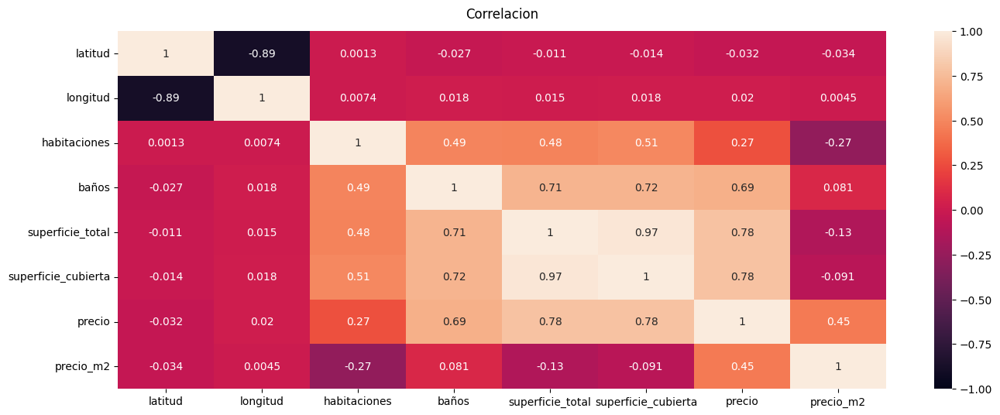

In [107]:
plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(viviendas_Medellin.corr(), vmin=-1, vmax=1, annot=True)
heatmap.set_title('Correlacion', fontdict={'fontsize':12}, pad=12);

### Localización

In [108]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [109]:
import folium 
from folium.plugins import HeatMap

In [110]:
folium_map = folium.Map()
Medellin_coordenadas = [6.2476, -75.5658] # lat, long
folium_map = folium.Map(location=Medellin_coordenadas,  zoom_start=13)
folium_map

In [111]:
folium_hmap = folium.Map(location=Medellin_coordenadas, zoom_start=13, tiles="OpenStreetMap")

Debemos definir los datos con formato, latitud, longitud y Precio

In [112]:
viviendas_Medellin_loc=viviendas_Medellin.drop(viviendas_Medellin[(viviendas_Medellin['latitud'].isnull())& (viviendas_Medellin['longitud'].isnull())].index)

In [113]:
nuevo_zip = zip(viviendas_Medellin_loc['latitud'], viviendas_Medellin_loc['longitud'], viviendas_Medellin_loc['precio'])
lista_zip = list(nuevo_zip)
lista_zip[0:5]

[(6.305, -75.559, 110000000),
 (6.346, -75.555, 190000000),
 (6.174, -75.588, 350000000),
 (6.158, -75.579, 315000000),
 (6.148, -75.573, 350000000)]

Crear una capa con el mapa de calor con los datos

In [114]:
mapa_calor_capa = HeatMap(lista_zip, min_opacity=0.2,radius=10,blur=6)

In [115]:
folium_hmap.add_child(mapa_calor_capa)
folium_hmap

#### visualizar lor precios por m2

In [116]:
nuevo_zip2 = zip(viviendas_Medellin_loc['latitud'], viviendas_Medellin_loc['longitud'], viviendas_Medellin_loc['precio_m2'])
lista_zip2 = list(nuevo_zip2)
lista_zip2[0:5]

[(6.305, -75.559, 1833333.3333333333),
 (6.346, -75.555, 3166666.6666666665),
 (6.174, -75.588, 4069767.4418604653),
 (6.158, -75.579, 3937500.0),
 (6.148, -75.573, 3977272.727272727)]

In [117]:
mapa_calor_capa2 = HeatMap(lista_zip2, min_opacity=0.2,radius=10,blur=6)

In [118]:
folium_hmap.add_child(mapa_calor_capa2)
folium_hmap

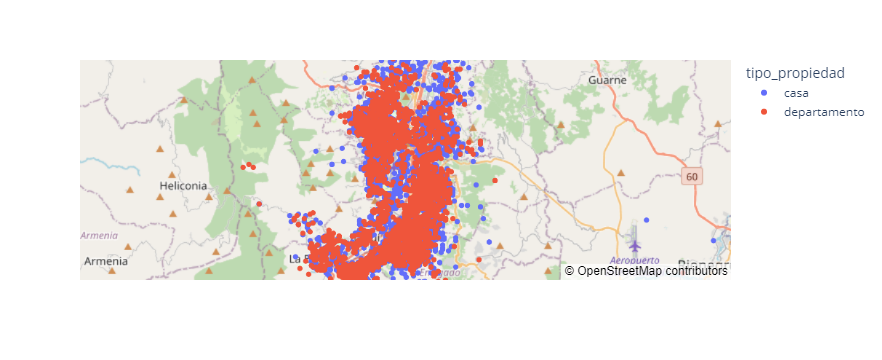

In [119]:
fig = px.scatter_mapbox(viviendas_Medellin, lat="latitud", lon="longitud", color="tipo_propiedad",hover_data=['precio'],hover_name="titulo",zoom=10,)
fig.update_layout(mapbox_style="open-street-map")
fig.show()

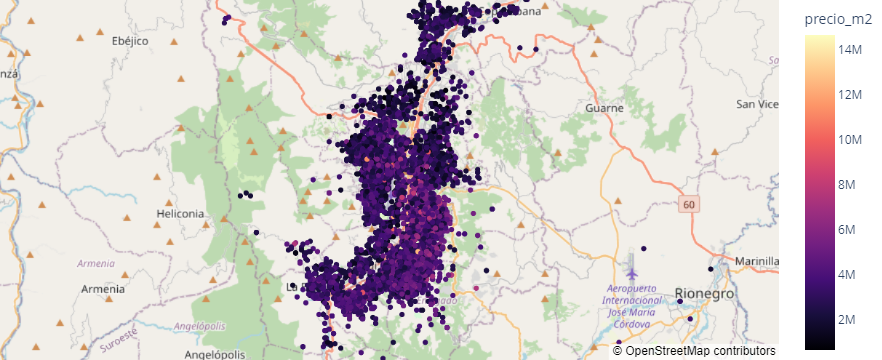

In [120]:
fig = px.scatter_mapbox(viviendas_Medellin_loc, lat="latitud", lon="longitud", hover_data=["municipio","barrio"],
                        color='precio_m2', color_continuous_scale="Magma", zoom=3, height=300)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.update_layout( mapbox=dict(center={'lat': 6.230833, 'lon': -75.590553}, zoom=10))
fig.show()

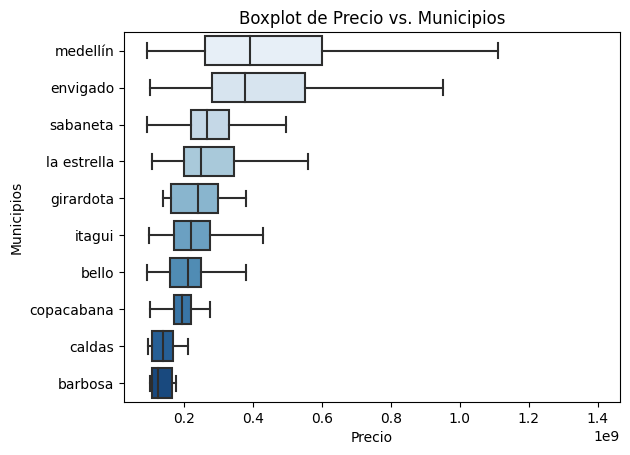

In [121]:
ax =sns.boxplot(y = "municipio", x='precio', data = viviendas_Medellin,order=['medellín','envigado','sabaneta','la estrella','girardota','itagui','bello','copacabana','caldas','barbosa'], palette="Blues", fliersize=0)
plt.title("Boxplot de Precio vs. Municipios")
ax.set_ylabel('Municipios')
ax.set_xlabel('Precio')
plt.show()

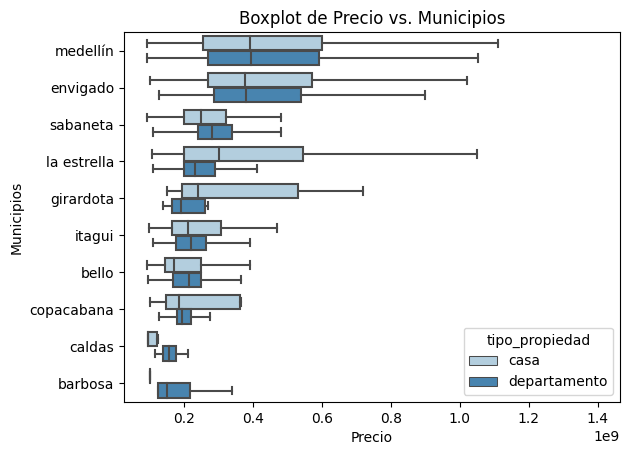

In [122]:
ax =sns.boxplot(y = "municipio", x='precio', data = viviendas_Medellin,hue='tipo_propiedad',order=['medellín','envigado','sabaneta','la estrella','girardota','itagui','bello','copacabana','caldas','barbosa'], palette="Blues",fliersize=0)
plt.title("Boxplot de Precio vs. Municipios")
ax.set_ylabel('Municipios')
ax.set_xlabel('Precio')
plt.show()

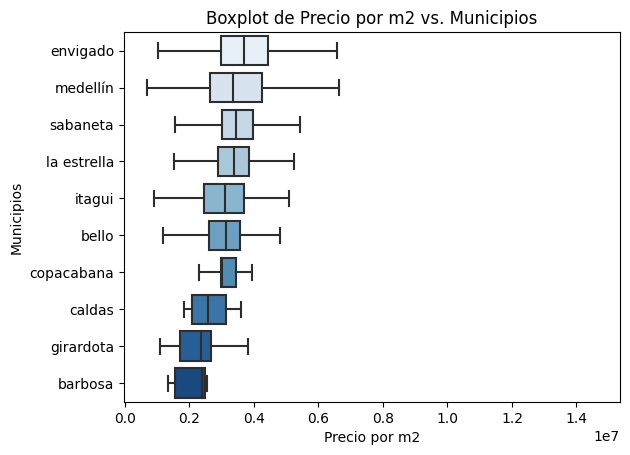

In [123]:
ax =sns.boxplot(y = "municipio", x='precio_m2', data = viviendas_Medellin,order=['envigado','medellín','sabaneta','la estrella','itagui','bello','copacabana','caldas','girardota','barbosa'], palette="Blues",fliersize=0)
plt.title("Boxplot de Precio por m2 vs. Municipios")
ax.set_ylabel('Municipios')
ax.set_xlabel('Precio por m2')
plt.show()

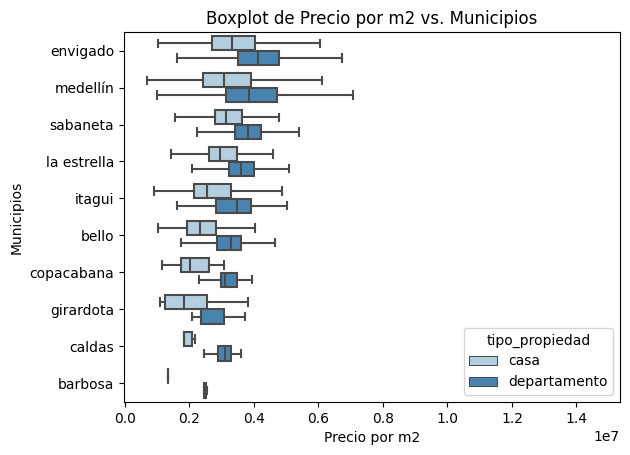

In [124]:
ax =sns.boxplot(y = "municipio", x='precio_m2', data = viviendas_Medellin,hue='tipo_propiedad',order=['envigado','medellín','sabaneta','la estrella','itagui','bello','copacabana','girardota','caldas','barbosa'], palette="Blues",fliersize=0)
plt.title("Boxplot de Precio por m2 vs. Municipios")
ax.set_ylabel('Municipios')
ax.set_xlabel('Precio por m2')
plt.show()

In [125]:
viviendas_Medellin_loc.shape

(15529, 18)

In [126]:
viviendas_Medellin_loc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15529 entries, 70 to 562568
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   id                   15529 non-null  category      
 1   fecha_publicacion    15529 non-null  datetime64[ns]
 2   latitud              15529 non-null  float64       
 3   longitud             15529 non-null  float64       
 4   pais                 15529 non-null  object        
 5   departamento         15529 non-null  object        
 6   municipio            15529 non-null  object        
 7   barrio               15529 non-null  object        
 8   habitaciones         15529 non-null  float64       
 9   baños                15529 non-null  float64       
 10  superficie_total     15529 non-null  float64       
 11  superficie_cubierta  15529 non-null  float64       
 12  precio               15529 non-null  int64         
 13  moneda               15529 no

In [127]:
viviendas_Medellin_loc['habitaciones'] = viviendas_Medellin_loc['habitaciones'].fillna(viviendas_Medellin_loc['habitaciones'].median())

In [128]:
viviendas_Medellin_loc['baños'] = viviendas_Medellin_loc['baños'].fillna(viviendas_Medellin_loc['baños'].median())

In [129]:
ratio_surface=(viviendas_Medellin_loc['superficie_cubierta']/viviendas_Medellin_loc['superficie_cubierta']).mean()

In [130]:
viviendas_Medellin_loc['superficie_cubierta'] = viviendas_Medellin_loc['superficie_cubierta'].fillna(viviendas_Medellin_loc['superficie_cubierta']*ratio_surface)

In [131]:
viviendas_Medellin_loc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15529 entries, 70 to 562568
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   id                   15529 non-null  category      
 1   fecha_publicacion    15529 non-null  datetime64[ns]
 2   latitud              15529 non-null  float64       
 3   longitud             15529 non-null  float64       
 4   pais                 15529 non-null  object        
 5   departamento         15529 non-null  object        
 6   municipio            15529 non-null  object        
 7   barrio               15529 non-null  object        
 8   habitaciones         15529 non-null  float64       
 9   baños                15529 non-null  float64       
 10  superficie_total     15529 non-null  float64       
 11  superficie_cubierta  15529 non-null  float64       
 12  precio               15529 non-null  int64         
 13  moneda               15529 no

In [132]:
viviendas_Medellin_loc= viviendas_Medellin_loc[(viviendas_Medellin_loc['precio']< viviendas_Medellin_loc['precio'].quantile(.85))]

In [133]:
df=viviendas_Medellin_loc

In [134]:
df.columns

Index(['id', 'fecha_publicacion', 'latitud', 'longitud', 'pais',
       'departamento', 'municipio', 'barrio', 'habitaciones', 'baños',
       'superficie_total', 'superficie_cubierta', 'precio', 'moneda', 'titulo',
       'descripcion', 'tipo_propiedad', 'precio_m2'],
      dtype='object')

In [135]:
df=df[['latitud', 'longitud', 'habitaciones', 'baños', 'superficie_total', 'precio']]

## Modelos Iniciales con subconjunto de datos 1

Seleccionar las variables predictoras (X) y la variable a predecir (y).

In [136]:
X = df.drop('precio',axis=1)
y = df['precio']
X.head()
X.describe()
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13199 entries, 70 to 562568
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   latitud           13199 non-null  float64
 1   longitud          13199 non-null  float64
 2   habitaciones      13199 non-null  float64
 3   baños             13199 non-null  float64
 4   superficie_total  13199 non-null  float64
dtypes: float64(5)
memory usage: 618.7 KB


Datos de entrenamiento y datos de prueba

In [137]:
X_train,X_test,y_train,y_test = train_test_split(X,y,train_size=0.8,test_size=0.2,random_state=42)

Generar un modelo y evaluarlo.

#### LinearRegression

In [138]:
linear_regressor = LinearRegression()

In [139]:
linear_regressor.fit(X_train,y_train)

LinearRegression()

In [140]:
y_linear_train_pred= linear_regressor.predict(X_train)
y_linear_test_pred=linear_regressor.predict(X_test)

In [141]:
linear_MAE_train=mean_absolute_error(y_train,y_linear_train_pred)
linear_MAE_test=mean_absolute_error(y_test,y_linear_test_pred)

linear_RMSE_train=np.sqrt(mean_squared_error(y_train,y_linear_train_pred))
linear_RMSE_test=np.sqrt(mean_squared_error(y_test,y_linear_test_pred))

linear_MAPE_train=mean_absolute_percentage_error(y_train,y_linear_train_pred)
linear_MAPE_test=mean_absolute_percentage_error(y_test,y_linear_test_pred)

linear_r2_train= metrics.r2_score(y_train, y_linear_train_pred)
linear_r2_test= metrics.r2_score(y_test,y_linear_test_pred)

linear_adj_r2_train = 1 - ((1 - linear_r2_train) * (len(y_train) - 1)) / (len(y_train) - X_train.shape[1] - 1)
linear_adj_r2_test = 1 - ((1 - linear_r2_test) * (len(y_test) - 1)) / (len(y_test) - X_test.shape[1] - 1)
    
print("El MAE en train es:",linear_MAE_train)
print("El MAE en test es:",linear_MAE_test)
print("-------------------------------------------")
print("El RMSE en train es:",linear_RMSE_train)
print("El RMSE en test es:",linear_RMSE_test)
print("-------------------------------------------")
print("El MAPE en train es:",linear_MAPE_train)
print("El MAPE en test es:",linear_MAPE_test)
print("-------------------------------------------")
print("El r2 de train es:",linear_r2_train)
print("El r2 de test es:",linear_r2_test)
print("-------------------------------------------")
print("El r2 ajustado de train es:",linear_adj_r2_train)
print("El r2 ajustado de test es:",linear_adj_r2_test)

El MAE en train es: 73281532.29378462
El MAE en test es: 72830906.2534759
-------------------------------------------
El RMSE en train es: 94488344.491277
El RMSE en test es: 94746860.92959999
-------------------------------------------
El MAPE en train es: 0.26444507173107606
El MAPE en test es: 0.26166034160505963
-------------------------------------------
El r2 de train es: 0.5278017066715841
El r2 de test es: 0.5359929466226653
-------------------------------------------
El r2 ajustado de train es: 0.5275779796303028
El r2 ajustado de test es: 0.5351121435600659


#### Arbol de decision

In [142]:
arbol_regressor = DecisionTreeRegressor(random_state=42)

In [143]:
arbol_regressor.fit(X_train,y_train)

DecisionTreeRegressor(random_state=42)

In [144]:
y_arbol_pred_train = arbol_regressor.predict(X_train)
y_arbol_pred_test = arbol_regressor.predict(X_test)

In [145]:
arbol_MAE_train=mean_absolute_error(y_train,y_arbol_pred_train)
arbol_MAE_test=mean_absolute_error(y_test,y_arbol_pred_test)

arbol_RMSE_train=np.sqrt(mean_squared_error(y_train,y_arbol_pred_train))
arbol_RMSE_test=np.sqrt(mean_squared_error(y_test,y_arbol_pred_test))

arbol_MAPE_train=mean_absolute_percentage_error(y_train,y_arbol_pred_train)
arbol_MAPE_test=mean_absolute_percentage_error(y_test,y_arbol_pred_test)

arbol_r2_train= metrics.r2_score(y_train, y_arbol_pred_train)
arbol_r2_test= metrics.r2_score(y_test, y_arbol_pred_test)

arbol_adj_r2_train = 1 - ((1 - arbol_r2_train) * (len(y_train) - 1)) / (len(y_train) - X_train.shape[1] - 1)
arbol_adj_r2_test = 1 - ((1 - arbol_r2_test) * (len(y_test) - 1)) / (len(y_test) - X_test.shape[1] - 1)
    

print("El MAE en train es:",arbol_MAE_train)
print("El MAE en test es:",arbol_MAE_test)
print("-------------------------------------------")
print("El RMSE en train es:",arbol_RMSE_train)
print("El RMSE en test es:",arbol_RMSE_test)
print("-------------------------------------------")
print("El MAPE en train es:",arbol_MAPE_train)
print("El MAPE en test es:",arbol_MAPE_test)
print("-------------------------------------------")
print("El r2 de train es:",arbol_r2_train)
print("El r2 de test es:",arbol_r2_test)
print("-------------------------------------------")
print("El r2 ajustado de train es:",arbol_adj_r2_train)
print("El r2 ajustado de test es:",arbol_adj_r2_test)

El MAE en train es: 2700241.6978929667
El MAE en test es: 52155953.2148413
-------------------------------------------
El RMSE en train es: 10959460.520083074
El RMSE en test es: 86928943.19938555
-------------------------------------------
El MAPE en train es: 0.01011959031170725
El MAPE en test es: 0.17916885098148858
-------------------------------------------
El r2 de train es: 0.993647476412116
El r2 de test es: 0.6094076602351934
-------------------------------------------
El r2 ajustado de train es: 0.9936444665933025
El r2 ajustado de test es: 0.6086662169174926


#### KNN Vecinos mas cercanos

In [146]:
knn_regressor = KNeighborsRegressor()

In [147]:
knn_regressor.fit(X_train,y_train)

KNeighborsRegressor()

In [148]:
y_knn_pred_train = knn_regressor.predict(X_train)
y_knn_pred_test = knn_regressor.predict(X_test)

In [149]:
knn_MAE_train=mean_absolute_error(y_train,y_knn_pred_train)
knn_MAE_test=mean_absolute_error(y_test,y_knn_pred_test)

knn_RMSE_train=np.sqrt(mean_squared_error(y_train,y_knn_pred_train))
knn_RMSE_test=np.sqrt(mean_squared_error(y_test,y_knn_pred_test))

knn_MAPE_train=mean_absolute_percentage_error(y_train,y_knn_pred_train)
knn_MAPE_test=mean_absolute_percentage_error(y_test,y_knn_pred_test)

knn_r2_train= metrics.r2_score(y_train, y_knn_pred_train)
knn_r2_test= metrics.r2_score(y_test, y_knn_pred_test)

knn_adj_r2_train = 1 - ((1 - knn_r2_train) * (len(y_train) - 1)) / (len(y_train) - X_train.shape[1] - 1)
knn_adj_r2_test = 1 - ((1 - knn_r2_test) * (len(y_test) - 1)) / (len(y_test) - X_test.shape[1] - 1)
    

print("El MAE en train es:",knn_MAE_train)
print("El MAE en test es:",knn_MAE_test)
print("-------------------------------------------")
print("El RMSE en train es:",knn_RMSE_train)
print("El RMSE en test es:",knn_RMSE_test)
print("-------------------------------------------")
print("El MAPE en train es:",knn_MAPE_train)
print("El MAPE en test es:",knn_MAPE_test)
print("-------------------------------------------")
print("El r2 de train es:",knn_r2_train)
print("El r2 de test es:",knn_r2_test)
print("-------------------------------------------")
print("El r2 ajustado de train es:",knn_adj_r2_train)
print("El r2 ajustado de test es:",knn_adj_r2_test)

El MAE en train es: 48318471.87828392
El MAE en test es: 58700077.631212115
-------------------------------------------
El RMSE en train es: 67623252.22057417
El RMSE en test es: 80869480.03391927
-------------------------------------------
El MAPE en train es: 0.16886572770639796
El MAPE en test es: 0.20459031303714084
-------------------------------------------
El r2 de train es: 0.7581422321233116
El r2 de test es: 0.6619630119975107
-------------------------------------------
El r2 ajustado de train es: 0.7580276401741612
El r2 ajustado de test es: 0.6613213320658431


#### XG Boost Regressor

In [150]:
xgboost_regressor =xgboost.XGBRegressor()

In [151]:
xgboost_regressor.fit(X_train,y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, ...)

In [152]:
y_xgb_train_pred= xgboost_regressor.predict(X_train)
y_xgb_test_pred=xgboost_regressor.predict(X_test)

In [153]:
xgb_MAE_train=mean_absolute_error(y_train,y_xgb_train_pred)
xgb_MAE_test=mean_absolute_error(y_test,y_xgb_test_pred)

xgb_RMSE_train=np.sqrt(mean_squared_error(y_train,y_xgb_train_pred))
xgb_RMSE_test=np.sqrt(mean_squared_error(y_test,y_xgb_test_pred))

xgb_MAPE_train=mean_absolute_percentage_error(y_train,y_xgb_train_pred)
xgb_MAPE_test=mean_absolute_percentage_error(y_test,y_xgb_test_pred)

xgb_r2_train= metrics.r2_score(y_train, y_xgb_train_pred)
xgb_r2_test= metrics.r2_score(y_test, y_xgb_test_pred)

xgb_adj_r2_train = 1 - ((1 - xgb_r2_train) * (len(y_train) - 1)) / (len(y_train) - X_train.shape[1] - 1)
xgb_adj_r2_test = 1 - ((1 - xgb_r2_test) * (len(y_test) - 1)) / (len(y_test) - X_test.shape[1] - 1)
    

print("El MAE en train es:",xgb_MAE_train)
print("El MAE en test es:",xgb_MAE_test)
print("-------------------------------------------")
print("El RMSE en train es:",xgb_RMSE_train)
print("El RMSE en test es:",xgb_RMSE_test)
print("-------------------------------------------")
print("El RMSE en train es:",xgb_MAPE_train)
print("El RMSE en test es:",xgb_MAPE_test)
print("-------------------------------------------")
print("El r2 de train es:",xgb_r2_train)
print("El r2 de test es:",xgb_r2_test)
print("-------------------------------------------")
print("El r2 ajustado de train es:",xgb_adj_r2_train)
print("El r2 ajustado de test es:",xgb_adj_r2_test)

El MAE en train es: 37234934.3508855
El MAE en test es: 50905661.63181818
-------------------------------------------
El RMSE en train es: 50834847.80679945
El RMSE en test es: 69645456.40455653
-------------------------------------------
El RMSE en train es: 0.1302557953261137
El RMSE en test es: 0.17337137829110408
-------------------------------------------
El r2 de train es: 0.8633244001422687
El r2 de test es: 0.7492848953059801
-------------------------------------------
El r2 ajustado de train es: 0.8632596433907016
El r2 ajustado de test es: 0.748808974454245


#### Random Forest

In [154]:
from sklearn.ensemble import RandomForestRegressor

In [155]:
randomforest_regressor = RandomForestRegressor()

In [156]:
randomforest_regressor.fit(X_train,y_train)

RandomForestRegressor()

In [157]:
y_rf_train_pred= randomforest_regressor.predict(X_train)
y_rf_test_pred=randomforest_regressor.predict(X_test)

In [158]:
rf_MAE_train=mean_absolute_error(y_train,y_rf_train_pred)
rf_MAE_test=mean_absolute_error(y_test,y_rf_test_pred)

rf_RMSE_train=np.sqrt(mean_squared_error(y_train,y_rf_train_pred))
rf_RMSE_test=np.sqrt(mean_squared_error(y_test,y_rf_test_pred))

rf_MAPE_train=mean_absolute_percentage_error(y_train,y_rf_train_pred)
rf_MAPE_test=mean_absolute_percentage_error(y_test,y_rf_test_pred)

rf_r2_train= metrics.r2_score(y_train, y_rf_train_pred)
rf_r2_test= metrics.r2_score(y_test, y_rf_test_pred)

rf_adj_r2_train = 1 - ((1 - rf_r2_train) * (len(y_train) - 1)) / (len(y_train) - X_train.shape[1] - 1)
rf_adj_r2_test = 1 - ((1 - rf_r2_test) * (len(y_test) - 1)) / (len(y_test) - X_test.shape[1] - 1)
    

print("El MAE en train es:",rf_MAE_train)
print("El MAE en test es:",rf_MAE_test)
print("-------------------------------------------")
print("El RMSE en train es:",rf_RMSE_train)
print("El RMSE en test es:",rf_RMSE_test)
print("-------------------------------------------")
print("El MAPE en train es:",rf_MAPE_train)
print("El MAPE en test es:",rf_MAPE_test)
print("-------------------------------------------")
print("El r2 de train es:",rf_r2_train)
print("El r2 de test es:",rf_r2_test)
print("-------------------------------------------")
print("El r2 ajustado de train es:",rf_adj_r2_train)
print("El r2 ajustado de test es:",rf_adj_r2_test)

El MAE en train es: 18243309.050527953
El MAE en test es: 44618366.83560502
-------------------------------------------
El RMSE en train es: 27081978.584464185
El RMSE en test es: 65815792.30529548
-------------------------------------------
El MAPE en train es: 0.06397331768504007
El MAPE en test es: 0.15574835807281198
-------------------------------------------
El r2 de train es: 0.9612092019988584
El r2 de test es: 0.7760994556238664
-------------------------------------------
El r2 ajustado de train es: 0.9611908229606697
El r2 ajustado de test es: 0.7756744356079663


### Grafico de Resultados Iniciales con subconjunto de datos 1

Modelo: Regresión lineal
R2 en Train: 0.5278017066715841
R2 ajustado en train: 0.5275779796303028
--------------------------
R2 en test: 0.5359929466226653
R2 ajustado en Test: 0.5351121435600659
--------------------------
RMSE en train: 94488344.491277
RMSE en test: 94746860.92959999
--------------------------
MAE en train: 73281532.29378462
MAE en test: 72830906.2534759
--------------------------
MAPE en train: 0.26444507173107606
MAPE en test: 0.26166034160505963


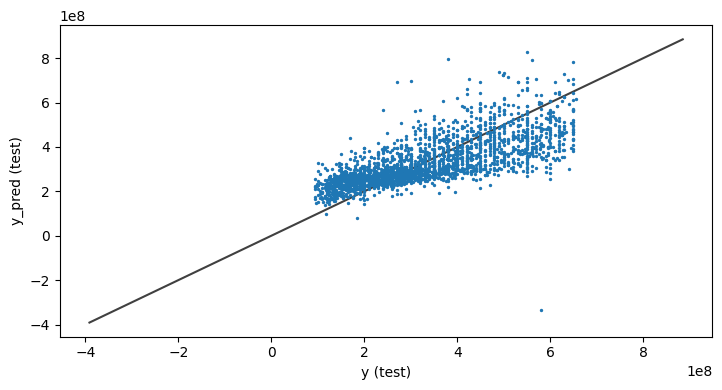

Modelo: Árbol de Decisión
R2 en Train: 0.993647476412116
R2 ajustado en train: 0.9936444665933025
--------------------------
R2 en test: 0.6094076602351934
R2 ajustado en Test: 0.6086662169174926
--------------------------
RMSE en train: 10959460.520083074
RMSE en test: 86928943.19938555
--------------------------
MAE en train: 2700241.6978929667
MAE en test: 52155953.2148413
--------------------------
MAPE en train: 0.01011959031170725
MAPE en test: 0.17916885098148858


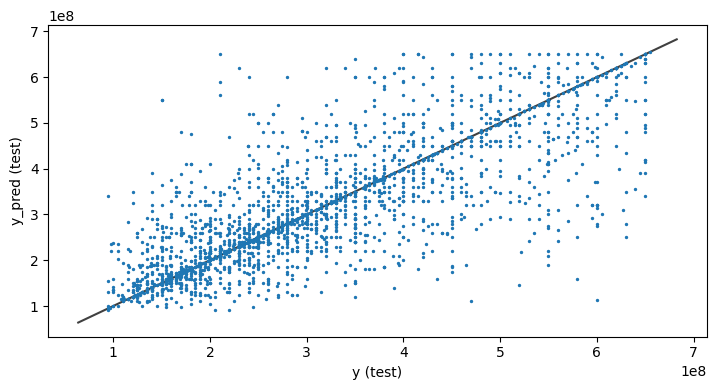

Modelo: Vecinos más cercanos
R2 en Train: 0.7581422321233116
R2 ajustado en train: 0.7580276401741612
--------------------------
R2 en test: 0.6619630119975107
R2 ajustado en Test: 0.6613213320658431
--------------------------
RMSE en train: 67623252.22057417
RMSE en test: 80869480.03391927
--------------------------
MAE en train: 48318471.87828392
MAE en test: 58700077.631212115
--------------------------
MAPE en train: 0.16886572770639796
MAPE en test: 0.20459031303714084


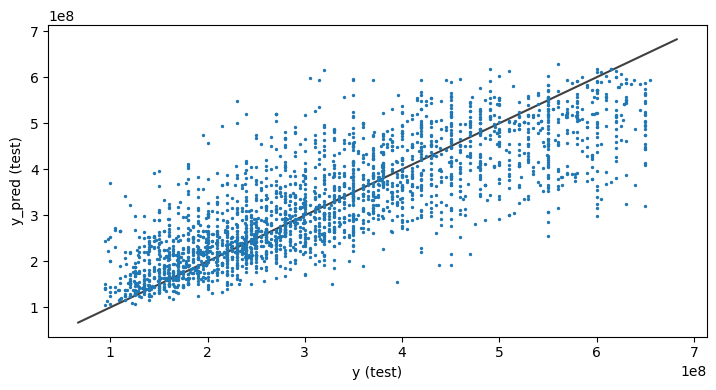

Modelo: Regresión XG Boosting
R2 en Train: 0.8633244001422687
R2 ajustado en train: 0.8632596433907016
--------------------------
R2 en test: 0.7492848953059801
R2 ajustado en Test: 0.748808974454245
--------------------------
RMSE en train: 50834847.80679945
RMSE en test: 69645456.40455653
--------------------------
MAE en train: 37234934.3508855
MAE en test: 50905661.63181818
--------------------------
MAPE en train: 0.1302557953261137
MAPE en test: 0.17337137829110408


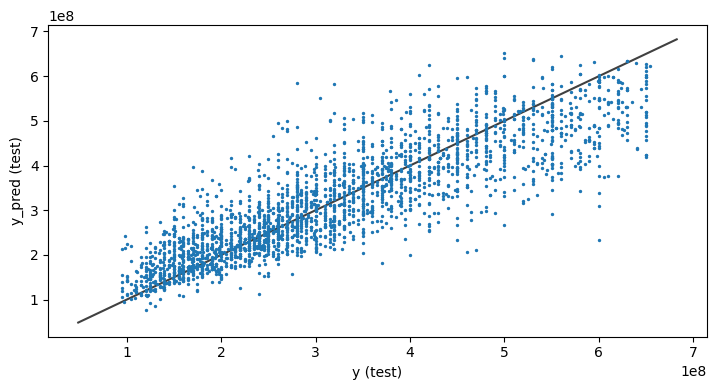

Modelo: Random Forest
R2 en Train: 0.9612092019988584
R2 ajustado en train: 0.9611908229606697
--------------------------
R2 en test: 0.7760994556238664
R2 ajustado en Test: 0.7756744356079663
--------------------------
RMSE en train: 27081978.584464185
RMSE en test: 65815792.30529548
--------------------------
MAE en train: 18243309.050527953
MAE en test: 44618366.83560502
--------------------------
MAPE en train: 0.06397331768504007
MAPE en test: 0.15574835807281198


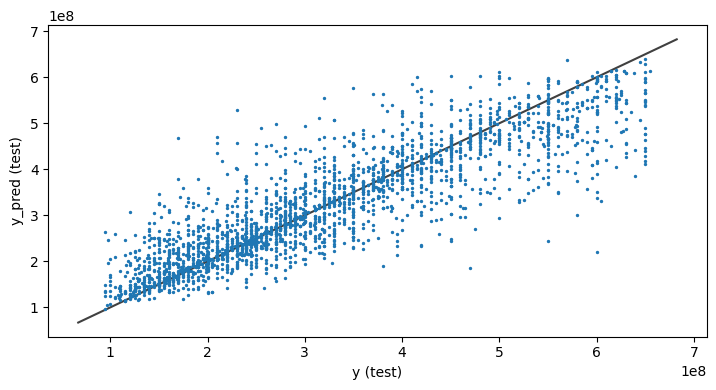

In [159]:
models = ['Regresión lineal', 'Árbol de Decisión', 'Vecinos más cercanos', 'Regresión XG Boosting', 'Random Forest']

for i, model in enumerate([linear_regressor, arbol_regressor, knn_regressor, xgboost_regressor, randomforest_regressor]):
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    print(f'Modelo: {models[i]}')
    
    r2_train= metrics.r2_score(y_train, y_train_pred)
    r2_test= metrics.r2_score(y_test, y_test_pred)
    
    adj_r2_train = 1 - ((1 - r2_train) * (len(y_train) - 1)) / (len(y_train) - X_train.shape[1] - 1)
    adj_r2_test = 1 - ((1 - r2_test) * (len(y_test) - 1)) / (len(y_test) - X_test.shape[1] - 1)
    
    RMSE_train=np.sqrt(mean_squared_error(y_train,y_train_pred))
    RMSE_test=np.sqrt(mean_squared_error(y_test,y_test_pred))
    
    MAE_train=mean_absolute_error(y_train,y_train_pred)
    MAE_test=mean_absolute_error(y_test,y_test_pred)
    
    MAPE_train=mean_absolute_percentage_error(y_train,y_train_pred)
    MAPE_test=mean_absolute_percentage_error(y_test,y_test_pred)



    print("R2 en Train:", r2_train)
    print("R2 ajustado en train:", adj_r2_train)
    print("--------------------------")
    print("R2 en test:", r2_test)
    print("R2 ajustado en Test:", adj_r2_test)
    print("--------------------------")
    print("RMSE en train:",RMSE_train)
    print("RMSE en test:",RMSE_test)
    print("--------------------------")
    print("MAE en train:",MAE_train)
    print("MAE en test:",MAE_test)
    print("--------------------------")
    print("MAPE en train:",MAPE_train)
    print("MAPE en test:",MAPE_test)
    

    plt.figure(figsize = (14,4))
   
    ax = plt.subplot(1,2,2)
    ax.scatter(y_test,y_test_pred, s =2)
    
    lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes]
    ]
    
    ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
    plt.xlabel('y (test)')
    plt.ylabel('y_pred (test)')
    
    plt.tight_layout()
    plt.show()

### Ajuste de los Modelos con el Subconjunto de datos 1

#### Ajuste arbol decision

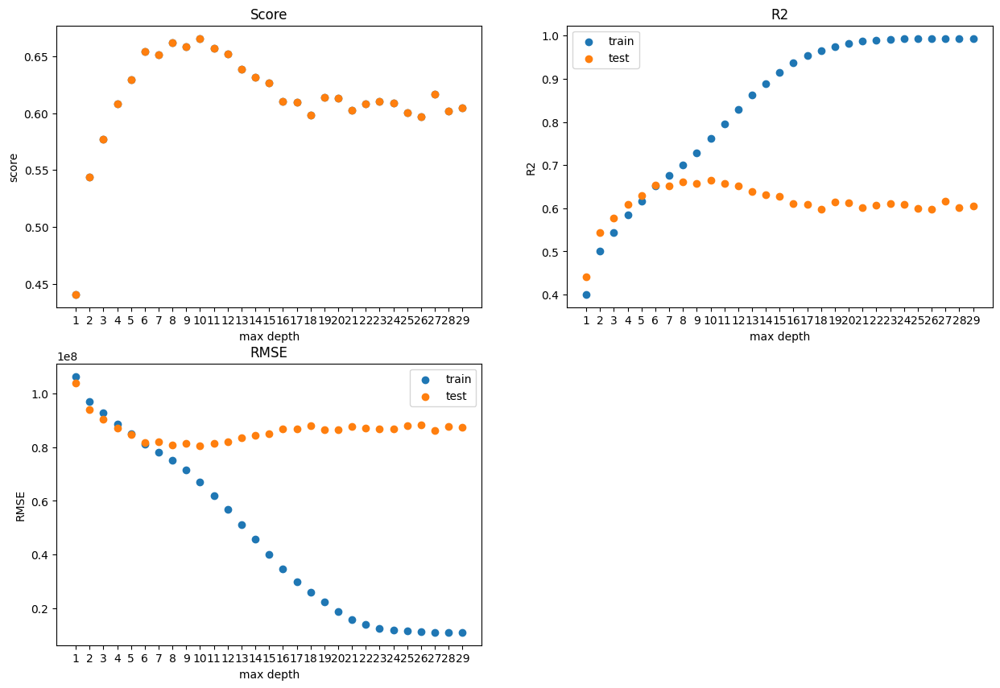

In [160]:
MAX_DEPTH_range = range(1, 30)
scores = []
arbol_r2_train_pred=[]
arbol_r2_test_pred=[]
arbol_rmse_train_pred=[]
arbol_rmse_test_pred=[]

for k in MAX_DEPTH_range:
    arbol_regressor = DecisionTreeRegressor(max_depth=k,random_state=42)
    arbol_regressor.fit(X_train, y_train)
    scores.append(arbol_regressor.score(X_test, y_test))
    
    y_train_pred = arbol_regressor.predict(X_train)
    y_test_pred = arbol_regressor.predict(X_test)
    
    arbol_r2_train = metrics.r2_score(y_train, y_train_pred)
    arbol_r2_train_pred.append(arbol_r2_train)
    arbol_r2_test = metrics.r2_score(y_test, y_test_pred)
    arbol_r2_test_pred.append(arbol_r2_test)
    
    arbol_rmse_train =np.sqrt(mean_squared_error(y_train,y_train_pred))
    arbol_rmse_train_pred.append(arbol_rmse_train)
    
    arbol_rmse_test =np.sqrt(mean_squared_error(y_test,y_test_pred))
    arbol_rmse_test_pred.append(arbol_rmse_test)
    
fig = plt.figure(figsize=(15,10))

ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223)

ax1.scatter(MAX_DEPTH_range,scores,marker="o")
ax1.scatter(MAX_DEPTH_range,scores,marker="o")

ax2.scatter(MAX_DEPTH_range,arbol_r2_train_pred,marker="o",label="train")
ax2.scatter(MAX_DEPTH_range,arbol_r2_test_pred,marker="o",label="test")

ax3.scatter(MAX_DEPTH_range,arbol_rmse_train_pred,marker="o",label="train")
ax3.scatter(MAX_DEPTH_range,arbol_rmse_test_pred,marker="o",label="test")

ax1.set_xticks(MAX_DEPTH_range)
ax2.set_xticks(MAX_DEPTH_range)
ax3.set_xticks(MAX_DEPTH_range)

ax2.legend()
ax3.legend()

ax1.set_title('Score')
ax1.set_xlabel('max depth')
ax1.set_ylabel('score')

ax2.set_title('R2')
ax2.set_xlabel('max depth')
ax2.set_ylabel('R2')

ax3.set_title('RMSE')
ax3.set_xlabel('max depth')
ax3.set_ylabel('RMSE')

plt.show()

La profundidad optima del arbol de decision se encuentra en 7, valor que es justificado al comparar con el grafico de R2

In [161]:
arbol_optimo = DecisionTreeRegressor(max_depth= 7,random_state=42)
arbol_optimo.fit(X_train,y_train)

DecisionTreeRegressor(max_depth=7, random_state=42)

#### Ajuste knn

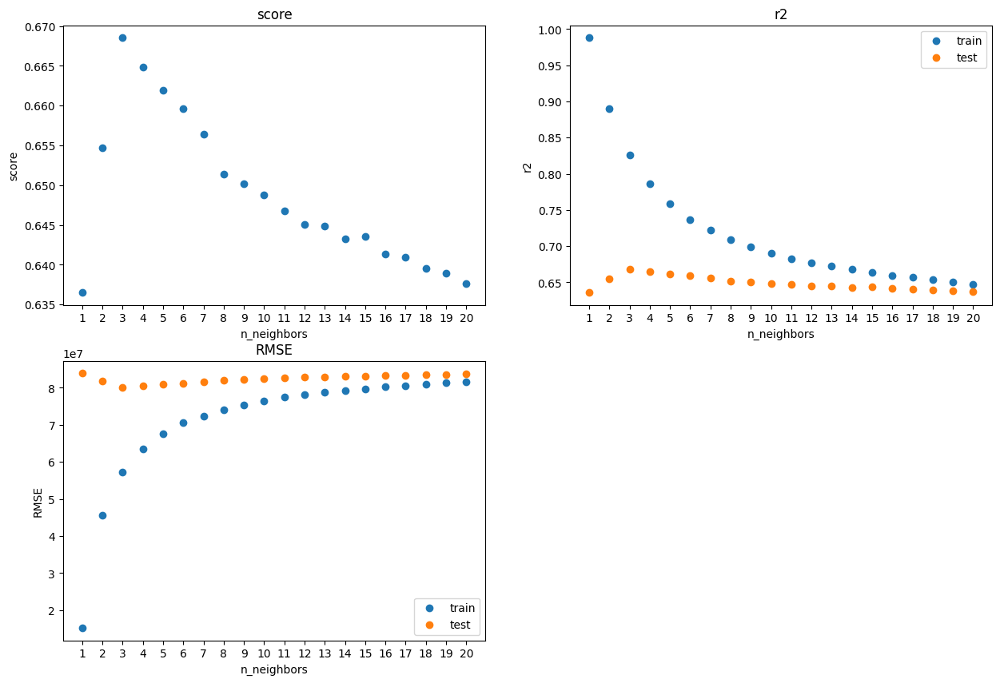

In [162]:
k_range = range(1, 21)
scores = []
r2_train_pred=[]
r2_train_test=[]
rmse_train_pred=[]
rmse_test_pred=[]

for k in k_range:
    knn_regressor = KNeighborsRegressor(n_neighbors = k)
    knn_regressor.fit(X_train, y_train)
    scores.append(knn_regressor.score(X_test, y_test))
    
    y_train_pred = knn_regressor.predict(X_train)
    r2_train = metrics.r2_score(y_train, y_train_pred)
    r2_train_pred.append(r2_train)
    
    y_test_pred = knn_regressor.predict(X_test)
    r2_test = metrics.r2_score(y_test, y_test_pred)
    r2_train_test.append(r2_test)
    
    rmse_train =np.sqrt(mean_squared_error(y_train,y_train_pred))
    rmse_train_pred.append(rmse_train)
    
    rmse_test =np.sqrt(mean_squared_error(y_test,y_test_pred))
    rmse_test_pred.append(rmse_test)
    

fig = plt.figure(figsize=(15,10))

ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223)


ax1.scatter(k_range,scores,marker="o")
ax2.scatter(k_range,r2_train_pred,marker="o",label="train")
ax2.scatter(k_range,r2_train_test,marker="o",label="test")

ax3.scatter(k_range,rmse_train_pred,marker="o",label="train")
ax3.scatter(k_range,rmse_test_pred,marker="o",label="test")

ax1.set_xticks(k_range)
ax2.set_xticks(k_range)
ax3.set_xticks(k_range)


ax2.legend()
ax3.legend()


ax1.set_title('score')
ax1.set_xlabel('n_neighbors')
ax1.set_ylabel('score')

ax2.set_title('r2')
ax2.set_xlabel('n_neighbors')
ax2.set_ylabel('r2')


ax3.set_title('RMSE')
ax3.set_xlabel('n_neighbors')
ax3.set_ylabel('RMSE')

plt.show()

El numero optimo de vecinos mas cercanos se encuentra en 3, donde encontramos una exactitud de 0.75, aunque el r2 en este caso se ve algo afectado si consideramos Train, aun asi en Test encontramos el punto mas alto en 3

In [163]:
knn_optimo = KNeighborsRegressor(n_neighbors=4)
knn_optimo.fit(X_train,y_train)

KNeighborsRegressor(n_neighbors=4)

#### Ajuste Random Forest

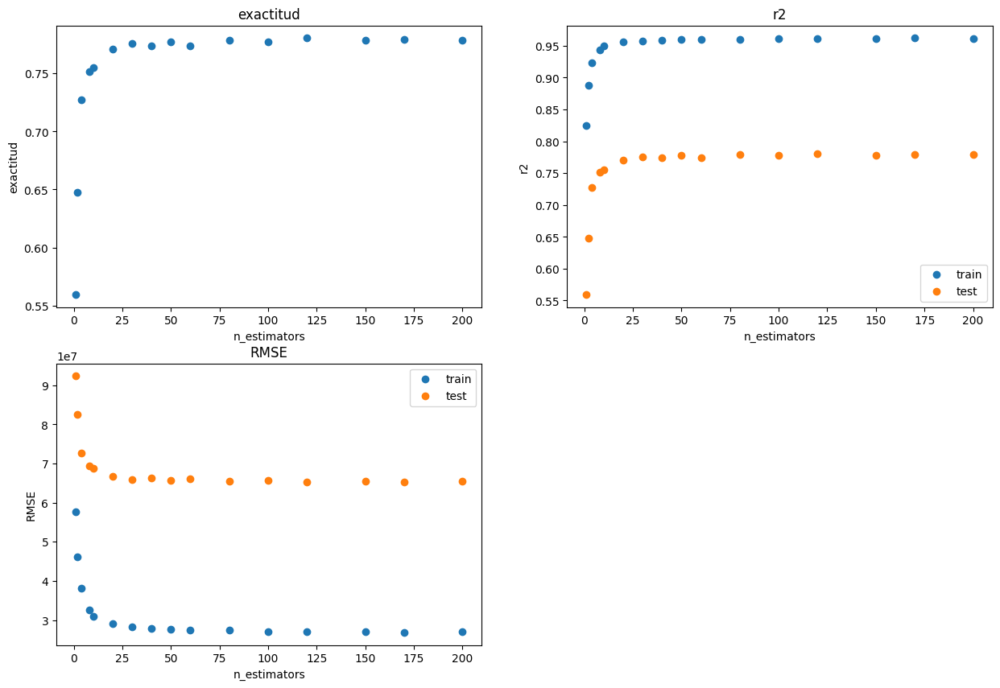

In [164]:
n_estimators = [1, 2, 4, 8, 10, 20, 30, 40, 50, 60,80, 100,120, 150, 170, 200]
scores = []
r2_train_pred=[]
r2_train_test=[]
rmse_train_pred=[]
rmse_test_pred=[]


for k in n_estimators:
    rf_regressor = RandomForestRegressor(n_estimators=k)
    rf_regressor.fit(X_train, y_train)
    scores.append(rf_regressor.score(X_test, y_test))
    
    y_train_pred = rf_regressor.predict(X_train)
    r2_train = metrics.r2_score(y_train, y_train_pred)
    r2_train_pred.append(r2_train)
    
    y_test_pred = rf_regressor.predict(X_test)
    r2_test = metrics.r2_score(y_test, y_test_pred)
    r2_train_test.append(r2_test)
    
    rmse_train =np.sqrt(mean_squared_error(y_train,y_train_pred))
    rmse_train_pred.append(rmse_train)
    
    rmse_test =np.sqrt(mean_squared_error(y_test,y_test_pred))
    rmse_test_pred.append(rmse_test)
    

fig = plt.figure(figsize=(15,10))

ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223)


ax1.scatter(n_estimators,scores,marker="o")
ax2.scatter(n_estimators,r2_train_pred,marker="o",label="train")
ax2.scatter(n_estimators,r2_train_test,marker="o",label="test")

ax3.scatter(n_estimators,rmse_train_pred,marker="o",label="train")
ax3.scatter(n_estimators,rmse_test_pred,marker="o",label="test")


ax2.legend()
ax3.legend()


ax1.set_title('exactitud')
ax1.set_xlabel('n_estimators')
ax1.set_ylabel('exactitud')

ax2.set_title('r2')
ax2.set_xlabel('n_estimators')
ax2.set_ylabel('r2')


ax3.set_title('RMSE')
ax3.set_xlabel('n_estimators')
ax3.set_ylabel('RMSE')

plt.show()

Profundidad maxima

In [165]:
randomforest_optimo = RandomForestRegressor(n_estimators = 100)
randomforest_optimo.fit(X_train,y_train)

RandomForestRegressor()

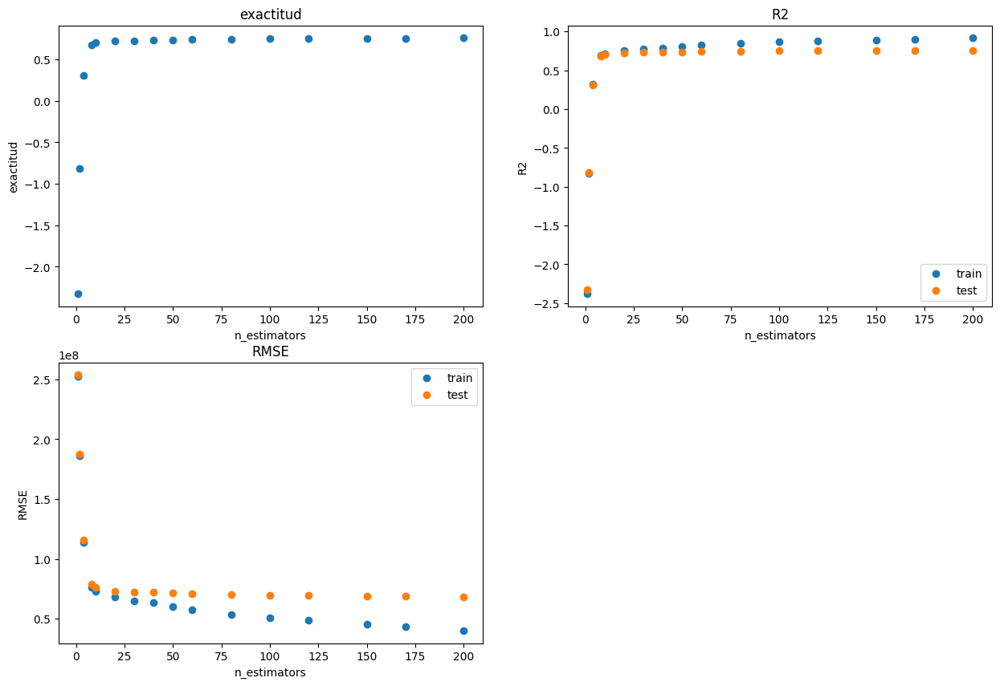

In [166]:
n_estimators = [1, 2, 4, 8, 10, 20, 30, 40, 50, 60,80, 100,120, 150, 170, 200]
scores = []
r2_train_pred=[]
r2_train_test=[]
rmse_train_pred=[]
rmse_test_pred=[]


for k in n_estimators:
    xgb_regressor = xgboost.XGBRegressor(n_estimators=k)
    xgb_regressor.fit(X_train, y_train)
    scores.append(xgb_regressor.score(X_test, y_test))
    
    y_train_pred = xgb_regressor.predict(X_train)
    r2_train = metrics.r2_score(y_train, y_train_pred)
    r2_train_pred.append(r2_train)
    
    y_test_pred = xgb_regressor.predict(X_test)
    r2_test = metrics.r2_score(y_test, y_test_pred)
    r2_train_test.append(r2_test)
    
    rmse_train =np.sqrt(mean_squared_error(y_train,y_train_pred))
    rmse_train_pred.append(rmse_train)
    
    rmse_test =np.sqrt(mean_squared_error(y_test,y_test_pred))
    rmse_test_pred.append(rmse_test)
    

fig = plt.figure(figsize=(15,10))

ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223)


ax1.scatter(n_estimators,scores,marker="o")
ax2.scatter(n_estimators,r2_train_pred,marker="o",label="train")
ax2.scatter(n_estimators,r2_train_test,marker="o",label="test")

ax3.scatter(n_estimators,rmse_train_pred,marker="o",label="train")
ax3.scatter(n_estimators,rmse_test_pred,marker="o",label="test")

ax2.legend()
ax3.legend()


ax1.set_title('exactitud')
ax1.set_xlabel('n_estimators')
ax1.set_ylabel('exactitud')

ax2.set_title('R2')
ax2.set_xlabel('n_estimators')
ax2.set_ylabel('R2')


ax3.set_title('RMSE')
ax3.set_xlabel('n_estimators')
ax3.set_ylabel('RMSE')

plt.show()

In [167]:
xgboost_regressor_optimo =xgboost.XGBRegressor(n_estimators=1000, learning_rate=0.05, n_jobs=4)
xgboost_regressor_optimo.fit(X_train,y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.05, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=1000,
             n_jobs=4, num_parallel_tree=1, predictor='auto', random_state=0,
             reg_alpha=0, reg_lambda=1, ...)

### Resultados ajustados de los modelos con el subconjunto de datos 1

Modelo: Regresion Lineal
R2 en Train: 0.5278017066715841
R2 ajustado en train: 0.5275779796303028
--------------------------
R2 en test: 0.5359929466226653
R2 ajustado en Test: 0.5351121435600659
--------------------------
RMSE en train: 94488344.491277
RMSE en test: 94746860.92959999
--------------------------
MAE en train: 73281532.29378462
MAE en test: 72830906.2534759
--------------------------
MAPE en train: 0.26444507173107606
MAPE en test: 0.26166034160505963


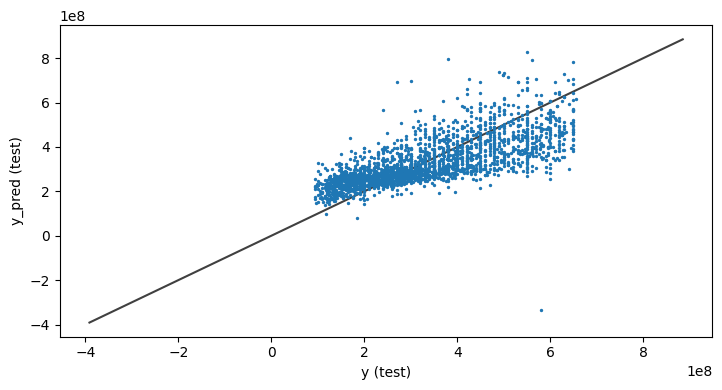

Modelo: Árbol de Decisión optimo
R2 en Train: 0.6760928305801259
R2 ajustado en train: 0.6759393637131592
--------------------------
R2 en test: 0.6517164908129178
R2 ajustado en Test: 0.6510553603854556
--------------------------
RMSE en train: 78257561.96679892
RMSE en test: 82085981.39737895
--------------------------
MAE en train: 59427055.63567791
MAE en test: 61342475.27402256
--------------------------
MAPE en train: 0.2072134182879804
MAPE en test: 0.21197874266531502


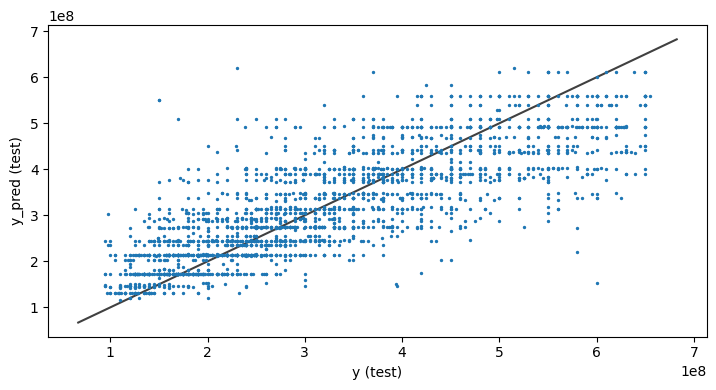

Modelo: Vecinos más cercanos optimo
R2 en Train: 0.7862777688978363
R2 ajustado en train: 0.786176507535616
--------------------------
R2 en test: 0.6648054863551814
R2 ajustado en Test: 0.6641692021607153
--------------------------
RMSE en train: 63568341.81451925
RMSE en test: 80528755.93635903
--------------------------
MAE en train: 44690882.31558386
MAE en test: 57827437.357670456
--------------------------
MAPE en train: 0.15565027128295109
MAPE en test: 0.20057461759213113


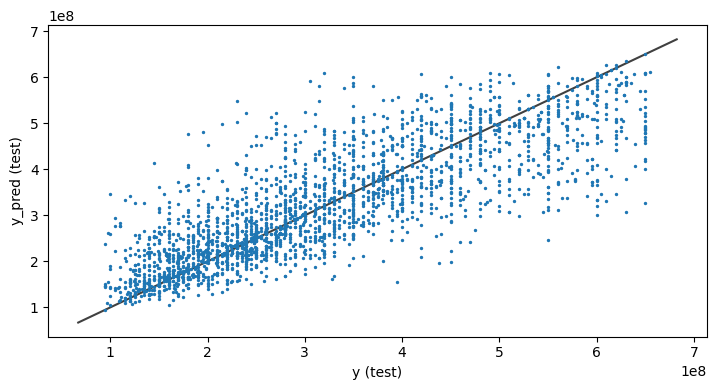

Modelo: Random Forest optimo
R2 en Train: 0.9603892362014861
R2 ajustado en train: 0.9603704686643884
--------------------------
R2 en test: 0.7809815813729375
R2 ajustado en Test: 0.7805658288698489
--------------------------
RMSE en train: 27366713.256333586
RMSE en test: 65094284.62005124
--------------------------
MAE en train: 18365212.56460777
MAE en test: 44115941.43191862
--------------------------
MAPE en train: 0.06429991172044379
MAPE en test: 0.15371020321169376


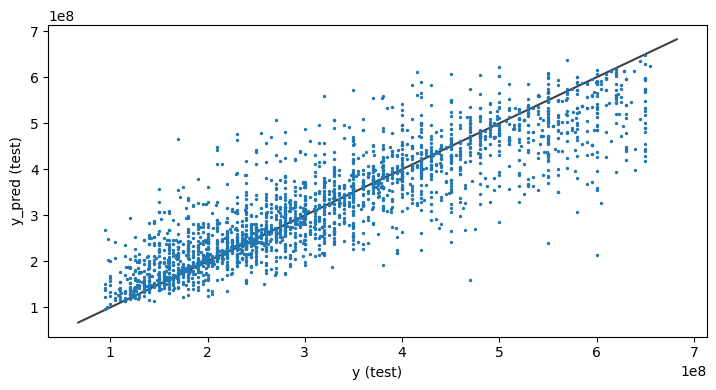

Modelo: XGB optimo
R2 en Train: 0.8985599399207638
R2 ajustado en train: 0.8985118777298801
--------------------------
R2 en test: 0.7682993543188299
R2 ajustado en Test: 0.7678595277324951
--------------------------
RMSE en train: 43794622.00103184
RMSE en test: 66952401.78339006
--------------------------
MAE en train: 31509114.16071598
MAE en test: 48091807.413636364
--------------------------
MAPE en train: 0.110712871140984
MAPE en test: 0.163844968710924


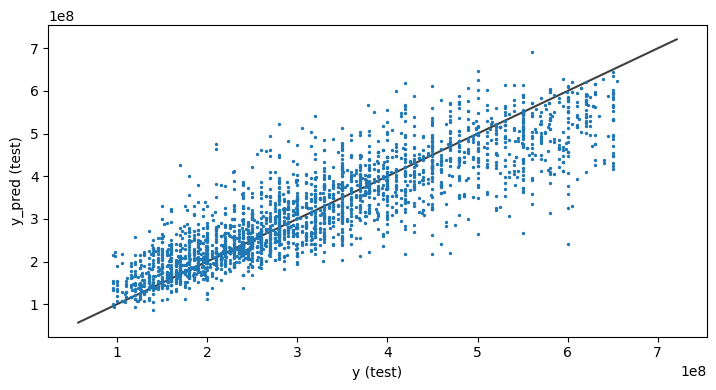

In [168]:
models2 = [ 'Regresion Lineal','Árbol de Decisión optimo', 'Vecinos más cercanos optimo',  'Random Forest optimo', 'XGB optimo']
for i, model in enumerate([linear_regressor, arbol_optimo, knn_optimo, randomforest_optimo,xgboost_regressor_optimo]):
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    print(f'Modelo: {models2[i]}')
    
    r2_train= metrics.r2_score(y_train, y_train_pred)
    r2_test= metrics.r2_score(y_test, y_test_pred)
    
    adj_r2_train = 1 - ((1 - r2_train) * (len(y_train) - 1)) / (len(y_train) - X_train.shape[1] - 1)
    adj_r2_test = 1 - ((1 - r2_test) * (len(y_test) - 1)) / (len(y_test) - X_test.shape[1] - 1)
    
    RMSE_train=np.sqrt(mean_squared_error(y_train,y_train_pred))
    RMSE_test=np.sqrt(mean_squared_error(y_test,y_test_pred))
    
    MAE_train=mean_absolute_error(y_train,y_train_pred)
    MAE_test=mean_absolute_error(y_test,y_test_pred)
    
    MAPE_train=mean_absolute_percentage_error(y_train,y_train_pred)
    MAPE_test=mean_absolute_percentage_error(y_test,y_test_pred)

    print("R2 en Train:", r2_train)
    print("R2 ajustado en train:", adj_r2_train)
    print("--------------------------")
    print("R2 en test:", r2_test)
    print("R2 ajustado en Test:", adj_r2_test)
    print("--------------------------")
    print("RMSE en train:",RMSE_train)
    print("RMSE en test:",RMSE_test)
    print("--------------------------")
    print("MAE en train:",MAE_train)
    print("MAE en test:",MAE_test)
    print("--------------------------")
    print("MAPE en train:",MAPE_train)
    print("MAPE en test:",MAPE_test)
    

    plt.figure(figsize = (14,4))
   
    ax = plt.subplot(1,2,2)
    ax.scatter(y_test,y_test_pred, s =2)
    
    lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes]
    ]
    
    ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
    plt.xlabel('y (test)')
    plt.ylabel('y_pred (test)')
    
    plt.tight_layout()
    plt.show()

## Modelos con subconjunto de datos 2 y variables categoricas

In [169]:
df2=viviendas_Medellin_loc

In [170]:
df2.columns

Index(['id', 'fecha_publicacion', 'latitud', 'longitud', 'pais',
       'departamento', 'municipio', 'barrio', 'habitaciones', 'baños',
       'superficie_total', 'superficie_cubierta', 'precio', 'moneda', 'titulo',
       'descripcion', 'tipo_propiedad', 'precio_m2'],
      dtype='object')

In [171]:
df2=df2[['latitud', 'longitud', 'municipio', 'barrio',
       'habitaciones', 'baños', 'superficie_total', 'precio', 'tipo_propiedad']]

In [172]:
df2= pd.get_dummies(data=df2,prefix="municipio",columns=["municipio"])

In [173]:
df2= pd.get_dummies(data=df2,prefix="barrio",columns=["barrio"])

In [174]:
df2= pd.get_dummies(data=df2,prefix="property_type",columns=["tipo_propiedad"])

In [175]:
df2.columns

Index(['latitud', 'longitud', 'habitaciones', 'baños', 'superficie_total',
       'precio', 'municipio_barbosa', 'municipio_bello', 'municipio_caldas',
       'municipio_copacabana', 'municipio_envigado', 'municipio_girardota',
       'municipio_itagui', 'municipio_la estrella', 'municipio_medellín',
       'municipio_sabaneta', 'barrio_', 'barrio_altavista', 'barrio_aranjuez',
       'barrio_belén', 'barrio_buenos aires', 'barrio_candelaria',
       'barrio_castilla', 'barrio_doce de octubre', 'barrio_el poblado',
       'barrio_guayabal', 'barrio_la américa', 'barrio_laureles',
       'barrio_manrique', 'barrio_palmitas', 'barrio_popular',
       'barrio_robledo', 'barrio_san antonio de prado', 'barrio_san cristóbal',
       'barrio_san javier', 'barrio_santa cruz', 'barrio_santa elena',
       'barrio_villa hermosa', 'property_type_casa',
       'property_type_departamento'],
      dtype='object')

In [176]:
X_2 = df2.drop('precio',axis=1)
y_2 = df2['precio']
X_2.head()
X_2.describe()
X_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13199 entries, 70 to 562568
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   latitud                      13199 non-null  float64
 1   longitud                     13199 non-null  float64
 2   habitaciones                 13199 non-null  float64
 3   baños                        13199 non-null  float64
 4   superficie_total             13199 non-null  float64
 5   municipio_barbosa            13199 non-null  uint8  
 6   municipio_bello              13199 non-null  uint8  
 7   municipio_caldas             13199 non-null  uint8  
 8   municipio_copacabana         13199 non-null  uint8  
 9   municipio_envigado           13199 non-null  uint8  
 10  municipio_girardota          13199 non-null  uint8  
 11  municipio_itagui             13199 non-null  uint8  
 12  municipio_la estrella        13199 non-null  uint8  
 13  municipio_mede

Datos de entrenamiento y datos de prueba

In [177]:
X_train,X_test,y_train,y_test = train_test_split(X_2,y_2,train_size=0.8,test_size=0.2,random_state=42)

scale = preprocessing.StandardScaler()
scale.fit(X_train)
X_train = scale.transform(X_train)
X_test = scale.transform(X_test)

#### LinearRegression

In [178]:
linear_regressor = LinearRegression()
linear_regressor.fit(X_train,y_train)

LinearRegression()

In [179]:
y_linear_train_pred= linear_regressor.predict(X_train)
y_linear_test_pred=linear_regressor.predict(X_test)

#### Arbol de decision

In [180]:
arbol_regressor = DecisionTreeRegressor(random_state=42)
arbol_regressor.fit(X_train,y_train)

DecisionTreeRegressor(random_state=42)

In [181]:
y_arbol_pred_train = arbol_regressor.predict(X_train)
y_arbol_pred_test = arbol_regressor.predict(X_test)

#### KNN Vecinos mas cercanos

In [182]:
knn_regressor = KNeighborsRegressor()

In [183]:
knn_regressor.fit(X_train,y_train)

KNeighborsRegressor()

In [184]:
y_knn_pred_train = knn_regressor.predict(X_train)
y_knn_pred_test = knn_regressor.predict(X_test)

#### XG Boost Regressor

In [185]:
xgboost_regressor = xgboost.XGBRegressor() 

In [186]:
xgboost_regressor.fit(X_train,y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, ...)

In [187]:
y_xgb_train_pred= xgboost_regressor.predict(X_train)
y_xgb_test_pred=xgboost_regressor.predict(X_test)

#### Random Forest

In [188]:
randomforest_regressor = RandomForestRegressor()

In [189]:
randomforest_regressor.fit(X_train,y_train)

RandomForestRegressor()

In [190]:
y_rf_train_pred= randomforest_regressor.predict(X_train)
y_rf_test_pred=randomforest_regressor.predict(X_test)

### Resultados iniciales de los modelos con subconjunto de datos 2

Modelo: Regresión lineal
R2 en Train: 0.6200834708178123
R2 ajustado en train: 0.6186749011212532
--------------------------
R2 en test: 0.6372752673064543
R2 ajustado en Test: 0.6318343963160511
--------------------------
RMSE en train: 84753985.12468371
RMSE en test: 83770503.10493058
--------------------------
MAE en train: 65341981.8904667
MAE en test: 64515463.73923532
--------------------------
MAPE en train: 0.22958255555710014
MAPE en test: 0.225507712313094


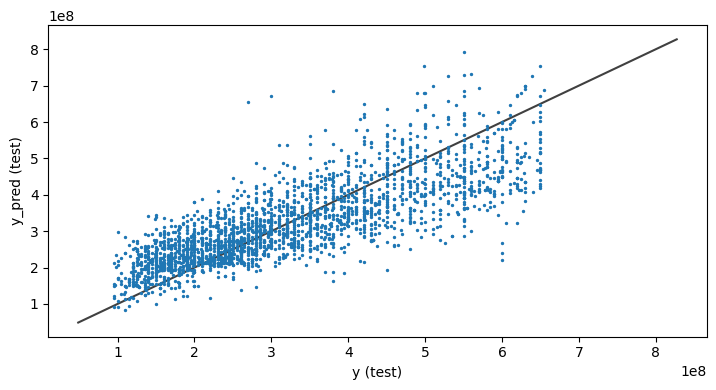

Modelo: Árbol de Decisión
R2 en Train: 0.9960498155977235
R2 ajustado en train: 0.9960351699858129
--------------------------
R2 en test: 0.6477807451909381
R2 ajustado en Test: 0.6424974563688022
--------------------------
RMSE en train: 8642208.071316047
RMSE en test: 82548480.98444405
--------------------------
MAE en train: 1918961.6627782884
MAE en test: 50284466.163982205
--------------------------
MAPE en train: 0.007235543535883827
MAPE en test: 0.16950526826541212


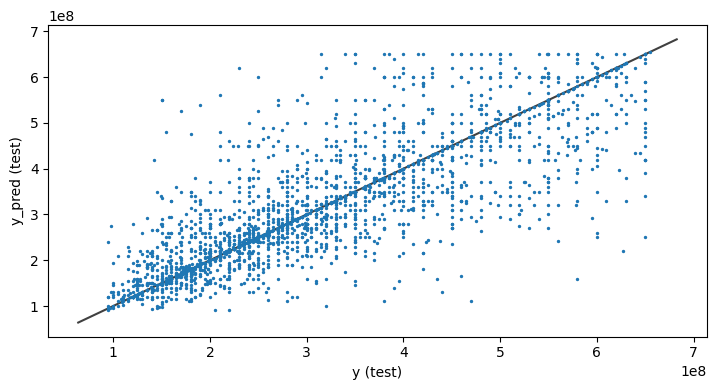

Modelo: Vecinos más cercanos
R2 en Train: 0.7858256030376491
R2 ajustado en train: 0.7850315350196311
--------------------------
R2 en test: 0.7007944289043829
R2 ajustado en Test: 0.6963063453379487
--------------------------
RMSE en train: 63635551.12391078
RMSE en test: 76082955.87329896
--------------------------
MAE en train: 45102261.74171797
MAE en test: 55244167.96712121
--------------------------
MAPE en train: 0.15582443316973527
MAPE en test: 0.19061738405724077


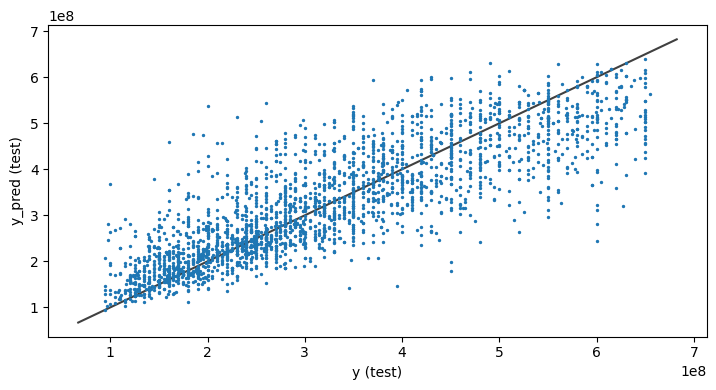

Modelo: Regresión XG Boosting
R2 en Train: 0.8743601399647666
R2 ajustado en train: 0.873894320538835
--------------------------
R2 en test: 0.7823775673832335
R2 ajustado en Test: 0.779113230893982
--------------------------
RMSE en train: 48739352.499907844
RMSE en test: 64886503.07099967
--------------------------
MAE en train: 35746190.968557626
MAE en test: 47193490.31363636
--------------------------
MAPE en train: 0.12294362767744328
MAPE en test: 0.16009262198662264


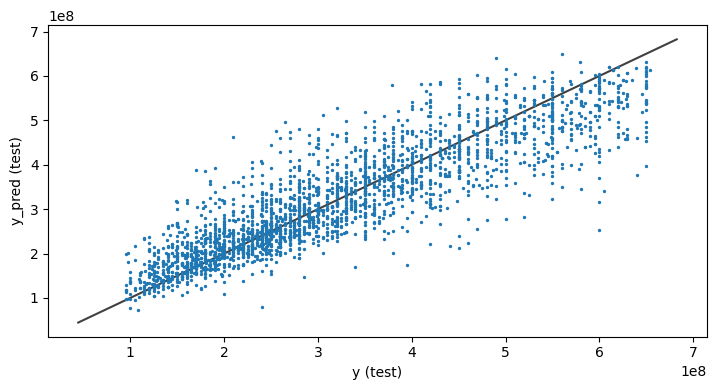

Modelo: Random Forest
R2 en Train: 0.9664011208397114
R2 ajustado en train: 0.966276550415978
--------------------------
R2 en test: 0.8025181171850974
R2 ajustado en Test: 0.7995558889428738
--------------------------
RMSE en train: 25204519.837029986
RMSE en test: 61811056.76284771
--------------------------
MAE en train: 17016754.89147181
MAE en test: 42259889.34763286
--------------------------
MAPE en train: 0.0590319655315664
MAPE en test: 0.14487052158678132


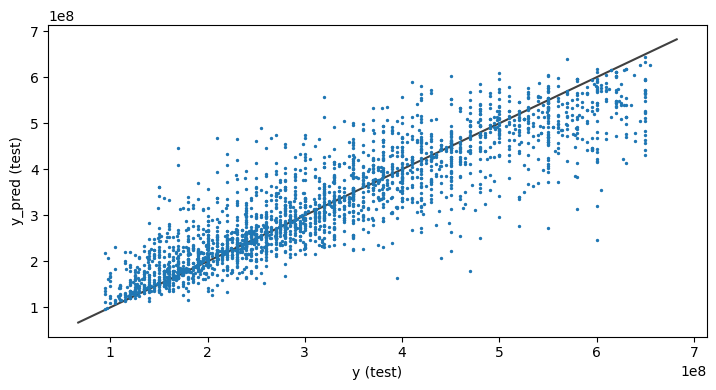

In [191]:
models = ['Regresión lineal', 'Árbol de Decisión', 'Vecinos más cercanos', 'Regresión XG Boosting', 'Random Forest']

for i, model in enumerate([linear_regressor, arbol_regressor, knn_regressor, xgboost_regressor, randomforest_regressor]):
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    print(f'Modelo: {models[i]}')
    
    r2_train= metrics.r2_score(y_train, y_train_pred)
    r2_test= metrics.r2_score(y_test, y_test_pred)
    
    adj_r2_train = 1 - ((1 - r2_train) * (len(y_train) - 1)) / (len(y_train) - X_train.shape[1] - 1)
    adj_r2_test = 1 - ((1 - r2_test) * (len(y_test) - 1)) / (len(y_test) - X_test.shape[1] - 1)
    
    RMSE_train=np.sqrt(mean_squared_error(y_train,y_train_pred))
    RMSE_test=np.sqrt(mean_squared_error(y_test,y_test_pred))
    
    MAE_train=mean_absolute_error(y_train,y_train_pred)
    MAE_test=mean_absolute_error(y_test,y_test_pred)
    
    MAPE_train=mean_absolute_percentage_error(y_train,y_train_pred)
    MAPE_test=mean_absolute_percentage_error(y_test,y_test_pred)



    print("R2 en Train:", r2_train)
    print("R2 ajustado en train:", adj_r2_train)
    print("--------------------------")
    print("R2 en test:", r2_test)
    print("R2 ajustado en Test:", adj_r2_test)
    print("--------------------------")
    print("RMSE en train:",RMSE_train)
    print("RMSE en test:",RMSE_test)
    print("--------------------------")
    print("MAE en train:",MAE_train)
    print("MAE en test:",MAE_test)
    print("--------------------------")
    print("MAPE en train:",MAPE_train)
    print("MAPE en test:",MAPE_test)
    

    plt.figure(figsize = (14,4))
   
    ax = plt.subplot(1,2,2)
    ax.scatter(y_test,y_test_pred, s =2)
    
    lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes]
    ]
    
    ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
    plt.xlabel('y (test)')
    plt.ylabel('y_pred (test)')
    
    plt.tight_layout()
    plt.show()

### Ajuste de los Modelos

#### Ajuste arbol decision

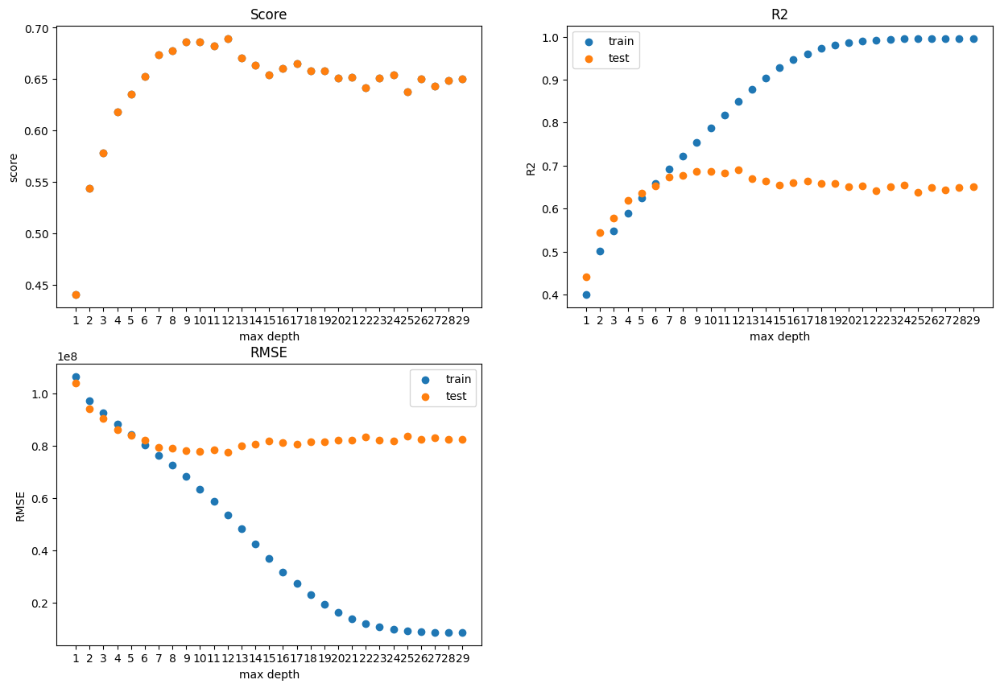

In [192]:
MAX_DEPTH_range = range(1, 30)
scores = []
arbol_r2_train_pred=[]
arbol_r2_test_pred=[]
arbol_rmse_train_pred=[]
arbol_rmse_test_pred=[]

for k in MAX_DEPTH_range:
    arbol_regressor = DecisionTreeRegressor(max_depth=k,random_state=42)
    arbol_regressor.fit(X_train, y_train)
    scores.append(arbol_regressor.score(X_test, y_test))
    
    y_train_pred = arbol_regressor.predict(X_train)
    y_test_pred = arbol_regressor.predict(X_test)
    
    arbol_r2_train = metrics.r2_score(y_train, y_train_pred)
    arbol_r2_train_pred.append(arbol_r2_train)
    arbol_r2_test = metrics.r2_score(y_test, y_test_pred)
    arbol_r2_test_pred.append(arbol_r2_test)
    
    arbol_rmse_train =np.sqrt(mean_squared_error(y_train,y_train_pred))
    arbol_rmse_train_pred.append(arbol_rmse_train)
    
    arbol_rmse_test =np.sqrt(mean_squared_error(y_test,y_test_pred))
    arbol_rmse_test_pred.append(arbol_rmse_test)
    
fig = plt.figure(figsize=(15,10))

ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223)

ax1.scatter(MAX_DEPTH_range,scores,marker="o")
ax1.scatter(MAX_DEPTH_range,scores,marker="o")

ax2.scatter(MAX_DEPTH_range,arbol_r2_train_pred,marker="o",label="train")
ax2.scatter(MAX_DEPTH_range,arbol_r2_test_pred,marker="o",label="test")

ax3.scatter(MAX_DEPTH_range,arbol_rmse_train_pred,marker="o",label="train")
ax3.scatter(MAX_DEPTH_range,arbol_rmse_test_pred,marker="o",label="test")

ax1.set_xticks(MAX_DEPTH_range)
ax2.set_xticks(MAX_DEPTH_range)
ax3.set_xticks(MAX_DEPTH_range)

ax2.legend()
ax3.legend()

ax1.set_title('Score')
ax1.set_xlabel('max depth')
ax1.set_ylabel('score')

ax2.set_title('R2')
ax2.set_xlabel('max depth')
ax2.set_ylabel('R2')

ax3.set_title('RMSE')
ax3.set_xlabel('max depth')
ax3.set_ylabel('RMSE')

plt.show()

La profundidad optima del arbol de decision se encuentra en 7, valor que es justificado al comparar con el grafico de R2

In [193]:
arbol_optimo = DecisionTreeRegressor(max_depth= 7,random_state=42)
arbol_optimo.fit(X_train,y_train)

DecisionTreeRegressor(max_depth=7, random_state=42)

#### Ajuste knn

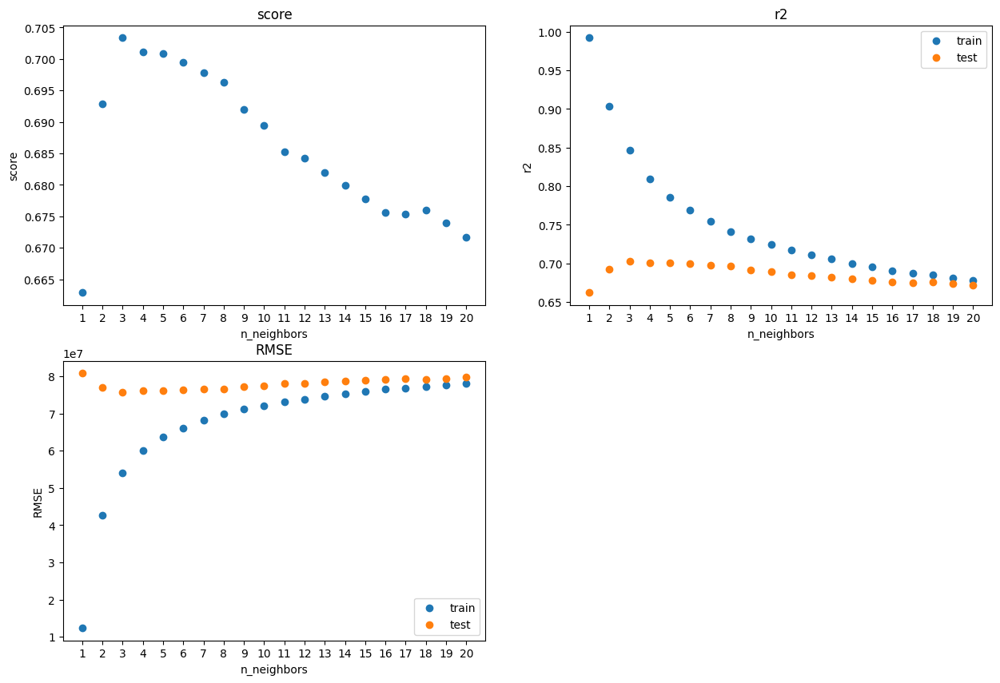

In [194]:
k_range = range(1, 21)
scores = []
r2_train_pred=[]
r2_train_test=[]
rmse_train_pred=[]
rmse_test_pred=[]

for k in k_range:
    knn_regressor = KNeighborsRegressor(n_neighbors = k)
    knn_regressor.fit(X_train, y_train)
    scores.append(knn_regressor.score(X_test, y_test))
    
    y_train_pred = knn_regressor.predict(X_train)
    r2_train = metrics.r2_score(y_train, y_train_pred)
    r2_train_pred.append(r2_train)
    
    y_test_pred = knn_regressor.predict(X_test)
    r2_test = metrics.r2_score(y_test, y_test_pred)
    r2_train_test.append(r2_test)
    
    rmse_train =np.sqrt(mean_squared_error(y_train,y_train_pred))
    rmse_train_pred.append(rmse_train)
    
    rmse_test =np.sqrt(mean_squared_error(y_test,y_test_pred))
    rmse_test_pred.append(rmse_test)
    

fig = plt.figure(figsize=(15,10))

ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223)


ax1.scatter(k_range,scores,marker="o")
ax2.scatter(k_range,r2_train_pred,marker="o",label="train")
ax2.scatter(k_range,r2_train_test,marker="o",label="test")

ax3.scatter(k_range,rmse_train_pred,marker="o",label="train")
ax3.scatter(k_range,rmse_test_pred,marker="o",label="test")

ax1.set_xticks(k_range)
ax2.set_xticks(k_range)
ax3.set_xticks(k_range)


ax2.legend()
ax3.legend()


ax1.set_title('score')
ax1.set_xlabel('n_neighbors')
ax1.set_ylabel('score')

ax2.set_title('r2')
ax2.set_xlabel('n_neighbors')
ax2.set_ylabel('r2')


ax3.set_title('RMSE')
ax3.set_xlabel('n_neighbors')
ax3.set_ylabel('RMSE')

plt.show()

El numero optimo de vecinos mas cercanos se encuentra en 3, donde encontramos una exactitud de 0.75, aunque el r2 en este caso se ve algo afectado si consideramos Train, aun asi en Test encontramos el punto mas alto en 3

In [195]:
knn_optimo = KNeighborsRegressor(n_neighbors=3)
knn_optimo.fit(X_train,y_train)

KNeighborsRegressor(n_neighbors=3)

#### Ajuste Random Forest

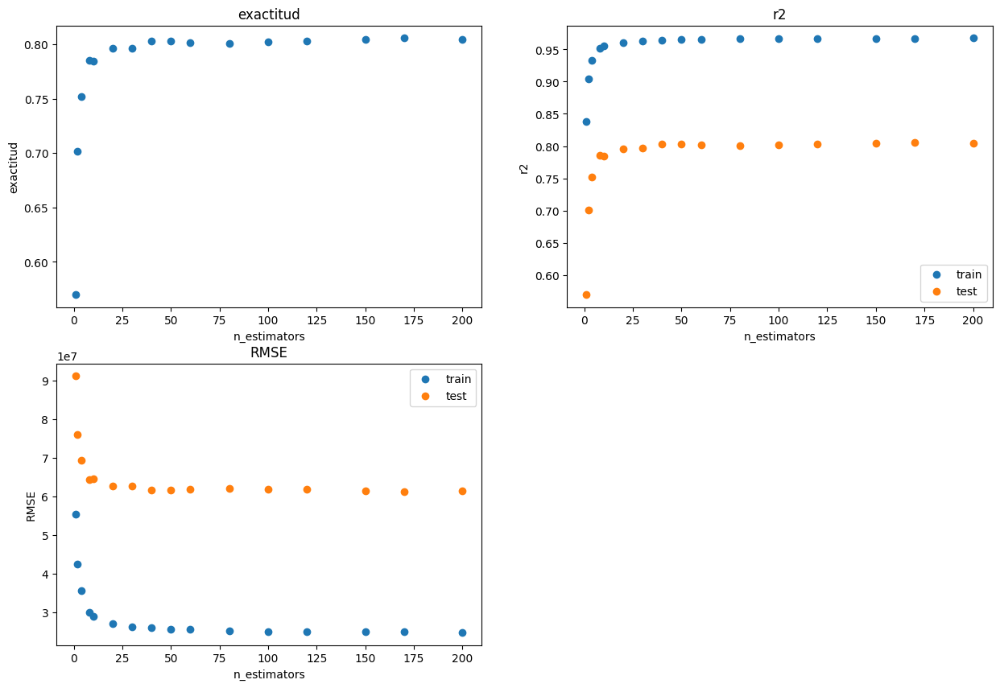

In [196]:
n_estimators = [1, 2, 4, 8, 10, 20, 30, 40, 50, 60,80, 100,120, 150, 170, 200]
scores = []
r2_train_pred=[]
r2_train_test=[]
rmse_train_pred=[]
rmse_test_pred=[]


for k in n_estimators:
    rf_regressor = RandomForestRegressor(n_estimators=k)
    rf_regressor.fit(X_train, y_train)
    scores.append(rf_regressor.score(X_test, y_test))
    
    y_train_pred = rf_regressor.predict(X_train)
    r2_train = metrics.r2_score(y_train, y_train_pred)
    r2_train_pred.append(r2_train)
    
    y_test_pred = rf_regressor.predict(X_test)
    r2_test = metrics.r2_score(y_test, y_test_pred)
    r2_train_test.append(r2_test)
    
    rmse_train =np.sqrt(mean_squared_error(y_train,y_train_pred))
    rmse_train_pred.append(rmse_train)
    
    rmse_test =np.sqrt(mean_squared_error(y_test,y_test_pred))
    rmse_test_pred.append(rmse_test)
    

fig = plt.figure(figsize=(15,10))

ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223)


ax1.scatter(n_estimators,scores,marker="o")
ax2.scatter(n_estimators,r2_train_pred,marker="o",label="train")
ax2.scatter(n_estimators,r2_train_test,marker="o",label="test")

ax3.scatter(n_estimators,rmse_train_pred,marker="o",label="train")
ax3.scatter(n_estimators,rmse_test_pred,marker="o",label="test")


ax2.legend()
ax3.legend()


ax1.set_title('exactitud')
ax1.set_xlabel('n_estimators')
ax1.set_ylabel('exactitud')

ax2.set_title('r2')
ax2.set_xlabel('n_estimators')
ax2.set_ylabel('r2')


ax3.set_title('RMSE')
ax3.set_xlabel('n_estimators')
ax3.set_ylabel('RMSE')

plt.show()

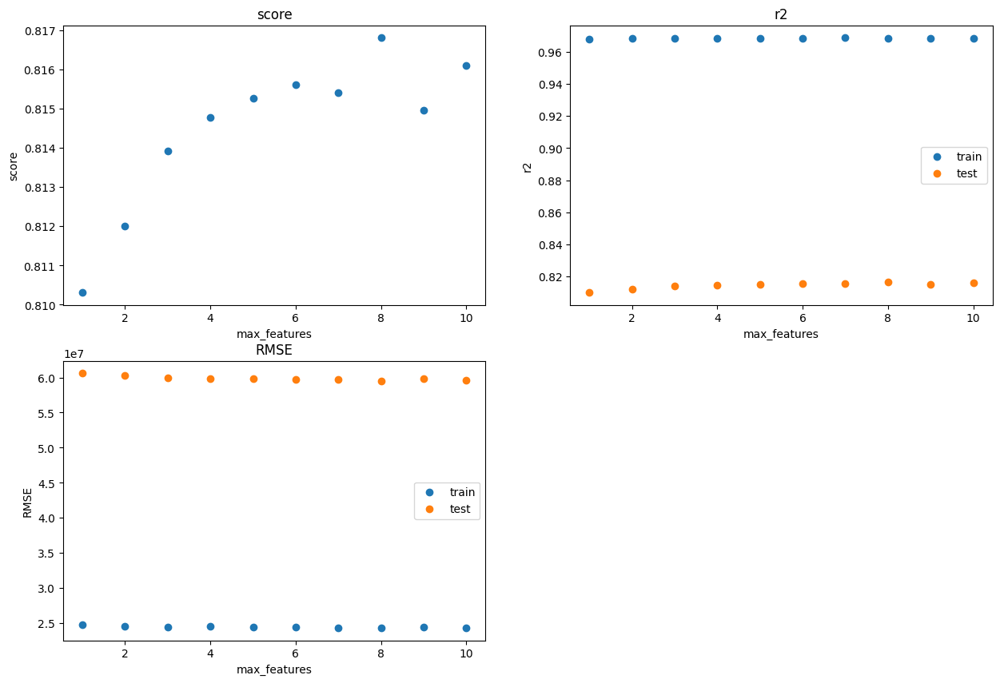

In [197]:
max_features = [1,2,3,4,5,6,7,8,9,10]
scores = []
r2_train_pred=[]
r2_train_test=[]
rmse_train_pred=[]
rmse_test_pred=[]


for k in max_features:
    rf_regressor = RandomForestRegressor(n_estimators = 300,max_features=k)
    rf_regressor.fit(X_train, y_train)
    scores.append(rf_regressor.score(X_test, y_test))
    
    y_train_pred = rf_regressor.predict(X_train)
    r2_train = metrics.r2_score(y_train, y_train_pred)
    r2_train_pred.append(r2_train)
    
    y_test_pred = rf_regressor.predict(X_test)
    r2_test = metrics.r2_score(y_test, y_test_pred)
    r2_train_test.append(r2_test)
    
    rmse_train =np.sqrt(mean_squared_error(y_train,y_train_pred))
    rmse_train_pred.append(rmse_train)
    
    rmse_test =np.sqrt(mean_squared_error(y_test,y_test_pred))
    rmse_test_pred.append(rmse_test)
    

fig = plt.figure(figsize=(15,10))

ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223)


ax1.scatter(max_features,scores,marker="o")
ax2.scatter(max_features,r2_train_pred,marker="o",label="train")
ax2.scatter(max_features,r2_train_test,marker="o",label="test")

ax3.scatter(max_features,rmse_train_pred,marker="o",label="train")
ax3.scatter(max_features,rmse_test_pred,marker="o",label="test")


ax2.legend()
ax3.legend()


ax1.set_title('score')
ax1.set_xlabel('max_features')
ax1.set_ylabel('score')

ax2.set_title('r2')
ax2.set_xlabel('max_features')
ax2.set_ylabel('r2')


ax3.set_title('RMSE')
ax3.set_xlabel('max_features')
ax3.set_ylabel('RMSE')

plt.show()

Profundidad maxima

In [198]:
randomforest_optimo = RandomForestRegressor(n_estimators = 300)
randomforest_optimo.fit(X_train,y_train)

RandomForestRegressor(n_estimators=300)

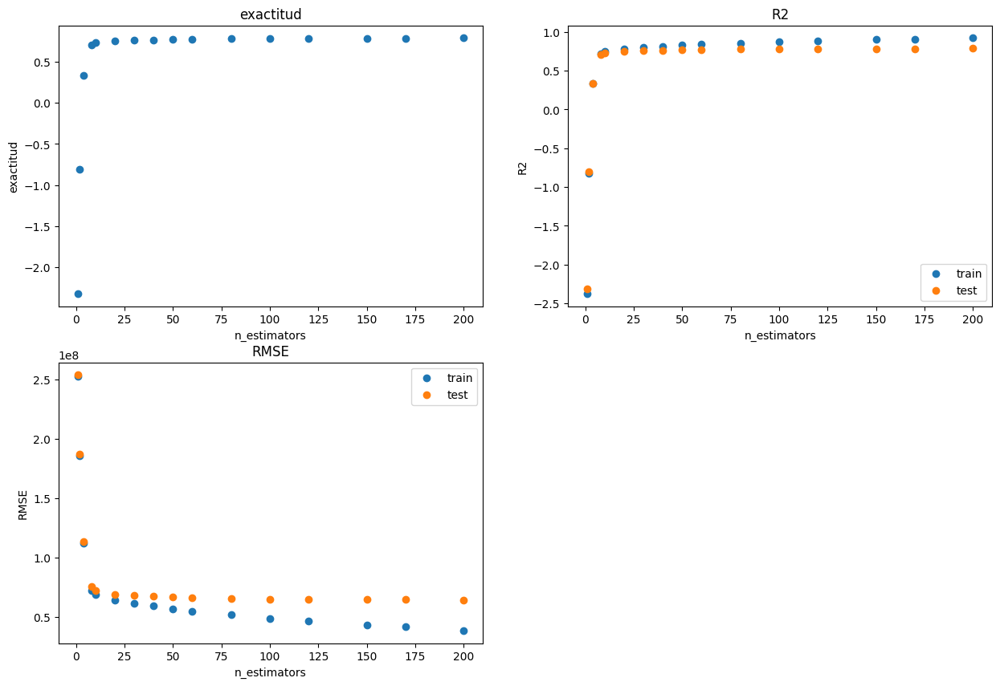

In [199]:
n_estimators = [1, 2, 4, 8, 10, 20, 30, 40, 50, 60,80, 100,120, 150, 170, 200]
scores = []
r2_train_pred=[]
r2_train_test=[]
rmse_train_pred=[]
rmse_test_pred=[]


for k in n_estimators:
    xgb_regressor = xgboost.XGBRegressor(n_estimators=k)
    xgb_regressor.fit(X_train, y_train)
    scores.append(xgb_regressor.score(X_test, y_test))
    
    y_train_pred = xgb_regressor.predict(X_train)
    r2_train = metrics.r2_score(y_train, y_train_pred)
    r2_train_pred.append(r2_train)
    
    y_test_pred = xgb_regressor.predict(X_test)
    r2_test = metrics.r2_score(y_test, y_test_pred)
    r2_train_test.append(r2_test)
    
    rmse_train =np.sqrt(mean_squared_error(y_train,y_train_pred))
    rmse_train_pred.append(rmse_train)
    
    rmse_test =np.sqrt(mean_squared_error(y_test,y_test_pred))
    rmse_test_pred.append(rmse_test)
    

fig = plt.figure(figsize=(15,10))

ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223)


ax1.scatter(n_estimators,scores,marker="o")
ax2.scatter(n_estimators,r2_train_pred,marker="o",label="train")
ax2.scatter(n_estimators,r2_train_test,marker="o",label="test")

ax3.scatter(n_estimators,rmse_train_pred,marker="o",label="train")
ax3.scatter(n_estimators,rmse_test_pred,marker="o",label="test")

ax2.legend()
ax3.legend()


ax1.set_title('exactitud')
ax1.set_xlabel('n_estimators')
ax1.set_ylabel('exactitud')

ax2.set_title('R2')
ax2.set_xlabel('n_estimators')
ax2.set_ylabel('R2')


ax3.set_title('RMSE')
ax3.set_xlabel('n_estimators')
ax3.set_ylabel('RMSE')

plt.show()

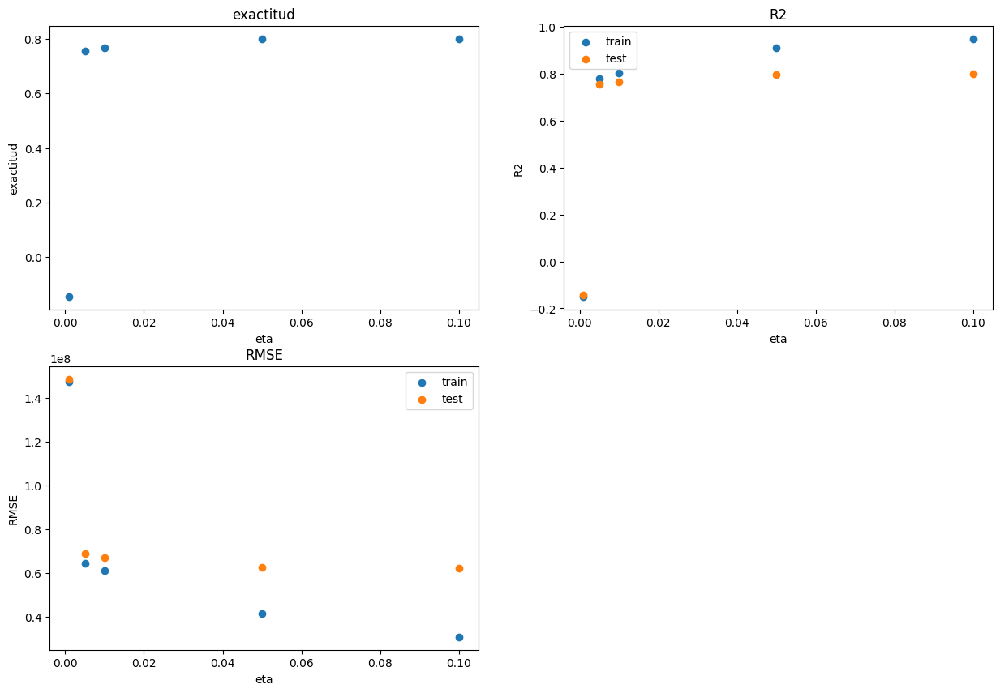

In [200]:
eta = [0.001, 0.005, 0.01, 0.05 ,0.1]
scores = []
r2_train_pred=[]
r2_train_test=[]
rmse_train_pred=[]
rmse_test_pred=[]


for k in eta:
    xgb_regressor = xgboost.XGBRegressor(n_estimators=1000, eta=k)
    xgb_regressor.fit(X_train, y_train)
    scores.append(xgb_regressor.score(X_test, y_test))
    
    y_train_pred = xgb_regressor.predict(X_train)
    r2_train = metrics.r2_score(y_train, y_train_pred)
    r2_train_pred.append(r2_train)
    
    y_test_pred = xgb_regressor.predict(X_test)
    r2_test = metrics.r2_score(y_test, y_test_pred)
    r2_train_test.append(r2_test)
    
    rmse_train =np.sqrt(mean_squared_error(y_train,y_train_pred))
    rmse_train_pred.append(rmse_train)
    
    rmse_test =np.sqrt(mean_squared_error(y_test,y_test_pred))
    rmse_test_pred.append(rmse_test)
    

fig = plt.figure(figsize=(15,10))

ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223)


ax1.scatter(eta,scores,marker="o")
ax2.scatter(eta,r2_train_pred,marker="o",label="train")
ax2.scatter(eta,r2_train_test,marker="o",label="test")

ax3.scatter(eta,rmse_train_pred,marker="o",label="train")
ax3.scatter(eta,rmse_test_pred,marker="o",label="test")

ax2.legend()
ax3.legend()


ax1.set_title('exactitud')
ax1.set_xlabel('eta')
ax1.set_ylabel('exactitud')

ax2.set_title('R2')
ax2.set_xlabel('eta')
ax2.set_ylabel('R2')


ax3.set_title('RMSE')
ax3.set_xlabel('eta')
ax3.set_ylabel('RMSE')

plt.show()

In [201]:
xgboost_regressor_optimo =xgboost.XGBRegressor(n_estimators=1000, learning_rate=0.1, n_jobs=4)
xgboost_regressor_optimo.fit(X_train,y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.1, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=1000,
             n_jobs=4, num_parallel_tree=1, predictor='auto', random_state=0,
             reg_alpha=0, reg_lambda=1, ...)

### Resultados ajustados con subconjunto de datos 2

Modelo: Regresion Lineal
R2 en Train: 0.6200834708178123
R2 ajustado en train: 0.6186749011212532
--------------------------
R2 en test: 0.6372752673064543
R2 ajustado en Test: 0.6318343963160511
--------------------------
RMSE en train: 84753985.12468371
RMSE en test: 83770503.10493058
--------------------------
MAE en train: 65341981.8904667
MAE en test: 64515463.73923532
--------------------------
MAPE en train: 0.22958255555710014
MAPE en test: 0.225507712313094


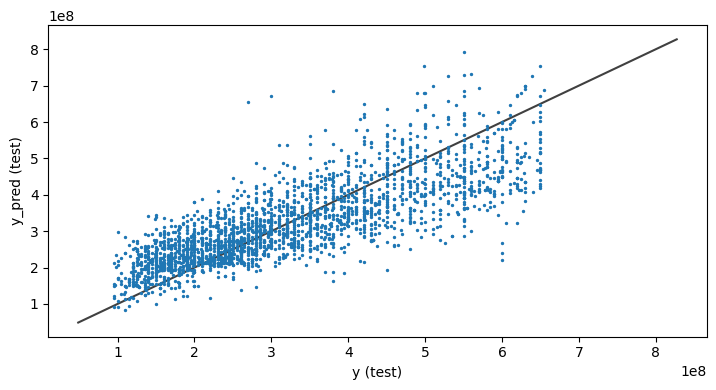

Modelo: Árbol de Decisión optimo
R2 en Train: 0.6930476948363262
R2 ajustado en train: 0.6919096456014766
--------------------------
R2 en test: 0.6737701461855816
R2 ajustado en Test: 0.6688766983783654
--------------------------
RMSE en train: 76181844.40296194
RMSE en test: 79444601.29436885
--------------------------
MAE en train: 57556892.491115585
MAE en test: 59407054.5710741
--------------------------
MAPE en train: 0.20107225109070587
MAPE en test: 0.20343734054471735


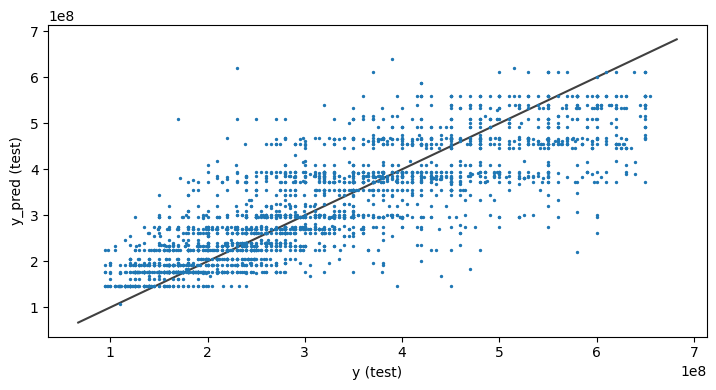

Modelo: Vecinos más cercanos optimo
R2 en Train: 0.8461833552996281
R2 ajustado en train: 0.8456130682815356
--------------------------
R2 en test: 0.7033277763917565
R2 ajustado en Test: 0.6988776930376328
--------------------------
RMSE en train: 53928420.455027714
RMSE en test: 75760177.30898745
--------------------------
MAE en train: 36067448.444612816
MAE en test: 52767784.42525252
--------------------------
MAPE en train: 0.12406258398095027
MAPE en test: 0.1794554653933299


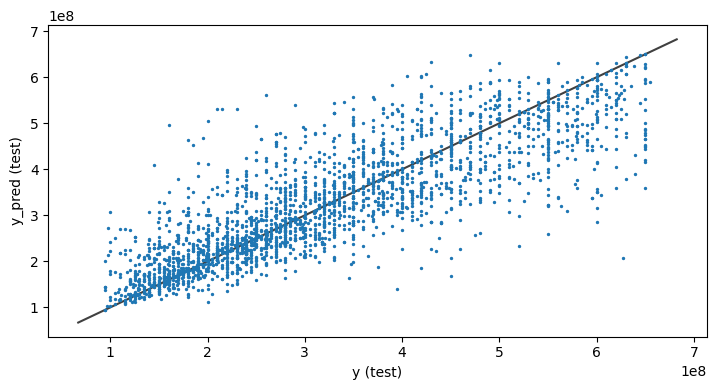

Modelo: Random Forest optimo
R2 en Train: 0.9674364216595687
R2 ajustado en train: 0.9673156896931007
--------------------------
R2 en test: 0.8041656010791551
R2 ajustado en Test: 0.8012280850953425
--------------------------
RMSE en train: 24813161.064634964
RMSE en test: 61552688.77149427
--------------------------
MAE en train: 16806460.27582827
MAE en test: 41902561.03488113
--------------------------
MAPE en train: 0.05837479946730371
MAPE en test: 0.14362842655032101


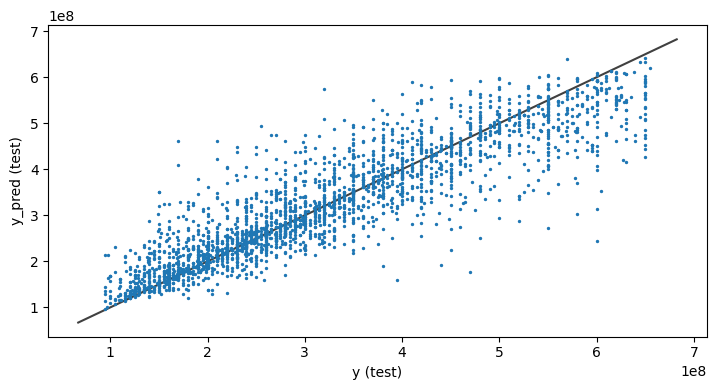

Modelo: XGB optimo
R2 en Train: 0.9497091026162727
R2 ajustado en train: 0.949522645253599
--------------------------
R2 en test: 0.8004960962281832
R2 ajustado en Test: 0.797503537671606
--------------------------
RMSE en train: 30836190.921910528
RMSE en test: 62126693.19318917
--------------------------
MAE en train: 21410298.69277394
MAE en test: 43157639.96363636
--------------------------
MAPE en train: 0.07474755280085553
MAPE en test: 0.14604677439607805


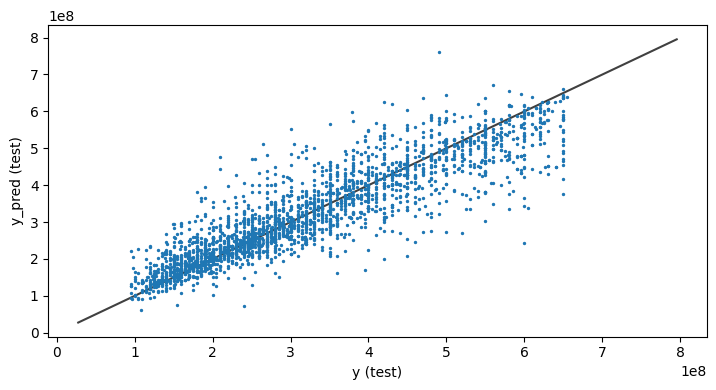

In [202]:
models2 = [ 'Regresion Lineal','Árbol de Decisión optimo', 'Vecinos más cercanos optimo',  'Random Forest optimo', 'XGB optimo']
for i, model in enumerate([linear_regressor, arbol_optimo, knn_optimo, randomforest_optimo,xgboost_regressor_optimo]):
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    print(f'Modelo: {models2[i]}')
    
    r2_train= metrics.r2_score(y_train, y_train_pred)
    r2_test= metrics.r2_score(y_test, y_test_pred)
    
    adj_r2_train = 1 - ((1 - r2_train) * (len(y_train) - 1)) / (len(y_train) - X_train.shape[1] - 1)
    adj_r2_test = 1 - ((1 - r2_test) * (len(y_test) - 1)) / (len(y_test) - X_test.shape[1] - 1)
    
    RMSE_train=np.sqrt(mean_squared_error(y_train,y_train_pred))
    RMSE_test=np.sqrt(mean_squared_error(y_test,y_test_pred))
    
    MAE_train=mean_absolute_error(y_train,y_train_pred)
    MAE_test=mean_absolute_error(y_test,y_test_pred)
    
    MAPE_train=mean_absolute_percentage_error(y_train,y_train_pred)
    MAPE_test=mean_absolute_percentage_error(y_test,y_test_pred)

    print("R2 en Train:", r2_train)
    print("R2 ajustado en train:", adj_r2_train)
    print("--------------------------")
    print("R2 en test:", r2_test)
    print("R2 ajustado en Test:", adj_r2_test)
    print("--------------------------")
    print("RMSE en train:",RMSE_train)
    print("RMSE en test:",RMSE_test)
    print("--------------------------")
    print("MAE en train:",MAE_train)
    print("MAE en test:",MAE_test)
    print("--------------------------")
    print("MAPE en train:",MAPE_train)
    print("MAPE en test:",MAPE_test)
    

    plt.figure(figsize = (14,4))
   
    ax = plt.subplot(1,2,2)
    ax.scatter(y_test,y_test_pred, s =2)
    
    lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes]
    ]
    
    ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
    plt.xlabel('y (test)')
    plt.ylabel('y_pred (test)')
    
    plt.tight_layout()
    plt.show()

## Modelos con subconjunto de datos 3

In [203]:
df3=viviendas_Medellin_loc

In [204]:
df3.columns

Index(['id', 'fecha_publicacion', 'latitud', 'longitud', 'pais',
       'departamento', 'municipio', 'barrio', 'habitaciones', 'baños',
       'superficie_total', 'superficie_cubierta', 'precio', 'moneda', 'titulo',
       'descripcion', 'tipo_propiedad', 'precio_m2'],
      dtype='object')

In [205]:
df3=df3[['latitud', 'longitud', 'municipio', 'habitaciones', 'baños', 'superficie_total', 'precio', 'tipo_propiedad']]

In [206]:
df3= pd.get_dummies(data=df3,prefix="municipio",columns=["municipio"])

In [207]:
df3= pd.get_dummies(data=df3,prefix="property_type",columns=["tipo_propiedad"])

In [208]:
df3.columns

Index(['latitud', 'longitud', 'habitaciones', 'baños', 'superficie_total',
       'precio', 'municipio_barbosa', 'municipio_bello', 'municipio_caldas',
       'municipio_copacabana', 'municipio_envigado', 'municipio_girardota',
       'municipio_itagui', 'municipio_la estrella', 'municipio_medellín',
       'municipio_sabaneta', 'property_type_casa',
       'property_type_departamento'],
      dtype='object')

In [209]:
X_3 = df3.drop('precio',axis=1)
y_3 = df3['precio']
X_3.head()
X_3.describe()
X_3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13199 entries, 70 to 562568
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   latitud                     13199 non-null  float64
 1   longitud                    13199 non-null  float64
 2   habitaciones                13199 non-null  float64
 3   baños                       13199 non-null  float64
 4   superficie_total            13199 non-null  float64
 5   municipio_barbosa           13199 non-null  uint8  
 6   municipio_bello             13199 non-null  uint8  
 7   municipio_caldas            13199 non-null  uint8  
 8   municipio_copacabana        13199 non-null  uint8  
 9   municipio_envigado          13199 non-null  uint8  
 10  municipio_girardota         13199 non-null  uint8  
 11  municipio_itagui            13199 non-null  uint8  
 12  municipio_la estrella       13199 non-null  uint8  
 13  municipio_medellín          1

Datos de entrenamiento y datos de prueba

In [210]:
X_train,X_test,y_train,y_test = train_test_split(X_3,y_3,train_size=0.8,test_size=0.2,random_state=42)

scale = preprocessing.StandardScaler()
scale.fit(X_train)
X_train = scale.transform(X_train)
X_test = scale.transform(X_test)

#### LinearRegression

In [211]:
linear_regressor = LinearRegression()
linear_regressor.fit(X_train,y_train)

LinearRegression()

In [212]:
y_linear_train_pred= linear_regressor.predict(X_train)
y_linear_test_pred=linear_regressor.predict(X_test)

#### Arbol de decision

In [213]:
arbol_regressor = DecisionTreeRegressor(random_state=42)
arbol_regressor.fit(X_train,y_train)

DecisionTreeRegressor(random_state=42)

In [214]:
y_arbol_pred_train = arbol_regressor.predict(X_train)
y_arbol_pred_test = arbol_regressor.predict(X_test)

#### KNN Vecinos mas cercanos

In [215]:
knn_regressor = KNeighborsRegressor()

In [216]:
knn_regressor.fit(X_train,y_train)

KNeighborsRegressor()

In [217]:
y_knn_pred_train = knn_regressor.predict(X_train)
y_knn_pred_test = knn_regressor.predict(X_test)

#### XG Boost Regressor

In [218]:
xgboost_regressor = xgboost.XGBRegressor() 

In [219]:
xgboost_regressor.fit(X_train,y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, ...)

In [220]:
y_xgb_train_pred= xgboost_regressor.predict(X_train)
y_xgb_test_pred=xgboost_regressor.predict(X_test)

#### Random Forest

In [221]:
randomforest_regressor = RandomForestRegressor()

In [222]:
randomforest_regressor.fit(X_train,y_train)

RandomForestRegressor()

In [223]:
y_rf_train_pred= randomforest_regressor.predict(X_train)
y_rf_test_pred=randomforest_regressor.predict(X_test)

### Resultados modelos iniciales con el conjunto de datos 3

Modelo: Regresión lineal
R2 en Train: 0.5832046846015941
R2 ajustado en train: 0.5825324978677195
--------------------------
R2 en test: 0.6066358161267305
R2 ajustado en Test: 0.6040853999841502
--------------------------
RMSE en train: 88772295.03483161
RMSE en test: 87236844.15166783
--------------------------
MAE en train: 68446466.98522495
MAE en test: 67851359.75813195
--------------------------
MAPE en train: 0.24450462227200717
MAPE en test: 0.24195290087172786


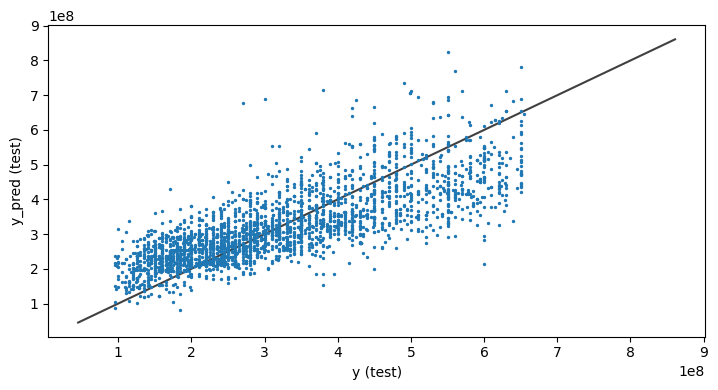

Modelo: Árbol de Decisión
R2 en Train: 0.9953200970713455
R2 ajustado en train: 0.9953125495568984
--------------------------
R2 en test: 0.6607139388800582
R2 ajustado en Test: 0.6585141436706612
--------------------------
RMSE en train: 9406638.533562845
RMSE en test: 81018751.79618506
--------------------------
MAE en train: 2104110.8697288022
MAE en test: 49574538.41587915
--------------------------
MAPE en train: 0.008019572291274419
MAPE en test: 0.17033808178369125


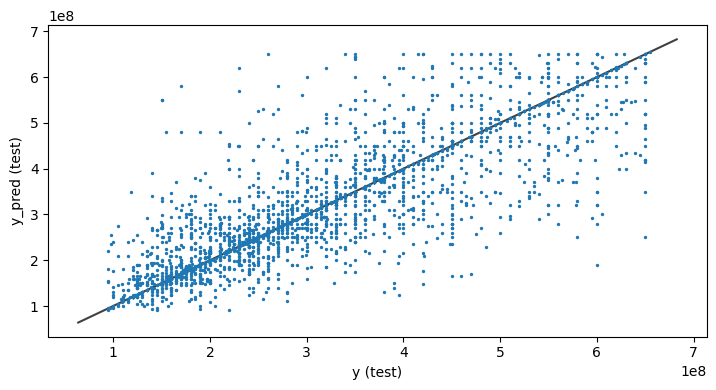

Modelo: Vecinos más cercanos
R2 en Train: 0.7764299589372556
R2 ajustado en train: 0.7760693963058102
--------------------------
R2 en test: 0.6847786641068787
R2 ajustado en Test: 0.6827348949573047
--------------------------
RMSE en train: 65016387.72063993
RMSE en test: 78092682.58482215
--------------------------
MAE en train: 46230263.21943366
MAE en test: 56509611.76803031
--------------------------
MAPE en train: 0.15944534097747126
MAPE en test: 0.1947548946619036


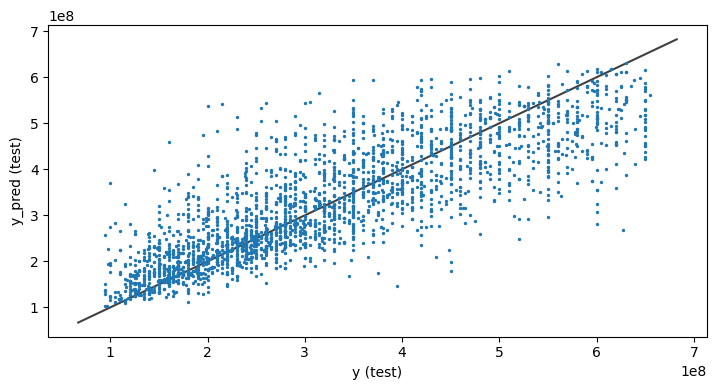

Modelo: Regresión XG Boosting
R2 en Train: 0.875614236633731
R2 ajustado en train: 0.8754136334673116
--------------------------
R2 en test: 0.7823114432567138
R2 ajustado en Test: 0.7809000376637939
--------------------------
RMSE en train: 48495492.17042971
RMSE en test: 64896360.137242116
--------------------------
MAE en train: 35392308.84108344
MAE en test: 47477123.72575758
--------------------------
MAPE en train: 0.12244693767867079
MAPE en test: 0.16128956875333217


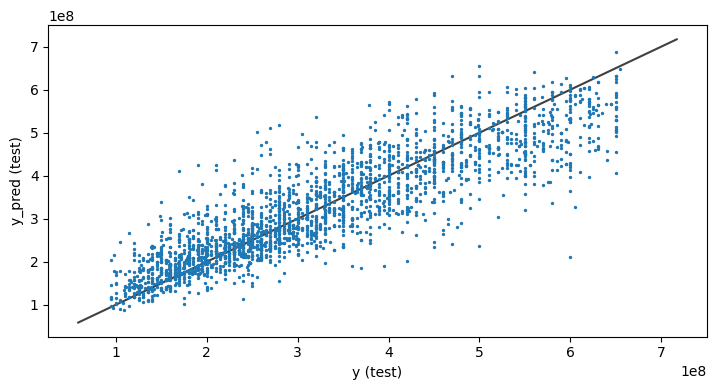

Modelo: Random Forest
R2 en Train: 0.9652825498539034
R2 ajustado en train: 0.9652265592787698
--------------------------
R2 en test: 0.8020062513125282
R2 ajustado en Test: 0.8007225389831282
--------------------------
RMSE en train: 25620638.197936166
RMSE en test: 61891110.92988014
--------------------------
MAE en train: 17165269.882037938
MAE en test: 42053740.6041403
--------------------------
MAPE en train: 0.059775016262024916
MAPE en test: 0.14524690389503217


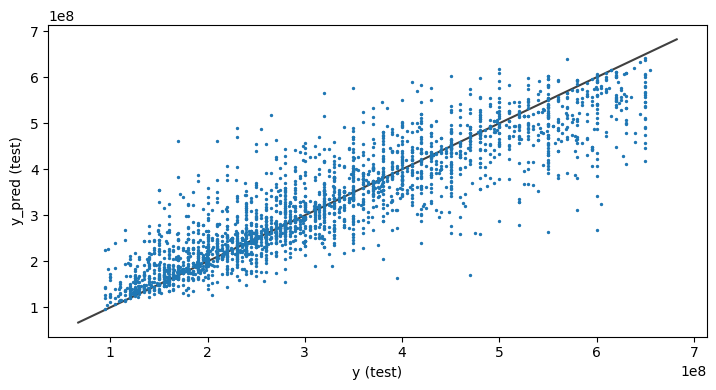

In [224]:
models = ['Regresión lineal', 'Árbol de Decisión', 'Vecinos más cercanos', 'Regresión XG Boosting', 'Random Forest']

for i, model in enumerate([linear_regressor, arbol_regressor, knn_regressor, xgboost_regressor, randomforest_regressor]):
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    print(f'Modelo: {models[i]}')
    
    r2_train= metrics.r2_score(y_train, y_train_pred)
    r2_test= metrics.r2_score(y_test, y_test_pred)
    
    adj_r2_train = 1 - ((1 - r2_train) * (len(y_train) - 1)) / (len(y_train) - X_train.shape[1] - 1)
    adj_r2_test = 1 - ((1 - r2_test) * (len(y_test) - 1)) / (len(y_test) - X_test.shape[1] - 1)
    
    RMSE_train=np.sqrt(mean_squared_error(y_train,y_train_pred))
    RMSE_test=np.sqrt(mean_squared_error(y_test,y_test_pred))
    
    MAE_train=mean_absolute_error(y_train,y_train_pred)
    MAE_test=mean_absolute_error(y_test,y_test_pred)
    
    MAPE_train=mean_absolute_percentage_error(y_train,y_train_pred)
    MAPE_test=mean_absolute_percentage_error(y_test,y_test_pred)



    print("R2 en Train:", r2_train)
    print("R2 ajustado en train:", adj_r2_train)
    print("--------------------------")
    print("R2 en test:", r2_test)
    print("R2 ajustado en Test:", adj_r2_test)
    print("--------------------------")
    print("RMSE en train:",RMSE_train)
    print("RMSE en test:",RMSE_test)
    print("--------------------------")
    print("MAE en train:",MAE_train)
    print("MAE en test:",MAE_test)
    print("--------------------------")
    print("MAPE en train:",MAPE_train)
    print("MAPE en test:",MAPE_test)
    

    plt.figure(figsize = (14,4))
   
    ax = plt.subplot(1,2,2)
    ax.scatter(y_test,y_test_pred, s =2)
    
    lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes]
    ]
    
    ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
    plt.xlabel('y (test)')
    plt.ylabel('y_pred (test)')
    
    plt.tight_layout()
    plt.show()

### Ajuste de los Modelos

#### Ajuste arbol decision

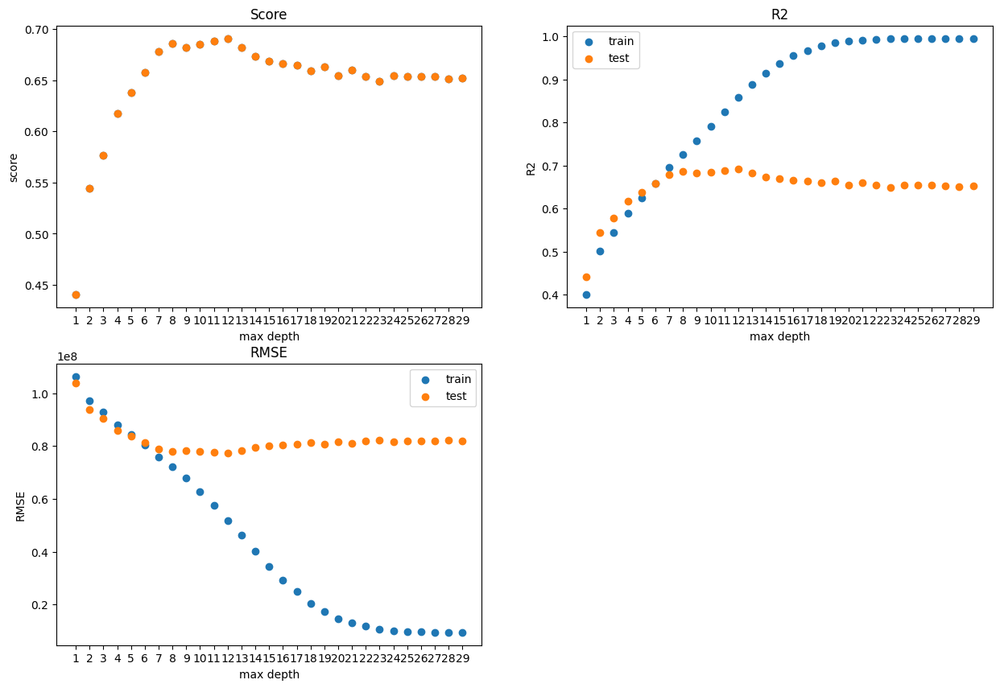

In [225]:
MAX_DEPTH_range = range(1, 30)
scores = []
arbol_r2_train_pred=[]
arbol_r2_test_pred=[]
arbol_rmse_train_pred=[]
arbol_rmse_test_pred=[]

for k in MAX_DEPTH_range:
    arbol_regressor = DecisionTreeRegressor(max_depth=k,random_state=42)
    arbol_regressor.fit(X_train, y_train)
    scores.append(arbol_regressor.score(X_test, y_test))
    
    y_train_pred = arbol_regressor.predict(X_train)
    y_test_pred = arbol_regressor.predict(X_test)
    
    arbol_r2_train = metrics.r2_score(y_train, y_train_pred)
    arbol_r2_train_pred.append(arbol_r2_train)
    arbol_r2_test = metrics.r2_score(y_test, y_test_pred)
    arbol_r2_test_pred.append(arbol_r2_test)
    
    arbol_rmse_train =np.sqrt(mean_squared_error(y_train,y_train_pred))
    arbol_rmse_train_pred.append(arbol_rmse_train)
    
    arbol_rmse_test =np.sqrt(mean_squared_error(y_test,y_test_pred))
    arbol_rmse_test_pred.append(arbol_rmse_test)
    
fig = plt.figure(figsize=(15,10))

ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223)

ax1.scatter(MAX_DEPTH_range,scores,marker="o")
ax1.scatter(MAX_DEPTH_range,scores,marker="o")

ax2.scatter(MAX_DEPTH_range,arbol_r2_train_pred,marker="o",label="train")
ax2.scatter(MAX_DEPTH_range,arbol_r2_test_pred,marker="o",label="test")

ax3.scatter(MAX_DEPTH_range,arbol_rmse_train_pred,marker="o",label="train")
ax3.scatter(MAX_DEPTH_range,arbol_rmse_test_pred,marker="o",label="test")

ax1.set_xticks(MAX_DEPTH_range)
ax2.set_xticks(MAX_DEPTH_range)
ax3.set_xticks(MAX_DEPTH_range)

ax2.legend()
ax3.legend()

ax1.set_title('Score')
ax1.set_xlabel('max depth')
ax1.set_ylabel('score')

ax2.set_title('R2')
ax2.set_xlabel('max depth')
ax2.set_ylabel('R2')

ax3.set_title('RMSE')
ax3.set_xlabel('max depth')
ax3.set_ylabel('RMSE')

plt.show()

La profundidad optima del arbol de decision se encuentra en 7, valor que es justificado al comparar con el grafico de R2

In [226]:
arbol_optimo = DecisionTreeRegressor(max_depth= 7,random_state=42)
arbol_optimo.fit(X_train,y_train)

DecisionTreeRegressor(max_depth=7, random_state=42)

#### Ajuste knn

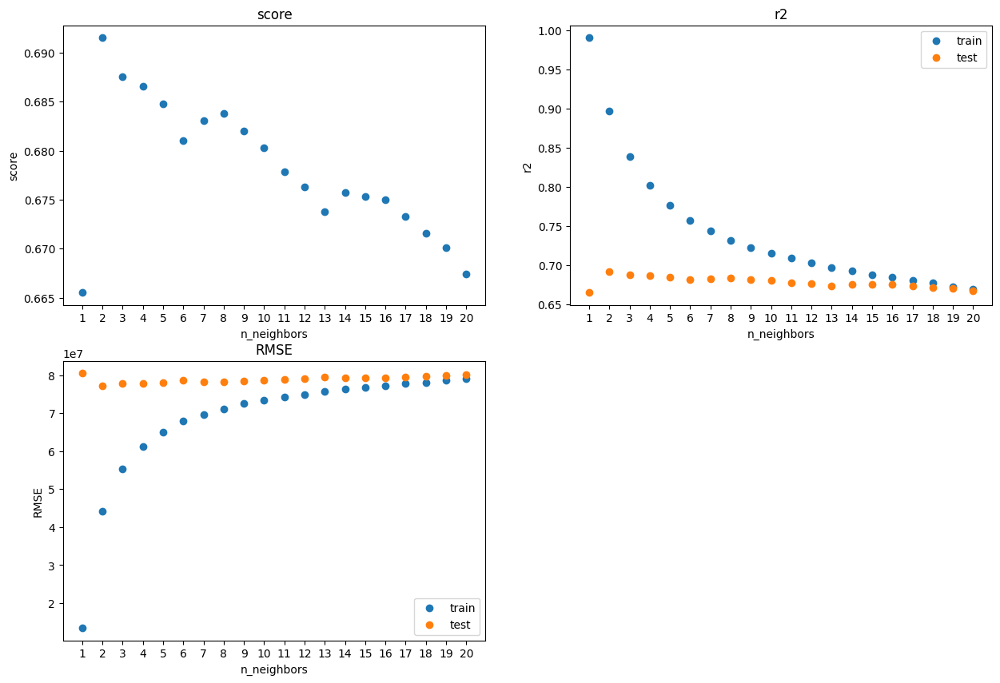

In [227]:
k_range = range(1, 21)
scores = []
r2_train_pred=[]
r2_train_test=[]
rmse_train_pred=[]
rmse_test_pred=[]

for k in k_range:
    knn_regressor = KNeighborsRegressor(n_neighbors = k)
    knn_regressor.fit(X_train, y_train)
    scores.append(knn_regressor.score(X_test, y_test))
    
    y_train_pred = knn_regressor.predict(X_train)
    r2_train = metrics.r2_score(y_train, y_train_pred)
    r2_train_pred.append(r2_train)
    
    y_test_pred = knn_regressor.predict(X_test)
    r2_test = metrics.r2_score(y_test, y_test_pred)
    r2_train_test.append(r2_test)
    
    rmse_train =np.sqrt(mean_squared_error(y_train,y_train_pred))
    rmse_train_pred.append(rmse_train)
    
    rmse_test =np.sqrt(mean_squared_error(y_test,y_test_pred))
    rmse_test_pred.append(rmse_test)
    

fig = plt.figure(figsize=(15,10))

ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223)


ax1.scatter(k_range,scores,marker="o")
ax2.scatter(k_range,r2_train_pred,marker="o",label="train")
ax2.scatter(k_range,r2_train_test,marker="o",label="test")

ax3.scatter(k_range,rmse_train_pred,marker="o",label="train")
ax3.scatter(k_range,rmse_test_pred,marker="o",label="test")

ax1.set_xticks(k_range)
ax2.set_xticks(k_range)
ax3.set_xticks(k_range)


ax2.legend()
ax3.legend()


ax1.set_title('score')
ax1.set_xlabel('n_neighbors')
ax1.set_ylabel('score')

ax2.set_title('r2')
ax2.set_xlabel('n_neighbors')
ax2.set_ylabel('r2')


ax3.set_title('RMSE')
ax3.set_xlabel('n_neighbors')
ax3.set_ylabel('RMSE')

plt.show()

El numero optimo de vecinos mas cercanos se encuentra en 3, donde encontramos una exactitud de 0.75, aunque el r2 en este caso se ve algo afectado si consideramos Train, aun asi en Test encontramos el punto mas alto en 3

In [228]:
knn_optimo = KNeighborsRegressor(n_neighbors=3)
knn_optimo.fit(X_train,y_train)

KNeighborsRegressor(n_neighbors=3)

#### Ajuste Random Forest

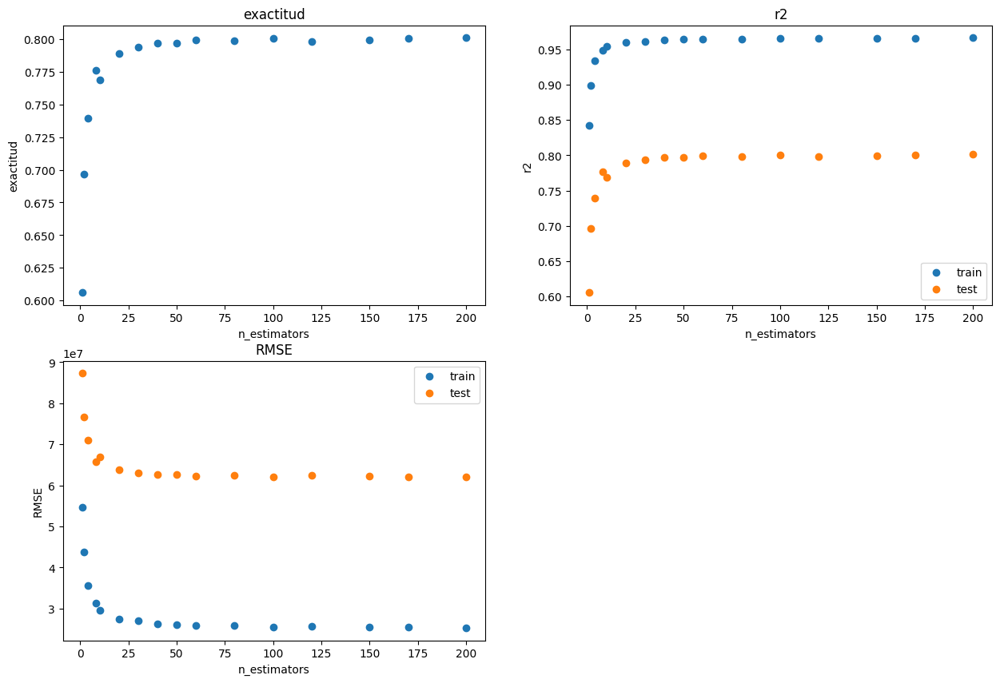

In [229]:
n_estimators = [1, 2, 4, 8, 10, 20, 30, 40, 50, 60,80, 100,120, 150, 170, 200]
scores = []
r2_train_pred=[]
r2_train_test=[]
rmse_train_pred=[]
rmse_test_pred=[]


for k in n_estimators:
    rf_regressor = RandomForestRegressor(n_estimators=k)
    rf_regressor.fit(X_train, y_train)
    scores.append(rf_regressor.score(X_test, y_test))
    
    y_train_pred = rf_regressor.predict(X_train)
    r2_train = metrics.r2_score(y_train, y_train_pred)
    r2_train_pred.append(r2_train)
    
    y_test_pred = rf_regressor.predict(X_test)
    r2_test = metrics.r2_score(y_test, y_test_pred)
    r2_train_test.append(r2_test)
    
    rmse_train =np.sqrt(mean_squared_error(y_train,y_train_pred))
    rmse_train_pred.append(rmse_train)
    
    rmse_test =np.sqrt(mean_squared_error(y_test,y_test_pred))
    rmse_test_pred.append(rmse_test)
    

fig = plt.figure(figsize=(15,10))

ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223)


ax1.scatter(n_estimators,scores,marker="o")
ax2.scatter(n_estimators,r2_train_pred,marker="o",label="train")
ax2.scatter(n_estimators,r2_train_test,marker="o",label="test")

ax3.scatter(n_estimators,rmse_train_pred,marker="o",label="train")
ax3.scatter(n_estimators,rmse_test_pred,marker="o",label="test")

ax2.legend()
ax3.legend()


ax1.set_title('exactitud')
ax1.set_xlabel('n_estimators')
ax1.set_ylabel('exactitud')

ax2.set_title('r2')
ax2.set_xlabel('n_estimators')
ax2.set_ylabel('r2')


ax3.set_title('RMSE')
ax3.set_xlabel('n_estimators')
ax3.set_ylabel('RMSE')

plt.show()

Profundidad maxima

In [230]:
randomforest_optimo = RandomForestRegressor(n_estimators = 300)
randomforest_optimo.fit(X_train,y_train)

RandomForestRegressor(n_estimators=300)

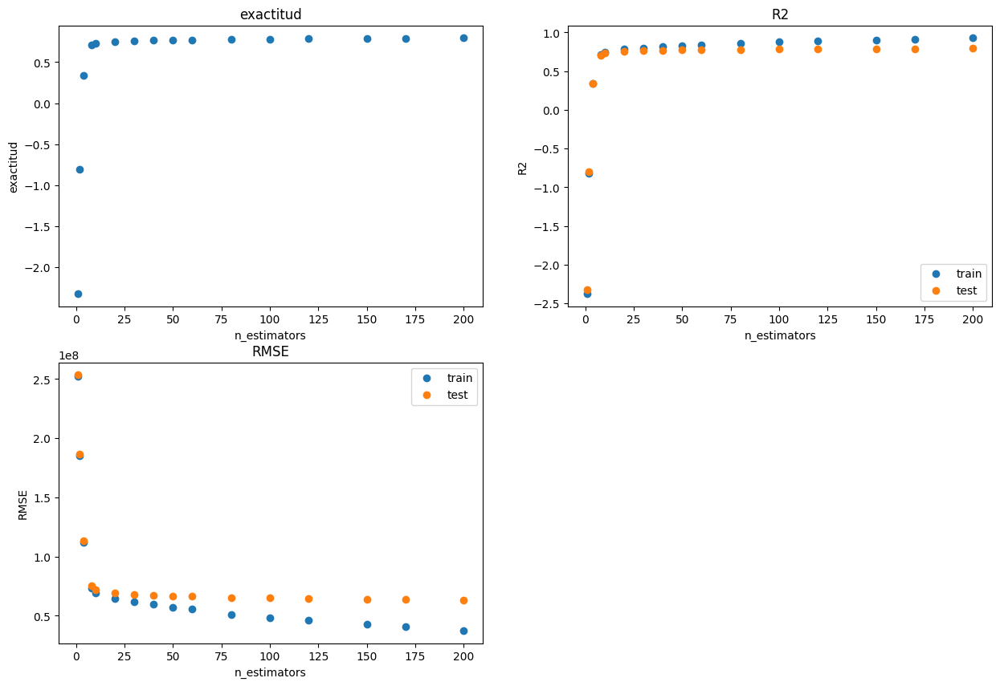

In [231]:
n_estimators = [1, 2, 4, 8, 10, 20, 30, 40, 50, 60,80, 100,120, 150, 170, 200]
scores = []
r2_train_pred=[]
r2_train_test=[]
rmse_train_pred=[]
rmse_test_pred=[]


for k in n_estimators:
    xgb_regressor = xgboost.XGBRegressor(n_estimators=k)
    xgb_regressor.fit(X_train, y_train)
    scores.append(xgb_regressor.score(X_test, y_test))
    
    y_train_pred = xgb_regressor.predict(X_train)
    r2_train = metrics.r2_score(y_train, y_train_pred)
    r2_train_pred.append(r2_train)
    
    y_test_pred = xgb_regressor.predict(X_test)
    r2_test = metrics.r2_score(y_test, y_test_pred)
    r2_train_test.append(r2_test)
    
    rmse_train =np.sqrt(mean_squared_error(y_train,y_train_pred))
    rmse_train_pred.append(rmse_train)
    
    rmse_test =np.sqrt(mean_squared_error(y_test,y_test_pred))
    rmse_test_pred.append(rmse_test)
    

fig = plt.figure(figsize=(15,10))

ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223)


ax1.scatter(n_estimators,scores,marker="o")
ax2.scatter(n_estimators,r2_train_pred,marker="o",label="train")
ax2.scatter(n_estimators,r2_train_test,marker="o",label="test")

ax3.scatter(n_estimators,rmse_train_pred,marker="o",label="train")
ax3.scatter(n_estimators,rmse_test_pred,marker="o",label="test")

ax2.legend()
ax3.legend()


ax1.set_title('exactitud')
ax1.set_xlabel('n_estimators')
ax1.set_ylabel('exactitud')

ax2.set_title('R2')
ax2.set_xlabel('n_estimators')
ax2.set_ylabel('R2')


ax3.set_title('RMSE')
ax3.set_xlabel('n_estimators')
ax3.set_ylabel('RMSE')

plt.show()

In [232]:
xgboost_regressor_optimo =xgboost.XGBRegressor(n_estimators=1000, learning_rate=0.1, n_jobs=4)
xgboost_regressor_optimo.fit(X_train,y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.1, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=1000,
             n_jobs=4, num_parallel_tree=1, predictor='auto', random_state=0,
             reg_alpha=0, reg_lambda=1, ...)

### Resultados ajustados de modelo con subconjunto de datos 3

Modelo: Regresion lineal
R2 en Train: 0.5832046846015941
R2 ajustado en train: 0.5825324978677195
--------------------------
R2 en test: 0.6066358161267305
R2 ajustado en Test: 0.6040853999841502
--------------------------
RMSE en train: 88772295.03483161
RMSE en test: 87236844.15166783
--------------------------
MAE en train: 68446466.98522495
MAE en test: 67851359.75813195
--------------------------
MAPE en train: 0.24450462227200717
MAPE en test: 0.24195290087172786


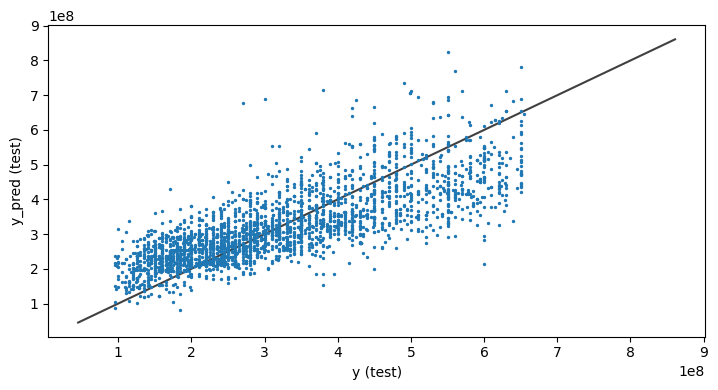

Modelo: Árbol de Decisión optimo
R2 en Train: 0.694866509278327
R2 ajustado en train: 0.6943744051760342
--------------------------
R2 en test: 0.6780573726619431
R2 ajustado en Test: 0.675970025345106
--------------------------
RMSE en train: 75955805.20472613
RMSE en test: 78920854.8977507
--------------------------
MAE en train: 57422284.201056935
MAE en test: 59478427.81293636
--------------------------
MAPE en train: 0.19907614010460967
MAPE en test: 0.20516703728867502


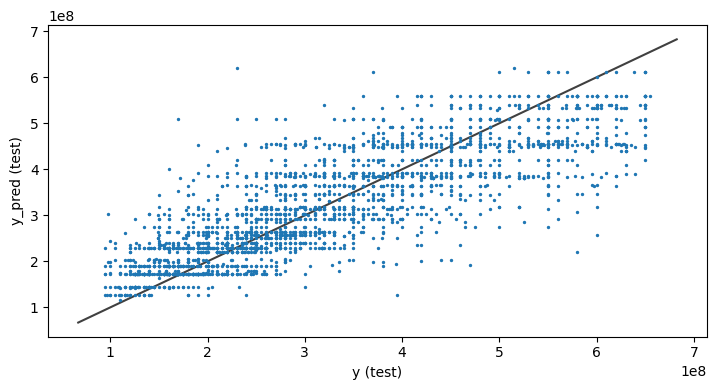

Modelo: Vecinos más cercanos optimo
R2 en Train: 0.8385725738148446
R2 ajustado en train: 0.8383122316988074
--------------------------
R2 en test: 0.6875060322869994
R2 ajustado en Test: 0.6854799463025901
--------------------------
RMSE en train: 55246490.449355766
RMSE en test: 77754110.63314848
--------------------------
MAE en train: 36968431.133851066
MAE en test: 53869933.31414141
--------------------------
MAPE en train: 0.12716890048178398
MAPE en test: 0.1841610944049799


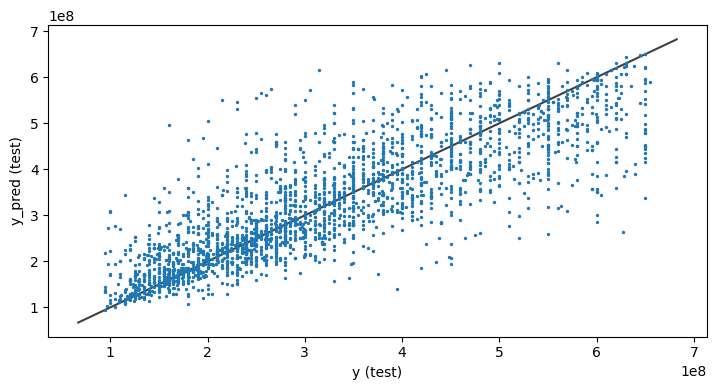

Modelo: Random Forest optimo
R2 en Train: 0.9661697366831206
R2 ajustado en train: 0.9661151769187352
--------------------------
R2 en test: 0.8009628743366467
R2 ajustado en Test: 0.7996723971679675
--------------------------
RMSE en train: 25291158.446817312
RMSE en test: 62053971.90283453
--------------------------
MAE en train: 17014468.240933537
MAE en test: 42074684.78044919
--------------------------
MAPE en train: 0.05916063027685166
MAPE en test: 0.14520772329363713


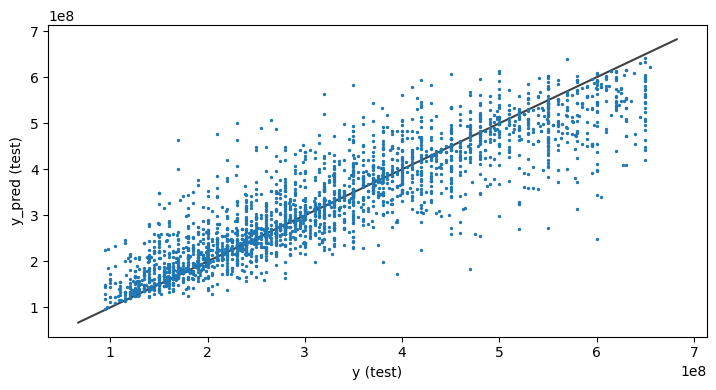

Modelo: XGB optimo
R2 en Train: 0.9534881889347178
R2 ajustado en train: 0.9534131770014942
--------------------------
R2 en test: 0.7996993904394594
R2 ajustado en Test: 0.7984007213461988
--------------------------
RMSE en train: 29654981.571923617
RMSE en test: 62250619.03658134
--------------------------
MAE en train: 20499343.899138175
MAE en test: 42802525.807575755
--------------------------
MAPE en train: 0.07206898314236707
MAPE en test: 0.14522232820970163


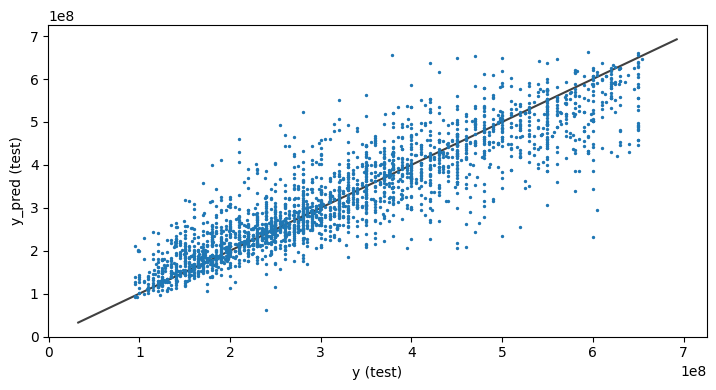

In [233]:
models2 = [ 'Regresion lineal','Árbol de Decisión optimo', 'Vecinos más cercanos optimo',  'Random Forest optimo', 'XGB optimo']
for i, model in enumerate([linear_regressor, arbol_optimo, knn_optimo, randomforest_optimo,xgboost_regressor_optimo]):
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    print(f'Modelo: {models2[i]}')
    
    r2_train= metrics.r2_score(y_train, y_train_pred)
    r2_test= metrics.r2_score(y_test, y_test_pred)
    
    adj_r2_train = 1 - ((1 - r2_train) * (len(y_train) - 1)) / (len(y_train) - X_train.shape[1] - 1)
    adj_r2_test = 1 - ((1 - r2_test) * (len(y_test) - 1)) / (len(y_test) - X_test.shape[1] - 1)
    
    RMSE_train=np.sqrt(mean_squared_error(y_train,y_train_pred))
    RMSE_test=np.sqrt(mean_squared_error(y_test,y_test_pred))
    
    MAE_train=mean_absolute_error(y_train,y_train_pred)
    MAE_test=mean_absolute_error(y_test,y_test_pred)
    
    MAPE_train=mean_absolute_percentage_error(y_train,y_train_pred)
    MAPE_test=mean_absolute_percentage_error(y_test,y_test_pred)

    print("R2 en Train:", r2_train)
    print("R2 ajustado en train:", adj_r2_train)
    print("--------------------------")
    print("R2 en test:", r2_test)
    print("R2 ajustado en Test:", adj_r2_test)
    print("--------------------------")
    print("RMSE en train:",RMSE_train)
    print("RMSE en test:",RMSE_test)
    print("--------------------------")
    print("MAE en train:",MAE_train)
    print("MAE en test:",MAE_test)
    print("--------------------------")
    print("MAPE en train:",MAPE_train)
    print("MAPE en test:",MAPE_test)
    

    plt.figure(figsize = (14,4))
   
    ax = plt.subplot(1,2,2)
    ax.scatter(y_test,y_test_pred, s =2)
    
    lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes]
    ]
    
    ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
    plt.xlabel('y (test)')
    plt.ylabel('y_pred (test)')
    
    plt.tight_layout()
    plt.show()